<a href="https://colab.research.google.com/github/MayaMM99/IST-718/blob/master/covid_19_pynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### COVID-19 mobility + CoreData.csv + Sociodemographic data and Google Mobility Data

In [ ]:
import pandas as pd
#! pip install wget
#import wget
# code reference 
import numpy as np
# Import
# ======

# essential libraries
import math
import random
from datetime import timedelta
from urllib.request import urlopen
import json

# storing and anaysis
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
from pandas.plotting import register_matplotlib_converters
import seaborn as sns
sns.set_palette("Paired")
sns.set_style("whitegrid")
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
# import calmap
import folium

# color pallette
cnf, dth, rec, act = '#bce784', '#5dd39e', '#348aa7', '#513b56' 

# converter
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()   

# hide warnings
import warnings
warnings.filterwarnings('ignore')

# to USA states details
!pip install us
import us

#!pip install -U plotly # plots won`t work without updating it 

# predictions
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error
from math import sqrt
import scipy 
scipy.version.full_version
#scipy.version.full_version
#import scipy.stscipy.sth
import pylab

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from statsmodels.tsa.arima_model import ARIMA 
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.arima_model import ARIMAResults

from pandas import Series
from statistics import mean
from statistics import median
from math import sqrt
import math

import itertools
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 300)
from google.colab import files


import statsmodels.api as sm  # statistical models (including regression)
import statsmodels.formula.api as smf  # R-like model specification

from scipy.stats import boxcox
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf

!pip install pmdarima
import pmdarima as pm
from pmdarima.arima import auto_arima

pd.plotting.register_matplotlib_converters() 


In [ ]:
plt.style.use('fivethirtyeight')
sns.set_palette("Paired")
sns.set_style("whitegrid")

![alt text](https://media.giphy.com/media/Qu1fT51CG14ksIkASL/giphy.gif)

Data has been preprocessed  and cleaned prior importing. (https://colab.research.google.com/drive/1wabD0uZmseo84UZ6pgQhYBrNUdu6gt5Y#scrollTo=fIoCPA1Tm6VS)

In [ ]:
df_mobility = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/Global_Mobility_Report.csv')
df_core = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/CoreData.csv')

In [ ]:
df_mobility.isna().sum() # only this one have to be cleanes 

country_region_code                                       85
country_region                                             0
sub_region_1                                           11220
sub_region_2                                          110756
date                                                       0
retail_and_recreation_percent_change_from_baseline     64008
grocery_and_pharmacy_percent_change_from_baseline      72496
parks_percent_change_from_baseline                    190119
transit_stations_percent_change_from_baseline         156777
workplaces_percent_change_from_baseline                11263
residential_percent_change_from_baseline              147564
dtype: int64

In [ ]:
df_mobility.head(2)

,country_region_code,country_region,sub_region_1,sub_region_2,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,NaN,NaN,2/15/2020,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,NaN,NaN,2/16/2020,1.0,4.0,4.0,1.0,2.0,1.0


In [ ]:
#df_core.drop(df_core.columns[[0]], axis = 1, inplace = True) 
df_core.head(5)



,State_abb,State,Date,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,WA,Washington,1/22/2020,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0
1,WA,Washington,1/23/2020,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0
2,WA,Washington,1/24/2020,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0
3,IL,Illinois,1/25/2020,39.794874,-88.659056,1,0,0,0,0.0,0,0,0.0,0.0,0.0
4,WA,Washington,1/25/2020,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0


In [ ]:
## Aggredate
df_agr = df_core.groupby(['Date','State','State_abb'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
df_agr.head(2)

,Date,State,State_abb,Confirmed,Deaths,Recovered,Active
0,1/22/2020,Washington,WA,1,0,0,0
1,1/23/2020,Washington,WA,1,0,0,0


Add  New cases, New deaths and New recovered by deducting the corresponding accumulative data on the previous day

In [ ]:
# new cases 
temp = df_agr.groupby(['State', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['State'] != temp['State'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

# renaming columns
temp.columns = ['State', 'Date', 'New cases', 'New deaths', 'New recovered']

# merging new values
df_agr = pd.merge(df_agr, temp, on=['State', 'Date'])

# filling na with 0
df_agr = df_agr.fillna(0)

# fixing data types
cols = ['New cases', 'New deaths', 'New recovered']
df_agr[cols] = df_agr[cols].astype('int')
# 
df_agr['New cases'] = df_agr['New cases'].apply(lambda x: 0 if x<0 else x)

In [ ]:
df_agr.head(2)

,Date,State,State_abb,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
0,1/22/2020,Washington,WA,1,0,0,0,0,0,0
1,1/23/2020,Washington,WA,1,0,0,0,0,0,0


In [ ]:
df = df_core.copy()
df1 = df_agr.copy()

In [ ]:
# Confirmed cases over time 
melt_df = pd.melt(df1, id_vars = ['Date'], value_vars= ['Confirmed', 'Deaths', 'New cases', 'New deaths'])
melt_df

,Date,variable,value
0,1/22/2020,Confirmed,1
1,1/23/2020,Confirmed,1
2,1/24/2020,Confirmed,1
3,1/25/2020,Confirmed,1
4,1/25/2020,Confirmed,1
...,...,...,...
19819,6/6/2020,New deaths,9
19820,6/6/2020,New deaths,11
19821,6/6/2020,New deaths,5
19822,6/6/2020,New deaths,7


In [ ]:
## Change the date format
df = df_core.copy()
df1 = df_agr.copy()
df['Date'] = pd.to_datetime(df['Date'])
df1['Date'] = pd.to_datetime(df1['Date'])
temp = df.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="Date", y="Count", color='Case', height=600,
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [ ]:
# Need fips for ploting!!!!
#"https://github.com/priya-dwivedi/Deep-Learning/blob/master/COVID19_Plotly_Visualization/COVID-19_visualizations-plotly.ipynb"
!git clone https://github.com/nytimes/covid-19-data.git

Cloning into 'covid-19-data'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 1845 (delta 3), reused 0 (delta 0), pack-reused 1833
Receiving objects: 100% (1845/1845), 13.33 MiB | 7.27 MiB/s, done.
Resolving deltas: 100% (1032/1032), done.


In [ ]:
df_us = pd.read_csv('covid-19-data/us-counties.csv')
df_us['new_date'] = pd.to_datetime(df_us['date'])
df_us['Year-Week'] = df_us['new_date'].dt.strftime('%Y-%U')
df_us.head()

,date,county,state,fips,cases,deaths,new_date,Year-Week
0,2020-01-21,Snohomish,Washington,53061.0,1,0,2020-01-21,2020-03
1,2020-01-22,Snohomish,Washington,53061.0,1,0,2020-01-22,2020-03
2,2020-01-23,Snohomish,Washington,53061.0,1,0,2020-01-23,2020-03
3,2020-01-24,Cook,Illinois,17031.0,1,0,2020-01-24,2020-03
4,2020-01-24,Snohomish,Washington,53061.0,1,0,2020-01-24,2020-03


In [ ]:
df_us.shape

(212606, 8)

In [ ]:
df_us = df_us.sort_values(by=['county', 'state', 'new_date'])
df_us_week = df_us.groupby(['county', 'state', 'fips', 'Year-Week']).first().reset_index()
df_us_week
df_us_week.head(5)

,county,state,fips,Year-Week,date,cases,deaths,new_date
0,Abbeville,South Carolina,45001.0,2020-11,2020-03-19,1,0,2020-03-19
1,Abbeville,South Carolina,45001.0,2020-12,2020-03-22,1,0,2020-03-22
2,Abbeville,South Carolina,45001.0,2020-13,2020-03-29,4,0,2020-03-29
3,Abbeville,South Carolina,45001.0,2020-14,2020-04-05,6,0,2020-04-05
4,Abbeville,South Carolina,45001.0,2020-15,2020-04-12,9,0,2020-04-12


In [ ]:
df_us_week['cases'].max(), df_us_week['cases'].min()

(77925, 1)

In [ ]:
df_us_week['cases'].max(), df_us_week['cases'].min()

(77925, 1)

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][100]

{'geometry': {'coordinates': [[[-113.931799, 42.535275],
    [-113.932904, 42.765032],
    [-113.763862, 42.764508],
    [-113.713928, 42.849733],
    [-113.714701, 43.20003],
    [-113.413693, 43.199785],
    [-113.413026, 42.84925],
    [-113.472155, 42.849218],
    [-113.472177, 42.669251],
    [-113.557609, 42.656416],
    [-113.655338, 42.535663],
    [-113.779811, 42.55687],
    [-113.931799, 42.535275]]],
  'type': 'Polygon'},
 'id': '16067',
 'properties': {'CENSUSAREA': 757.591,
  'COUNTY': '067',
  'GEO_ID': '0500000US16067',
  'LSAD': 'County',
  'NAME': 'Minidoka',
  'STATE': '16'},
 'type': 'Feature'}

In [ ]:
df_us_week = df_us_week.sort_values(by=['Year-Week'])
fig = px.choropleth(df_us_week, geojson=counties, locations='fips', color='cases',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           title = "Total Weekly Cases by Counties",
                           scope="usa",
                           animation_frame='Year-Week',
                          )
fig["layout"].pop("updatemenus")
fig.show()

In [ ]:
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

In [ ]:
# reference https://towardsdatascience.com/interactive-covid-19-visualizations-using-plotly-with-4-lines-of-code-fa33b334ab84
df_us_week['state_code'] = df_us_week['state'].map(us_state_abbrev)
df_us_week.head()

test = df_us_week[df_us_week.cases > 15000]
test

df_us_week = df_us_week.sort_values(by=['Year-Week'])
fig = px.choropleth(df_us_week, locations='state_code', color='cases',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           hover_name = 'state_code',
                           locationmode = 'USA-states',
                           animation_frame="Year-Week",
                          )
fig.update_layout(
    title_text = 'Weekly Total Caeses by State', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

In [ ]:
df_us_week['state_code'] = df_us_week['state'].map(us_state_abbrev)
df_us_week.head()

test = df_us_week[df_us_week.deaths > 5000]
test

df_us_week = df_us_week.sort_values(by=['Year-Week'])
fig = px.choropleth(df_us_week, locations='state_code', color='deaths',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           hover_name = 'state_code',
                           locationmode = 'USA-states',
                           animation_frame="Year-Week",
                          )
fig.update_layout(
    title_text = 'Weekly Total Deaths by State', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

In [ ]:
latest = df[df['Date'] == max(df['Date'])]
gr = latest.groupby('State')['Confirmed', 'Deaths'].sum().reset_index()
gr.head(3)

,State,Confirmed,Deaths
0,Alabama,19387,676
1,Alaska,523,10
2,Arizona,24439,1015


In [ ]:
code = []
for i in gr['State']:
    try:
        code.append(us.states.lookup(i).abbr)
    except:
        code.append('')
gr['Code'] = code

gr.head()

,State,Confirmed,Deaths,Code
0,Alabama,19387,676,AL
1,Alaska,523,10,AK
2,Arizona,24439,1015,AZ
3,Arkansas,8651,152,AR
4,California,125738,4529,CA


In [ ]:
import plotly.graph_objects as go
# Confirmed cases
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], 
    z = gr['Confirmed'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Confirmed Cases",
))

fig.update_layout(
    title_text = 'COVID-19 Confirmed Cases',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
# Confirmed deaths
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], # Spatial coordinates
    z = gr['Deaths'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Number of Deaths",
))

fig.update_layout(
    title_text = 'COVID-19 Number of Deaths',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
latest = df[df['Date'] == max(df['Date'])]
gr = latest.groupby('State')['Testing_Rate', 'Hospitalization_Rate'].sum().reset_index()
code = []
for i in gr['State']:
    try:
        code.append(us.states.lookup(i).abbr)
    except:
        code.append('')
gr['Code'] = code

gr.head()

,State,Testing_Rate,Hospitalization_Rate,Code
0,Alabama,4884.029462,10.053128,AL
1,Alaska,8337.149458,0.000000,AK
2,Arizona,3625.158115,13.359794,AZ
3,Arkansas,4891.338205,9.155011,AR
4,California,5665.241867,0.000000,CA


In [ ]:
# Testing Rate
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], 
    z = gr['Testing_Rate'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Testing Rate",
))

fig.update_layout(
    title_text = 'COVID-19 Testing Rate',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
# Hospitalization  Rate
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], 
    z = gr['Hospitalization_Rate'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Hospitalization Rate",
))

fig.update_layout(
    title_text = 'COVID-19 Hospitalization Rate',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
## Total Confirmed Cases overtime #154,8591 COMULATIVE
df2 = df.groupby('Date').agg('sum')
df2.reset_index(inplace=True)
df2[['Date', 'Confirmed']]

,Date,Confirmed
0,2020-01-22,1
1,2020-01-23,1
2,2020-01-24,1
3,2020-01-25,2
4,2020-01-26,5
5,2020-01-27,5
6,2020-01-28,5
7,2020-01-29,5
8,2020-01-30,5
9,2020-01-31,6


Total confirmed cases for USA as of June 6th  2020 are 1,892,332.

In [ ]:
fig_c = px.bar(df, x="Date", y="Confirmed", color_discrete_sequence = [act])
fig_d = px.bar(df, x="Date", y="Deaths", color_discrete_sequence = [dth])
fig_r = px.bar(df, x="Date", y="Recovered", color_discrete_sequence = [rec])

fig = make_subplots(rows=1, cols=3, shared_xaxes=False, horizontal_spacing=0.1,
                    subplot_titles=('Confirmed cases', 'Deaths reported', 
                                    'Recovered reported'))

fig.add_trace(fig_c['data'][0], row=1, col=1)
fig.add_trace(fig_d['data'][0], row=1, col=2)
fig.add_trace(fig_r['data'][0], row=1, col=3)


fig.update_layout(height=480)
fig.show()


# ===================================

fig_c = px.bar(df1, x="Date", y="New cases", color_discrete_sequence = [act])
fig_n = px.bar(df1, x="Date", y="New deaths", color_discrete_sequence = [dth])
fig_d = px.bar(df1, x="Date", y="Active", color_discrete_sequence = ['#333333'])

fig = make_subplots(rows=1, cols=3, shared_xaxes=False, horizontal_spacing=0.1,
                    subplot_titles=('No. of new cases everyday',
                                    'No. of new deaths everyday',
                                    'No. of active cases every day'))

fig.add_trace(fig_c['data'][0], row=1, col=1)
fig.add_trace(fig_c['data'][0], row=1, col=2)
fig.add_trace(fig_d['data'][0], row=1, col=3)

fig.update_layout(height=480)
fig.show()

In [ ]:
# Make a char for each state
df.loc[:,["Confirmed","Deaths","State"]].groupby(["State"]).sum().sort_values("Confirmed",ascending=False).style.background_gradient(cmap='Blues',subset=["Confirmed"]).background_gradient(cmap='Reds',subset=["Deaths"])

,Confirmed,Deaths
State,,
New York,19562271,1433953
New Jersey,7660190,478168
Illinois,4305384,186943
Massachusetts,4147048,251429
California,4011224,152409
Pennsylvania,3261942,193792
Michigan,2742159,239859
Florida,2421675,93319
Texas,2322136,60953


In [ ]:
# Summay Map
# url = "https://raw.githubusercontent.com/Subhash9325/GeoJson-Data-of-Indian-States/master/Indian_States"
# state_json = requests.get(url).json()
df = df.replace(np.nan, 0, regex=True)
usa = folium.Map(location=[37, -102], zoom_start=4,max_zoom=9,min_zoom=4)

for i in np.int32(np.asarray(df[df['Confirmed'] > 0].index)):
    folium.Circle(
        location=[df.loc[i]['Lat'], df.loc[i]['Lon']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df.loc[i]['State']+"</h5>"+
                    #"<div style='text-align:center;'>"+str(np.nan_to_num(df.loc[i]['County']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df.loc[i]['Confirmed'])+"</li>"+
        "<li>Active:   "+str(df.loc[i]['Active'])+"</li>"+
        "<li>Recovered:   "+str(df.loc[i]['Recovered'])+"</li>"+       
        "<li>Deaths:   "+str(df.loc[i]['Deaths'])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df.loc[i]['Deaths']/(df.loc[i]['Confirmed']+1)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=int((np.log2(df.loc[i]['Confirmed']+1))*6000),
        color='#840032',
        fill_color='#e21d40',
        fill=True).add_to(usa)

usa

In [ ]:
import requests
state_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json').json()
county_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us_counties_20m_topo.json').json()
# county_geo

In [ ]:
data_temp = df.groupby(["State"]).sum().reset_index().drop(["Lat","Lon"],axis=1)
data_temp["Confirmed_log"] = np.log10(data_temp["Confirmed"]+1)
bins = list(data_temp['Confirmed_log'].quantile([0, 0.25, 0.5, 0.75,0.95 ,1]))
m = folium.Map(location=[37, -102], zoom_start=4,max_zoom=6,min_zoom=3)
 
# Add the color for the chloropleth:
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data = data_temp,
    columns=['State', 'Confirmed_log'],
    key_on='feature.properties.name',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    bins = bins,
    reset=True,
    legend_name='Confirmed cases log (10^x)'
).add_to(m)
folium.LayerControl().add_to(m)

legend_html = "<div style='padding:10px;background-color:rgba(255,255,255,0.5);position:fixed;bottom:20px;left:20px;z-index:1000'>"
legend_html += "<div style='width:100%;text-align:center;'><h4>Index for Legend</h4></div><hr style='border-top-color: rgba(25,25,25,0.5);'>"
legend_html += "<ul style='margin:0;padding:0;color: #555;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"
for i in bins:
    legend_html += "<li style='margin:0;padding:0;line-height: 0;'>Value "+str(np.round(i,2))+" : "+str(int(10**i)-1)+"</li><br>"
legend_html += "</ul></div>"
m.get_root().html.add_child(folium.Element(legend_html))
m

In [ ]:
df_us

,date,county,state,fips,cases,deaths,new_date,Year-Week
5000,2020-03-19,Abbeville,South Carolina,45001.0,1,0,2020-03-19,2020-11
5873,2020-03-20,Abbeville,South Carolina,45001.0,1,0,2020-03-20,2020-11
6877,2020-03-21,Abbeville,South Carolina,45001.0,1,0,2020-03-21,2020-11
7997,2020-03-22,Abbeville,South Carolina,45001.0,1,0,2020-03-22,2020-12
9208,2020-03-23,Abbeville,South Carolina,45001.0,1,0,2020-03-23,2020-12
...,...,...,...,...,...,...,...,...
199905,2020-06-02,Ziebach,South Dakota,46137.0,1,0,2020-06-02,2020-22
202904,2020-06-03,Ziebach,South Dakota,46137.0,1,0,2020-06-03,2020-22
205906,2020-06-04,Ziebach,South Dakota,46137.0,2,0,2020-06-04,2020-22
208908,2020-06-05,Ziebach,South Dakota,46137.0,2,0,2020-06-05,2020-22


In [ ]:
# Confirmed cases by county
# binsurl = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
# county_data = f'{url}/us_county_data.csv'
# county_geo = f'{url}/us_counties_20m_topo.json'
import branca
from jinja2 import Template
from branca.element import ENV, Figure, JavascriptLink, MacroElement
from branca.utilities import legend_scaler

data_temp = df_us.groupby(["fips"]).sum().reset_index()
data_temp["Confirmed_log"] = np.log10(data_temp["cases"]+1)

df_usa_series = data_temp.set_index('fips')['Confirmed_log']
colorscale = branca.colormap.linear.Reds_09.scale(0,data_temp["Confirmed_log"].max()-1)
# print(df_usa_series.max())
def style_function(feature):
    employed = df_usa_series.get(int(feature['id'][-5:]), 0)
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if employed is None else colorscale(employed)
    }


m = folium.Map(
    location=[37, -102],
    tiles='cartodbpositron',
    zoom_start=4,
    min_zoom=3,
    max_zoom=7
)

folium.TopoJson(
    county_geo,
    'objects.us_counties_20m',
    style_function=style_function
).add_to(m)
m

The empty spaces on the map are missing informayion. Mapp is visualizing COVID-19 cases per county.

In [ ]:
newest_date = df['Date'].max()

In [ ]:
# find total confirmed and totoal death 
df3 = df[df['Date'] == newest_date].groupby('Date').agg(sum)
df3.reset_index(inplace=True)
df3= df3.drop(columns=['Lat', 'Lon'])
df3.style.background_gradient(cmap='Blues',subset=["Confirmed"]).background_gradient(cmap='Reds',subset=["Deaths"])

,Date,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,2020-06-06 00:00:00,1892332,108961,491466,1291905,27140.306603,19210530,215252,219.877277,309855.435672,477.593881


In [ ]:
# Total cases per state 
df4 = df[df['Date'] == newest_date]

In [ ]:
# Confirmed cases per state
df5 = df4.groupby('State').agg('sum').sort_values('Confirmed', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'Confirmed']].head(51)

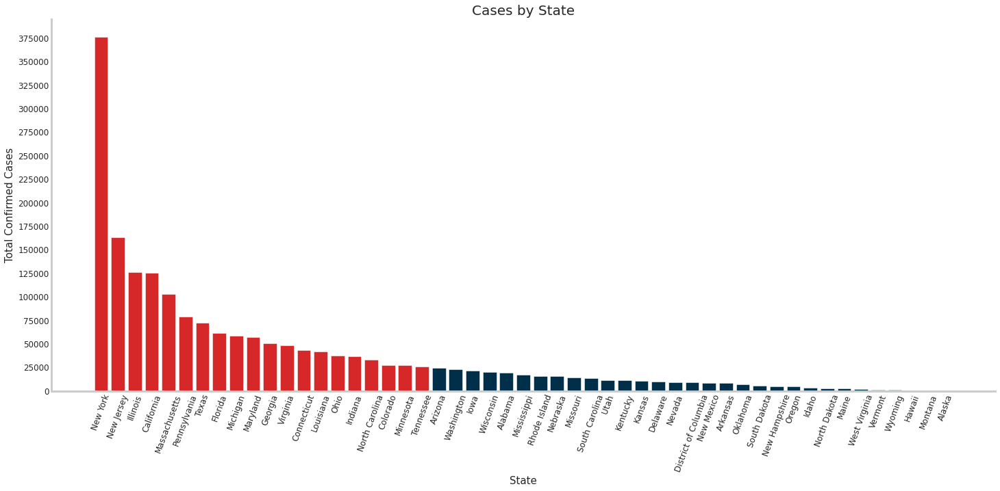

In [ ]:
import plotly.io as pio
pio.templates.default = "plotly_white"

fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['Confirmed'], color=(df5['Confirmed'] < 25000).map({True: '#003049',
                                                                          False: '#d62828'}))
ax.set_title('Cases by State', fontsize=20)
ax.set_ylabel('Total Confirmed Cases', fontsize=15)
ax.set_xlabel('State', fontsize=15)
y_max_cases = df5['Confirmed'].max()+1000
plt.yticks(np.arange(0, y_max_cases, step=25000))
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

States in red has over 25,000 cases. States with most cases are New York, New Jersey, Illinois, Massachusets, Caliifornia.

In [ ]:
# Deaths  per state 
df5 = df4.groupby('State').agg('sum').sort_values('Deaths', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'Deaths']].head(51)

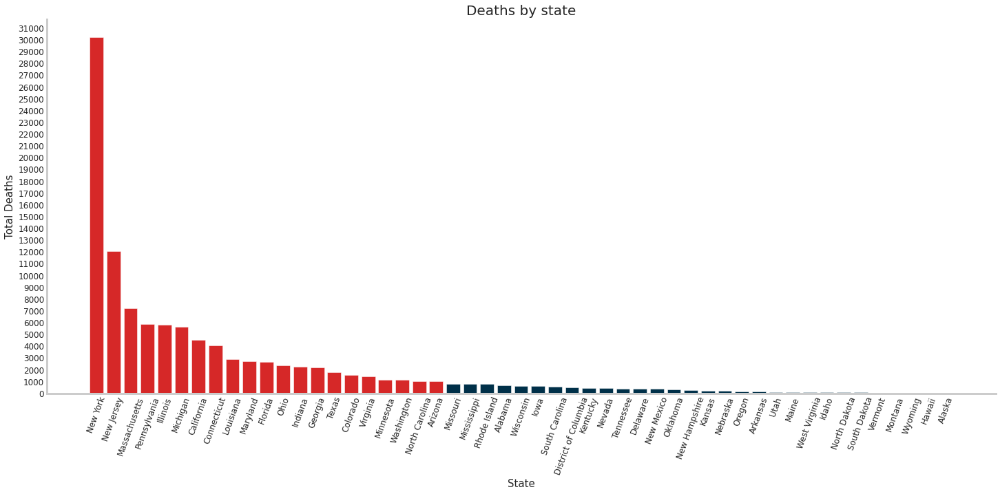

In [ ]:
fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['Deaths'], color=(df5['Deaths'] < 1000).map({True: '#003049',
                                                                          False: '#d62828'}))
ax.set_title('Deaths by state', fontsize=20)
ax.set_ylabel('Total Deaths', fontsize=15)
ax.set_xlabel('State', fontsize=15)
y_max_deaths = df5['Deaths'].max()+1000
plt.yticks(np.arange(0, y_max_deaths, step=1000))
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

States in red have over 1000 deaths. Top states are New York, New Jersey, Massachusetts, Michigan, Pensilvania. Michigan has more deaths than Clifornia, that had more caases. 

In [ ]:
# Recovered  per state 
df5 = df4.groupby('State').agg('sum').sort_values('Recovered', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'Recovered']].head(10)

,State,Recovered
0,New York,66992
1,Pennsylvania,52069
2,Texas,47865
3,Michigan,38099
4,Louisiana,31728
5,New Jersey,27433
6,Indiana,24317
7,Minnesota,21864
8,North Carolina,18860
9,Tennessee,16925


In [ ]:
# People_Hospitalized  per state 
df5 = df4.groupby('State').agg('sum').sort_values('People_Hospitalized', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'People_Hospitalized']].head(51)

Florida and Conneticut have a lot of people hospitalized.

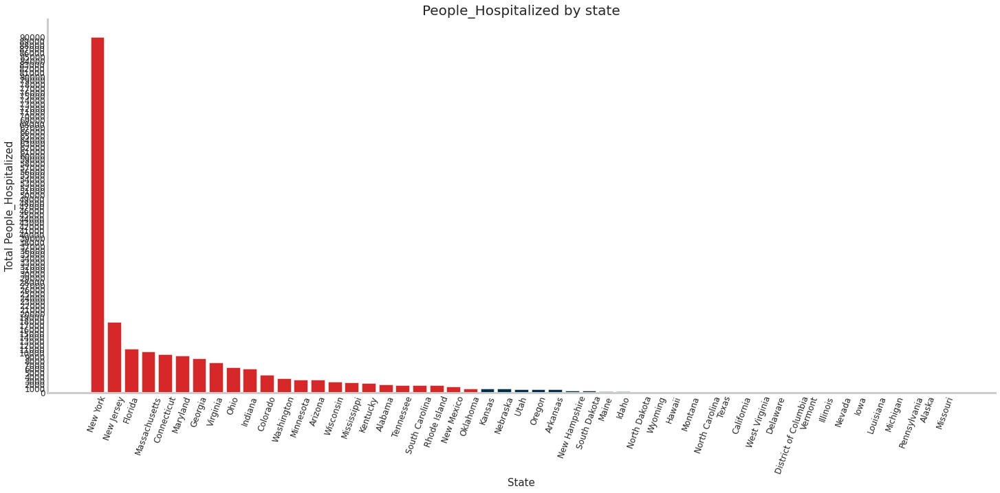

In [ ]:
fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['People_Hospitalized'], color=(df5['People_Hospitalized'] < 1000).map({True: '#003049',
                                                                          False: '#d62828'}))
ax.set_title('People_Hospitalized by state', fontsize=20)
ax.set_ylabel('Total People_Hospitalized', fontsize=15)
ax.set_xlabel('State', fontsize=15)
y_max_deaths = df5['People_Hospitalized'].max()+1000
plt.yticks(np.arange(0, y_max_deaths, step=1000))
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

In [ ]:
# Find daily cases
df6 = df.groupby('Date').agg('sum')
df6['Cases_daily'] = df6['Confirmed'] - df6['Confirmed'].shift(1)
df6['Deaths_daily'] = df6['Deaths'] - df6['Deaths'].shift(1)
df6['Cases_daily'].fillna('0', inplace=True)
df6['Deaths_daily'].fillna('0', inplace=True)
df6['Cases_daily'] = df6['Cases_daily'].astype('int64')
df6['Deaths_daily'] = df6['Deaths_daily'].astype('int64')
df6.reset_index(inplace=True)
df6[['Date', 'Cases_daily']]

From this data, the first case was on Jan 25th. Cases kept increasing with time. 

In [ ]:
# Most infectious data
most_infectious_day = df6.groupby('Date').agg('sum').sort_values('Cases_daily', ascending=False)
most_infectious_day.reset_index(inplace=True)
most_infectious_day[['Date', 'Cases_daily']].head(1)

,Date,Cases_daily
0,2020-04-25,36301


In [ ]:
# First ocuurance of death  - FEB 20TH!
df6[df6['Deaths']>0][['Date', 'Deaths']].head(2)

,Date,Deaths
29,2020-02-20,1
30,2020-02-21,1


In [ ]:
# Most deaths day Apr 16th!!
deadliest_day = df6.groupby('Date').agg('sum').sort_values('Deaths_daily', ascending=False)
deadliest_day.reset_index(inplace=True)
deadliest_day[['Date', 'Deaths_daily']].head(1)

,Date,Deaths_daily
0,2020-04-16,4586


In [ ]:
# Mortality rate - 6%
mortality_rate = df3['Deaths']/df3['Confirmed']*100
mortality_rate

0    5.758028
dtype: float64

In [ ]:
# Mortality rate by states
# m rate by states 
df5['mortality rate'] = round((df5['Deaths']/df5['Confirmed'])*100, 2)
df5[['State', 'mortality rate']].head(51)


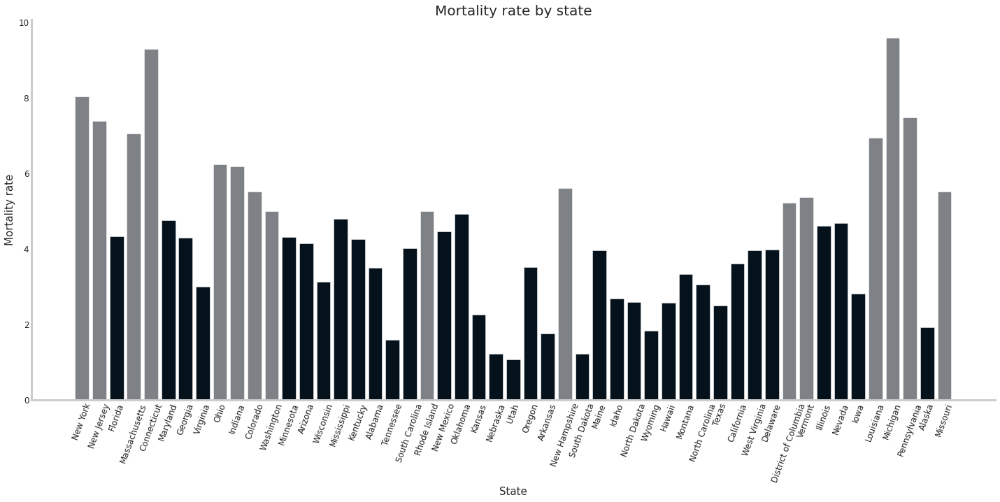

In [ ]:
# Plot it
fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['mortality rate'], color=(df5['mortality rate'] < 5).map({True: '#05121c',
                                                                          False: '#7e8287'}))
ax.set_title('Mortality rate by state', fontsize=20)
ax.set_ylabel('Mortality rate', fontsize=15)
ax.set_xlabel('State', fontsize=15)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

In [ ]:
fig = px.scatter(df5.sort_values('Deaths', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Deaths', color='State', size='Confirmed', height=700,
                 text='State', log_x=True, log_y=True, title='Deaths vs Confirmed (Scale is in log10)')
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

Confirmed cases and deaths have positive correlation. 

In [ ]:
# first
fig = px.line(df1, x="Date", y="Confirmed", color='State', height=600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()


# secong
fig = px.line(df1, x="Date", y="Deaths", color='State', height=600,
             title='Deaths', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()


# third
fig = px.line(df1, x="Date", y="New cases", color='State', height=600,
             title='New cases', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()

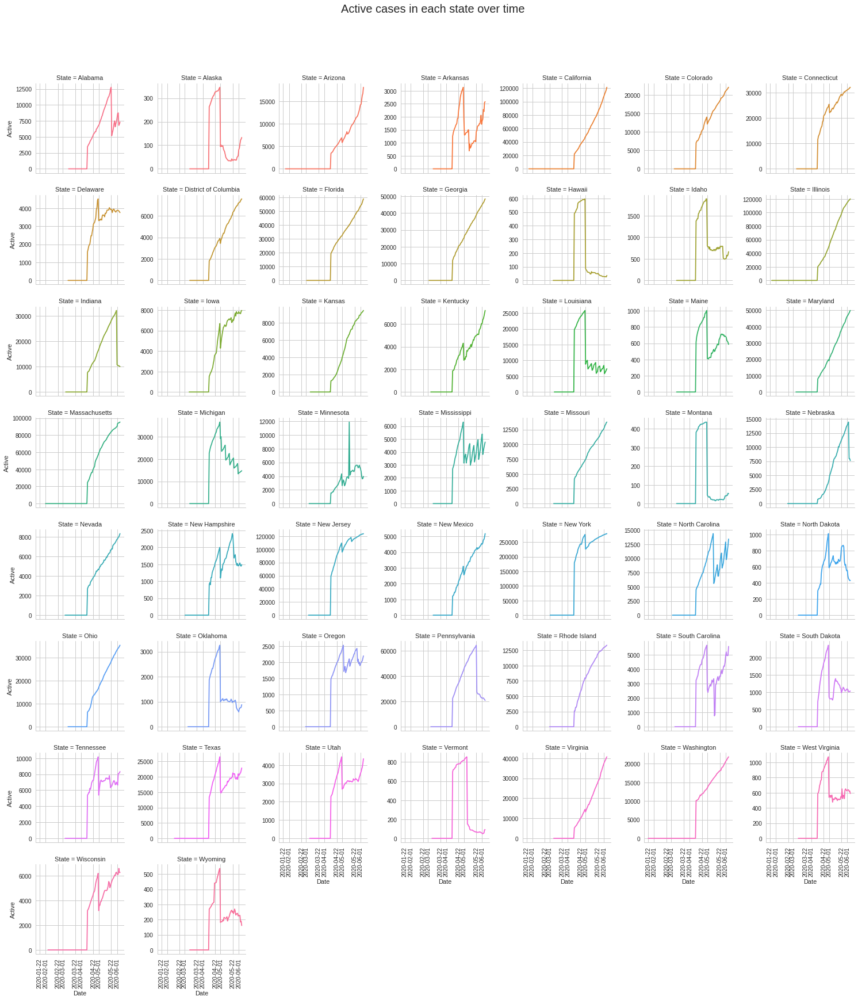

In [ ]:
# Daily new Cases per state -  easier to see
plt.style.use('seaborn-notebook')
g = sns.FacetGrid(df1.sort_values(['State', 'Date']), 
                  col="State", hue="State", 
                  sharey=False, col_wrap=7)
g = g.map(plt.plot, "Date", "Active")
g.set_xticklabels(rotation=90)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Active cases in each state over time', 
               fontsize=20)
plt.show()

Some states like West Virginia, Wyoming, Wisconsin, North Dakota, Arkansas and Alaska managed to flatten the curve.

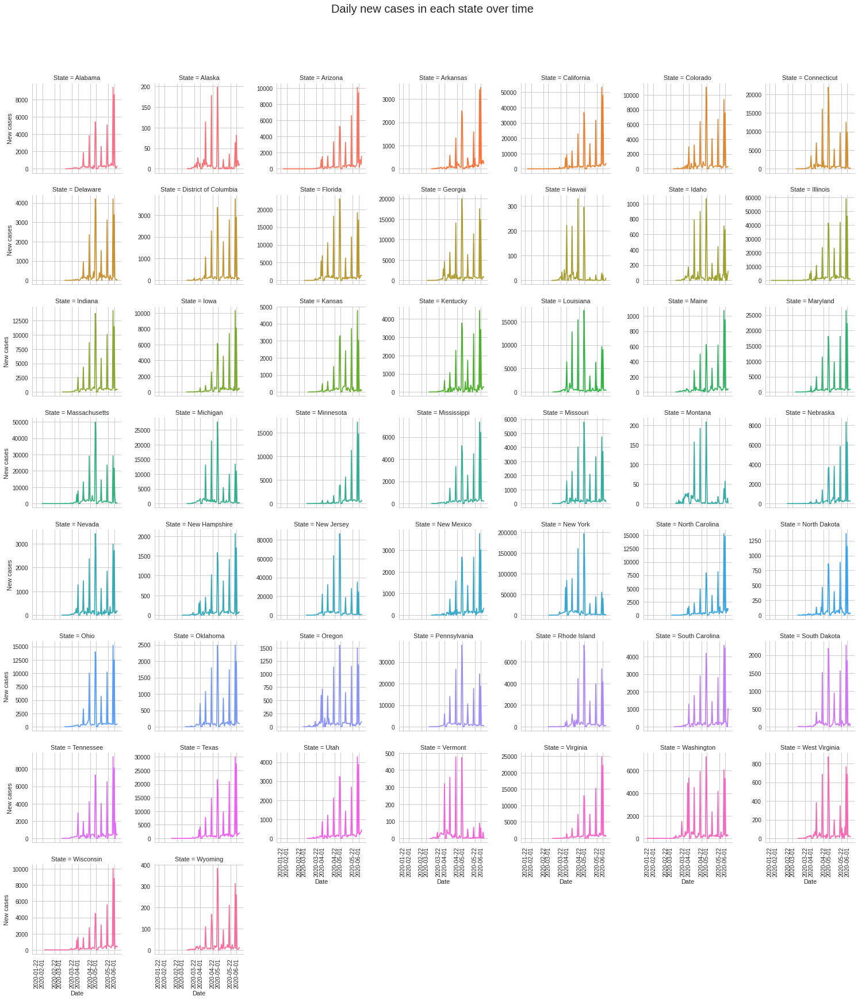

In [ ]:
# New Cases per state
plt.style.use('seaborn-notebook')
g = sns.FacetGrid(df1.sort_values(['State', 'Date']), 
                  col="State", hue="State", 
                  sharey=False, col_wrap=7)
g = g.map(plt.plot, "Date", "New cases")
g.set_xticklabels(rotation=90)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Daily new cases in each state over time', 
               fontsize=20)
plt.show()

The new cases per day are decreasing for most states.

In [ ]:
# Latest cases
latest = df1[df1['Date'] == max(df1['Date'])]
latest.head(3)

,Date,State,State_abb,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
4905,2020-06-06,Alabama,AL,19387,676,11395,7316,315,23,0
4906,2020-06-06,Alaska,AK,523,10,380,133,11,0,4
4907,2020-06-06,Arizona,AZ,24439,1015,5298,18126,1553,16,126


In [ ]:
"""! pip install plotly==4.5.2
import plotly.express as px
!pip install -U plotly"""

latest = df1[df1['Date'] == max(df1['Date'])]
                         
fig = px.treemap(latest.sort_values(by='Confirmed', ascending=False).reset_index(drop=True), 
                 path=["State", "State_abb"], values="Confirmed", height=700,
                 title='Number of Confirmed Cases',
                 color_discrete_sequence = px.colors.qualitative.D3_r)
fig.data[0].textinfo = 'label+text+value'
fig.show()

fig = px.treemap(latest.sort_values(by='Deaths', ascending=False).reset_index(drop=True), 
                 path=["State_abb", "State"], values="Deaths", height=700,
                 title='Number of Deaths reported',
                 color_discrete_sequence = px.colors.qualitative.D3_r)
fig.data[0].textinfo = 'label+text+value'
fig.show()

Confirmed Cases
https://public.flourish.studio/visualisation/2498856/

In [ ]:
from IPython.display import display, HTML
HTML('''<div class="flourish-embed flourish-bar-chart-race" data-src="visualisation/2498856" data-url="https://flo.uri.sh/visualisation/2498856/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')

Confirmed Deaths https://public.flourish.studio/visualisation/2369371/

In [ ]:
HTML('''<div class="flourish-embed flourish-bar-chart-race" data-src="visualisation/2770197" data-url="https://flo.uri.sh/visualisation/2770197/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')

In [ ]:
# Look at some states
fl = df1[df1['State'] == 'Florida']
tx = df1[df1['State'] == 'Texas']
wa = df1[df1['State'] == 'Washington']
ca = df1[df1['State'] == 'California']

In [ ]:
# FL
import altair as alt
base = alt.Chart(fl).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [ ]:
red = alt.value("#f54242")
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [ ]:
# TX
base = alt.Chart(tx).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [ ]:
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [ ]:
# WA
base = alt.Chart(wa).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [ ]:
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [ ]:
# CA
base = alt.Chart(ca).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [ ]:
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [ ]:
## Add some states
states = ['New York', 'Illinois', 'Washington', 'California', 'Texas', 'Ohio', 'Delaware', 'Nevada', 'New Jersey']
selected_states = df1[df1['State'].isin(states)]

In [ ]:
interval = alt.selection_interval()

circle = alt.Chart(selected_states).mark_circle().encode(
    x='monthdate(Date):O',
    y='State',
    color=alt.condition(interval, 'State', alt.value('lightgray')),
    size=alt.Size('New cases:Q',
        scale=alt.Scale(range=[0, 3000]),
        legend=alt.Legend(title='Daily new cases')
    ) 
).properties(
    width=1000,
    height=300,
    selection=interval
)

bars = alt.Chart(selected_states).mark_bar().encode(
    y='State',
    color='State',
    x='sum(New cases):Q'
).properties(
    width=1000
).transform_filter(
    interval
)

circle & bars

alt.VConcatChart(...)

In [ ]:
df.head(3)

,State_abb,State,Date,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,WA,Washington,2020-01-22,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0
1,WA,Washington,2020-01-23,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0
2,WA,Washington,2020-01-24,46.703529,-119.359134,1,0,0,0,0.0,0,0,0.0,0.0,0.0


In [ ]:
## Check the correlation 

# Getting the dataset to check the correlation 
corr_data = df.drop(['State','State_abb','Lat','Lon', 'Date'], axis=1)

#Converting the dataset to the correlation function
corr = corr_data.corr()

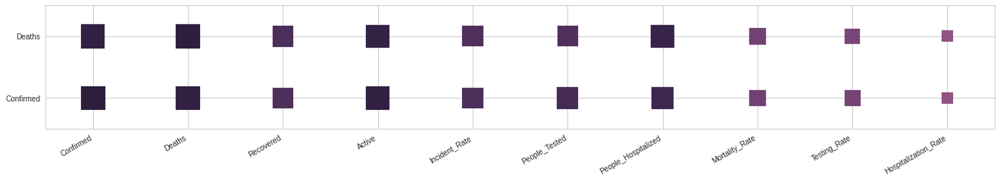

In [ ]:
# Plotting a heatmap

def heatmap(x, y, size,color):
    fig, ax = plt.subplots(figsize=(20,3))
    
    # Mapping from column names to integer coordinates
    x_labels = corr_data.columns
    y_labels = ['Confirmed', 'Deaths']
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 
    
    n_colors = 256 # Use 256 colors for the diverging color palette
    palette = sns.cubehelix_palette(n_colors) # Create the palette
    color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
        ind = int(val_position * (n_colors - 1)) # target index in the color palette
        return palette[ind]

    
    ax.scatter(
    x=x.map(x_to_num),
    y=y.map(y_to_num),
    s=size * 1000,
    c=color.apply(value_to_color), # Vector of square color values, mapped to color palette
    marker='s'
)
    
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=30, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    
    
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    
corr = pd.melt(corr.reset_index(), id_vars='index') 
corr.columns = ['x', 'y', 'value']
heatmap(x=corr['x'],y=corr['y'],size=corr['value'].abs(),color=corr['value'])

### KMeans clustering to identify states with similar risk level for Covid-19

In [ ]:
# data source: https://simple.wikipedia.org/wiki/List_of_U.S._states_by_population_density
density = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/pop_density.csv')
density.head(2)

,state,density_mi
0,WA,104.9
1,IL,232.0


In [ ]:
HTML('''<div class="flourish-embed flourish-chart" data-src="visualisation/2369366" data-url="https://flo.uri.sh/visualisation/2369366/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')


In [ ]:
# drop columbia 
dc = density['state'].str.contains('DC')
## Delete the ship data 
density= density[~(dc)]


In [ ]:
# map the density
fig = go.Figure(data=go.Choropleth(
    locations=density['state'], 
    z = density['density_mi'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    #color=[1,2,3,4,5],
    colorbar_title = "Population Density"
))

fig.update_layout(
    title_text = 'USA Population Density',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
## Looks the same 
 # Initialize the map:
m = folium.Map(location=[37, -102], zoom_start=5)
 
# Add the color for the chloropleth:
m.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data= density,
 columns=['state', 'density_mi'],
 key_on='feature.id',
 fill_color='YlGn',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Density'
)
folium.LayerControl().add_to(m)
m
# Save to html
#m.save('#292_folium_chloropleth_USA1.html')


In [ ]:
df_new = df.copy()
df_new= df_new.set_index('State_abb')
df_new = df_new.groupby(df_new.index).sum()

In [ ]:
df_new.reset_index()

,State_abb,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,AK,5293.111737,-12793.128460,24004,607,15515,8242,3234.995451,1602657,577,143.192030,236469.899043,183.446270
1,AL,2889.884488,-7621.585957,602125,21972,138021,414385,11910.151182,6892195,67099,204.361670,142919.633127,681.837103
2,AR,3082.947503,-8164.944137,249544,4926,149794,96035,8328.861524,3948018,24683,113.587345,138518.051185,596.495905
3,AZ,4378.774941,-14498.292068,672203,29866,143440,482150,8747.963412,6942371,86449,246.325715,95379.048256,756.689811
4,CA,4978.121746,-15988.816299,4011224,152409,158,3635577,9603.092251,56631188,82083,215.637790,143694.303437,253.083597
5,CO,3593.913436,-9731.102002,1085909,55363,134410,837706,17745.721474,5772802,176272,286.364429,100864.655220,987.999598
6,CT,3779.985617,-6604.558551,1843540,152609,222450,1379193,49116.929439,7914816,417751,457.573972,221996.588216,1204.899250
7,DC,3462.017748,-6855.159936,337681,16484,47131,270056,45598.718525,1642398,5773,266.438692,232717.014121,199.095198
8,DE,3437.438884,-6619.421996,350202,12229,144826,193475,34813.979568,1895556,4271,186.478304,194662.823844,157.961254
9,FL,2781.119576,-7970.958809,2421675,93319,0,2152311,10496.846337,32261148,396809,215.823466,150857.358417,968.929353


In [ ]:
# merge by state 
merged_left = pd.merge(left=df_new,right=density, 
                         left_on=['State_abb'], 
                         right_on=['state'],
                         how='left')

In [ ]:
merged_left.head(50)
merged_left= merged_left.dropna()

In [ ]:
merged_left.head(4)

,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate,state,density_mi
0,5293.111737,-12793.128460,24004,607,15515,8242,3234.995451,1602657,577,143.192030,236469.899043,183.446270,AK,1.3
1,2889.884488,-7621.585957,602125,21972,138021,414385,11910.151182,6892195,67099,204.361670,142919.633127,681.837103,AL,95.4
2,3082.947503,-8164.944137,249544,4926,149794,96035,8328.861524,3948018,24683,113.587345,138518.051185,596.495905,AR,56.9
3,4378.774941,-14498.292068,672203,29866,143440,482150,8747.963412,6942371,86449,246.325715,95379.048256,756.689811,AZ,58.3


### **Socio-Demographic Data** 

In [ ]:
# data source https://www.kaggle.com/roche-data-science-coalition/uncover
import datetime
from datetime import datetime
from datetime import timedelta

# get the data 
latest_date = datetime.today()- timedelta(days=2)
latest_date = latest_date.strftime('%m/%d/%y')[1:]

df_cases = pd.read_csv('https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_confirmed_usafacts.csv')[['countyFIPS', 'County Name', 'State', latest_date]]
df_cases = df_cases.rename(columns={'countyFIPS': 'county_fips',
                                                  latest_date: 'confirmed'}).set_index('county_fips')

df_deaths = pd.read_csv('https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_deaths_usafacts.csv')[['countyFIPS', latest_date]]
df_deaths = df_deaths.rename(columns={'countyFIPS': 'county_fips',
                                                  latest_date: 'deaths'}).set_index('county_fips')


df_pop = pd.read_csv('https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_county_population_usafacts.csv')[['countyFIPS', 'population']]
df_pop = df_pop.rename(columns={'countyFIPS': 'county_fips'}).set_index('county_fips')

df = df_cases.join(df_deaths)
df = df.join(df_pop)

df = df[df.index > 999]
df = df[df.population>0]

del df_cases, df_deaths, df_pop

df['mortality'] = df['deaths']/ df['confirmed']
df['mortality'] = df['mortality'].fillna(0)

df['deaths_per_million'] = df['deaths'] * 1000000/ df['population']
df['cases_per_million'] = df['confirmed'] * 1000000/ df['population']

df['likely_infected_high'] = np.round(df['confirmed'] * 80/ df['population'], 2)
df['likely_infected_high'] = np.clip(df['likely_infected_high'], 0, 1)
df['likely_infected_low'] = np.round(df['confirmed'] * 28/ df['population'], 2)
df['likely_infected_low'] = np.clip(df['likely_infected_low'], 0, 1)

df['county_state'] = df['County Name'] + ', ' + df['State']
print('Number of counties: ' + str(df.index.nunique()))

In [ ]:
df.head()

,County Name,State,confirmed,deaths,population,mortality,deaths_per_million,cases_per_million,likely_infected_high,likely_infected_low,county_state
county_fips,,,,,,,,,,,
1001,Autauga County,AL,159,3,55869.0,0.018868,53.697041,2845.943189,0.23,0.08,"Autauga County, AL"
1003,Baldwin County,AL,274,9,223234.0,0.032847,40.316439,1227.411595,0.10,0.03,"Baldwin County, AL"
1005,Barbour County,AL,110,1,24686.0,0.009091,40.508790,4455.966945,0.36,0.12,"Barbour County, AL"
1007,Bibb County,AL,59,1,22394.0,0.016949,44.654818,2634.634277,0.21,0.07,"Bibb County, AL"
1009,Blount County,AL,49,1,57826.0,0.020408,17.293259,847.369695,0.07,0.02,"Blount County, AL"


In [ ]:
# data source https://www.kaggle.com/roche-data-science-coalition/uncover
df_county_stats= pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/us-county-health-rankings-2020.csv')[['fips',
                                                                                            'segregation_index',
                                                                                            'percent_black',
                                                                                            'median_household_income',
                                                                                            'percent_adults_with_obesity',
                                                                                            'percent_smokers',
                                                                                            'percent_adults_with_diabetes',                                           
                                                                                            'percent_with_access_to_exercise_opportunities',
                                                                                            'percent_some_college',
                                                                                            'percent_unemployed',
                                                                                            'percent_children_in_poverty',
                                                                                            'percent_female',
                                                                                            'percent_rural',
                                                                                            'percent_non_hispanic_white',
                                                                                            'food_environment_index',
                                                                                            'percent_food_insecure',
                                                                                            'income_ratio',
                                                                                            '80th_percentile_income',
                                                                                            'percent_excessive_drinking',
                                                                                            'average_number_of_physically_unhealthy_days',
                                                                                            'percent_uninsured',
                                                                                            'high_school_graduation_rate',
                                                                                            'percent_single_parent_households',
                                                                                            'social_association_rate',
                                                                                            'infant_mortality_rate',
                                                                                            'age_adjusted_death_rate',    ]]                                         


df_county_stats = df_county_stats.rename(columns={'fips': 'county_fips',
                                                  'segregation_index': 'segregation_level',
                                                  })
df_county_stats.head(2)

,county_fips,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_some_college,percent_unemployed,percent_children_in_poverty,percent_female,percent_rural,percent_non_hispanic_white,food_environment_index,percent_food_insecure,income_ratio,80th_percentile_income,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,high_school_graduation_rate,percent_single_parent_households,social_association_rate,infant_mortality_rate,age_adjusted_death_rate
0,1000,56.653988,26.497733,49881.0,35.5,20.927353,14.2,61.112287,60.411902,3.933567,23.9,51.633032,40.963183,65.413428,5.8,16.3,5.261136,99688.0,13.903515,4.918052,11.044783,89.3,37.342739,12.371924,8.365564,474.782349
1,1001,24.619138,19.343177,59338.0,33.3,18.081557,11.1,69.130124,62.009974,3.629079,19.3,51.448715,42.002162,74.308016,7.2,13.2,5.234597,110026.0,15.026031,4.743889,8.721686,90.0,26.242679,12.071202,7.940109,417.547551


In [ ]:
# merge by state 
df = pd.merge(left=df ,right=df_county_stats, 
                         left_on=['county_fips'], 
                         right_on=['county_fips'],
                         how='left')
df.head(4)

,county_fips,County Name,State,confirmed,deaths,population,mortality,deaths_per_million,cases_per_million,likely_infected_high,likely_infected_low,county_state,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_some_college,percent_unemployed,percent_children_in_poverty,percent_female,percent_rural,percent_non_hispanic_white,food_environment_index,percent_food_insecure,income_ratio,80th_percentile_income,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,high_school_graduation_rate,percent_single_parent_households,social_association_rate,infant_mortality_rate,age_adjusted_death_rate
0,1001,Autauga County,AL,159,3,55869.0,0.018868,53.697041,2845.943189,0.23,0.08,"Autauga County, AL",24.619138,19.343177,59338.0,33.3,18.081557,11.1,69.130124,62.009974,3.629079,19.3,51.448715,42.002162,74.308016,7.2,13.2,5.234597,110026.0,15.026031,4.743889,8.721686,90.000000,26.242679,12.071202,7.940109,417.547551
1,1003,Baldwin County,AL,274,9,223234.0,0.032847,40.316439,1227.411595,0.10,0.03,"Baldwin County, AL",41.271763,8.783976,57588.0,31.0,17.489033,10.7,73.713549,67.371620,3.615382,13.9,51.538377,42.279099,83.111337,8.0,11.6,4.417767,111447.0,17.958310,4.224519,11.333404,86.361577,24.139601,10.205617,5.546701,353.343111
2,1005,Barbour County,AL,110,1,24686.0,0.009091,40.508790,4455.966945,0.36,0.12,"Barbour County, AL",25.039132,48.032635,34382.0,41.7,21.999985,17.6,53.166770,34.857649,5.171384,43.9,47.216752,67.789635,45.641252,5.6,22.0,5.681410,76557.0,12.844016,5.430279,12.242792,81.410256,56.603426,7.518797,NaN,497.350062
3,1007,Bibb County,AL,59,1,22394.0,0.016949,44.654818,2634.634277,0.21,0.07,"Bibb County, AL",52.603794,21.120536,46064.0,37.6,19.114200,14.5,16.251364,44.137353,3.971828,27.8,46.781250,68.352607,74.589286,7.8,14.3,4.368581,87957.0,15.570042,4.591482,10.206253,83.763838,28.689236,8.381860,12.244898,589.041117


In [ ]:
# data sourse https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation
df_county_stats = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/analytic_data2020.csv')[['fipscode',
                                                                                            'v052_rawvalue',
                                                                                            'v053_rawvalue',
                                                                                            'v044_rawvalue',
                                                                                            'v147_rawvalue',
                                                                                            'v002_cilow',
                                                                                            'v136_other_data_2']]

df_county_stats = df_county_stats.rename(columns={'fipscode': 'county_fips',
                                                  'v052_rawvalue': 'percent_below_18',
                                                  'v053_rawvalue': 'percent_above_65',
                                                  'v044_rawvalue': 'income_inequality',
                                                  'v147_rawvalue': 'life_expectancy',
                                                  'v002_cilow': 'poor_fair_health',
                                                  'v136_other_data_2': 'over_crowding'
                                                  }).set_index('county_fips')


df = df.join(df_county_stats)
df = df.reset_index()
df['county_fips'] = df['county_fips'].astype(str).str.rjust(5,'0')
#df.head()

In [ ]:
df.head()

,index,county_fips,County Name,State,confirmed,deaths,population,mortality,deaths_per_million,cases_per_million,likely_infected_high,likely_infected_low,county_state,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_some_college,percent_unemployed,percent_children_in_poverty,percent_female,percent_rural,percent_non_hispanic_white,food_environment_index,percent_food_insecure,income_ratio,80th_percentile_income,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,high_school_graduation_rate,percent_single_parent_households,social_association_rate,infant_mortality_rate,age_adjusted_death_rate,percent_below_18,percent_above_65,income_inequality,life_expectancy,poor_fair_health,over_crowding
0,0,01001,Autauga County,AL,159,3,55869.0,0.018868,53.697041,2845.943189,0.23,0.08,"Autauga County, AL",24.619138,19.343177,59338.0,33.3,18.081557,11.1,69.130124,62.009974,3.629079,19.3,51.448715,42.002162,74.308016,7.2,13.2,5.234597,110026.0,15.026031,4.743889,8.721686,90.000000,26.242679,12.071202,7.940109,417.547551,0.224348,0.160258,4.920018,79.08913,NaN,NaN
1,1,01003,Baldwin County,AL,274,9,223234.0,0.032847,40.316439,1227.411595,0.10,0.03,"Baldwin County, AL",41.271763,8.783976,57588.0,31.0,17.489033,10.7,73.713549,67.371620,3.615382,13.9,51.538377,42.279099,83.111337,8.0,11.6,4.417767,111447.0,17.958310,4.224519,11.333404,86.361577,24.139601,10.205617,5.546701,353.343111,NaN,NaN,NaN,NaN,NaN,NaN
2,2,01005,Barbour County,AL,110,1,24686.0,0.009091,40.508790,4455.966945,0.36,0.12,"Barbour County, AL",25.039132,48.032635,34382.0,41.7,21.999985,17.6,53.166770,34.857649,5.171384,43.9,47.216752,67.789635,45.641252,5.6,22.0,5.681410,76557.0,12.844016,5.430279,12.242792,81.410256,56.603426,7.518797,NaN,497.350062,NaN,NaN,NaN,NaN,NaN,NaN
3,3,01007,Bibb County,AL,59,1,22394.0,0.016949,44.654818,2634.634277,0.21,0.07,"Bibb County, AL",52.603794,21.120536,46064.0,37.6,19.114200,14.5,16.251364,44.137353,3.971828,27.8,46.781250,68.352607,74.589286,7.8,14.3,4.368581,87957.0,15.570042,4.591482,10.206253,83.763838,28.689236,8.381860,12.244898,589.041117,NaN,NaN,NaN,NaN,NaN,NaN
4,4,01009,Blount County,AL,49,1,57826.0,0.020408,17.293259,847.369695,0.07,0.02,"Blount County, AL",48.214823,1.462656,50412.0,33.8,19.208672,17.0,15.634486,53.361073,3.511157,18.0,50.726141,89.951502,86.886238,8.4,10.7,4.430262,91702.0,14.230594,4.860808,13.360759,93.468795,28.561828,8.446383,6.841993,515.611823,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
"""from google.colab import drive
drive.mount('/content/drive')"""

"from google.colab import drive\ndrive.mount('/content/drive')"

In [ ]:
#df.to_csv('/content/drive/My Drive/IST 718/big_df.csv')

In [ ]:
big_df = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/big_df.csv')

In [ ]:
#big_df.isna().sum()
big_df.fillna(0, inplace=True)

In [ ]:
## Check the correlation 

# Getting the dataset to check the correlation 
corr_data = big_df.drop(['County Name','State','county_fips','county_state', 'index', 'Unnamed: 0'], axis=1)

#Converting the dataset to the correlation function
corr = corr_data.corr()

In [ ]:
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

In [ ]:
#createing dataset with numeric values
data_k =big_df[['confirmed', 'deaths','population', 'mortality', 'likely_infected_high', 'likely_infected_low', 'segregation_level', 'percent_black', 'median_household_income', 'percent_adults_with_obesity', 'percent_smokers', 'percent_adults_with_diabetes',
                  'percent_with_access_to_exercise_opportunities', 'percent_unemployed', 'percent_some_college', 'percent_children_in_poverty', 'percent_female', 'percent_rural', 'income_ratio', 'percent_excessive_drinking', 'average_number_of_physically_unhealthy_days', 'percent_uninsured',
                  'percent_below_18', 'percent_above_65', 'life_expectancy', 'over_crowding','poor_fair_health' ]]

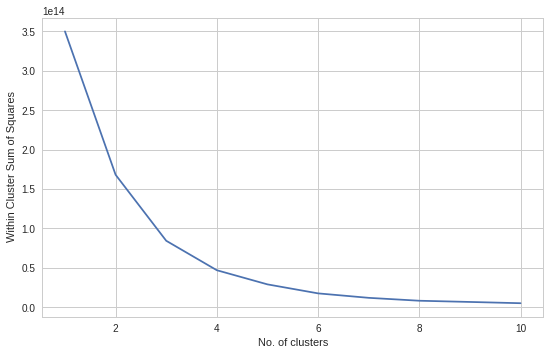

In [ ]:
from sklearn.cluster import KMeans
#calculating WCSS which is the sum of squares of the distances of each data point represeting a country
#in all clusters to their respective centroids
wcss=[]
for i in range(1,11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10)
    y_means = kmeans.fit(data_k)
    wcss.append(y_means.inertia_)
#Plotting WCSS to find the number of clusters
plt.plot(range(1,11), wcss)
plt.xlabel("No. of clusters")
plt.ylabel(" Within Cluster Sum of Squares")
plt.show()

In [ ]:
# 4 clusters 
kmeans_covid = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10)
y_kmeans = kmeans.fit_predict(data_k)

# Fitting K-Means to the dataset
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(data_k)


#beginning of  the cluster numbering with 1 instead of 0
y_kmeans1=y_kmeans
y_kmeans1=y_kmeans+1

# New Dataframe called cluster
cluster = pd.DataFrame(y_kmeans1)
# Adding cluster to the Dataset1
data_k['cluster'] = cluster
#Mean of clusters
kmeans_mean_cluster = pd.DataFrame(round(data_k.groupby('cluster').mean(),1))
kmeans_mean_cluster

,confirmed,deaths,population,mortality,likely_infected_high,likely_infected_low,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_unemployed,percent_some_college,percent_children_in_poverty,percent_female,percent_rural,income_ratio,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,percent_below_18,percent_above_65,life_expectancy,over_crowding,poor_fair_health
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,151.9,6.8,50569.4,0.0,0.2,0.1,28.4,8.7,51697.1,33.2,17.7,12.3,61.0,4.1,57.3,21.4,49.8,61.6,4.5,17.4,4.0,11.6,0.0,0.0,2.3,0.0,0.0
2,5407.9,344.8,768746.0,0.1,0.4,0.2,53.0,14.3,71400.9,27.8,14.5,9.6,91.9,3.9,68.8,16.3,51.1,5.6,4.8,19.2,3.6,9.2,0.0,0.0,1.5,0.0,0.0
3,16754.9,1159.5,2834472.8,0.0,0.3,0.2,52.1,13.4,69625.2,25.1,13.0,9.0,94.9,3.7,65.3,18.1,50.7,1.7,4.9,18.9,3.6,12.7,0.0,0.0,0.0,0.0,0.0
4,44988.0,2104.0,10039107.0,0.0,0.4,0.1,57.1,8.0,67986.0,21.7,10.8,8.4,97.6,4.7,63.0,19.9,50.7,0.6,5.4,18.9,3.6,10.1,0.0,0.0,0.0,0.0,0.0


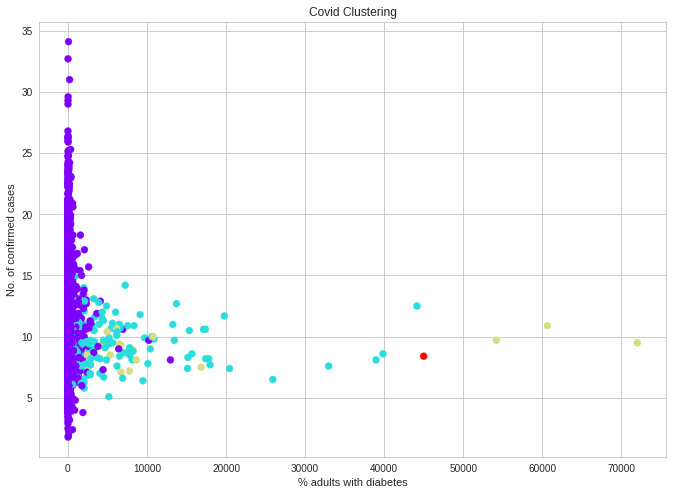

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(data_k.iloc[:,0], data_k.iloc[:,11],c=y_kmeans, cmap='rainbow')  # plot points with cluster dependent colors
plt.title('Covid Clustering')
plt.xlabel("% adults with diabetes")
plt.ylabel("No. of confirmed cases")
plt.show()

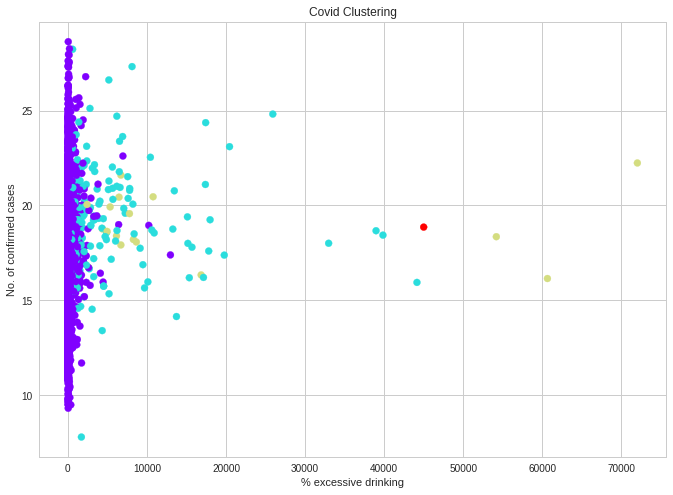

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(data_k.iloc[:,0], data_k.iloc[:,19],c=y_kmeans, cmap='rainbow')  # plot points with cluster dependent colors
plt.title('Covid Clustering')
plt.xlabel("% excessive drinking")
plt.ylabel("No. of confirmed cases")
plt.show()

In [ ]:
data_risk= pd.DataFrame()
data_risk["state"]=big_df["State"]
data_risk["Risk_Level"]=y_kmeans1

In [ ]:
for group in range(1,5):
    states=data_risk.loc[data_risk['Risk_Level']==group]
    listofstates= list(states['state'])
    print("Group", group, ":", listofstates)

Group 1 : ['AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AL', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AK', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AZ', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR', 'AR',

In [ ]:
names = ['confirmed', 'deaths','population', 'mortality', 'likely_infected_high', 'likely_infected_low', 'segregation_level', 'percent_black', 'median_household_income', 'percent_adults_with_obesity', 'percent_smokers', 'percent_adults_with_diabetes',
                  'percent_with_access_to_exercise_opportunities', 'percent_unemployed', 'percent_some_college', 'percent_children_in_poverty', 'percent_female', 'percent_rural', 'income_ratio', 'percent_excessive_drinking', 'average_number_of_physically_unhealthy_days', 'percent_uninsured',
                  'percent_below_18', 'percent_above_65', 'life_expectancy', 'over_crowding','poor_fair_health', 'cluster' ]

Text(0.5, 1.0, ' Factor impacting COVID-19 deaths')

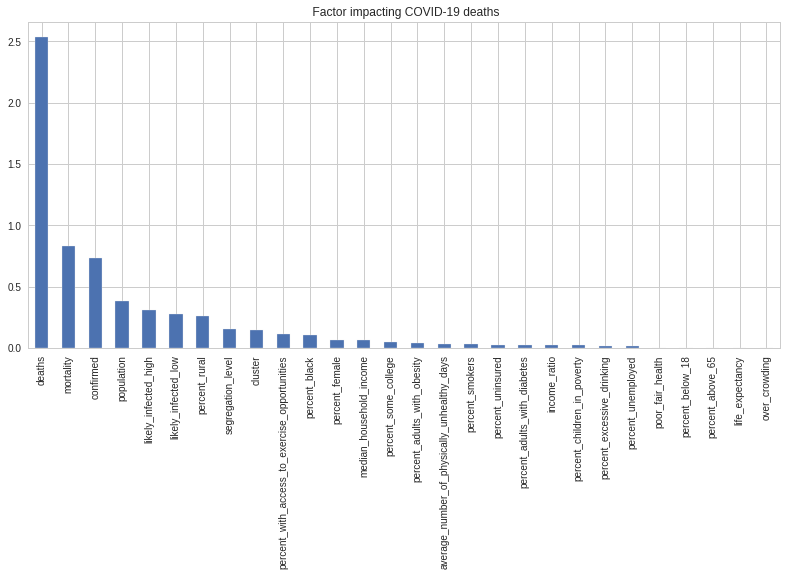

In [ ]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.feature_selection import SelectKBest, SelectPercentile
mi = mutual_info_regression(data_k[names], data_k['deaths'] )
mi = pd.Series(mi)
mi.index = names
mi.sort_values(ascending=False)
mi.sort_values(ascending=False).plot.bar(figsize=(12, 6))
plt.title(" Factor impacting COVID-19 deaths")

**Demographic Variables**: 
Gender,
Rural-Urban,
Age,
Race,
Single-parent households,

In [ ]:
df = big_df.copy()

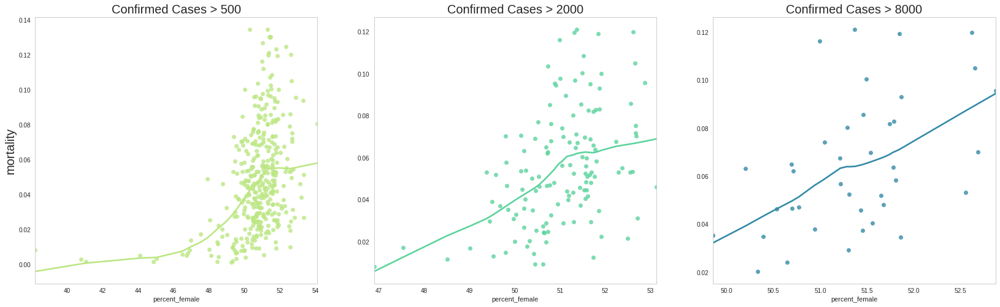

In [ ]:
# Gender
plt.figure(figsize=(25,8))
val = [500, 2000, 8000]
colors = [cnf, dth, rec]
col_name = 'percent_female'


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]),fontsize=20)
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')

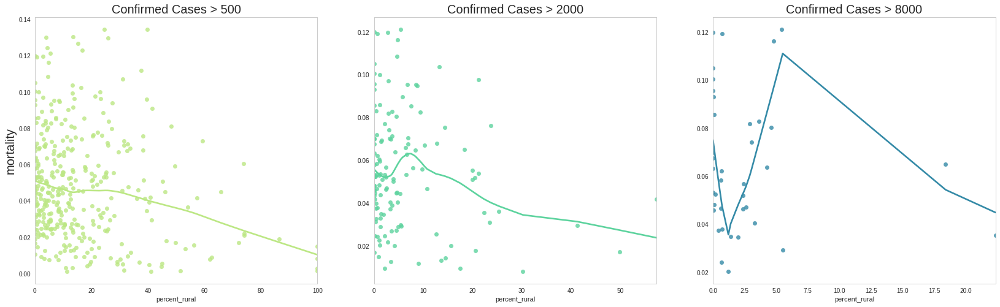

In [ ]:
# outsite cities teritory
#rural
col_name = 'percent_rural'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]), fontsize=20)
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')

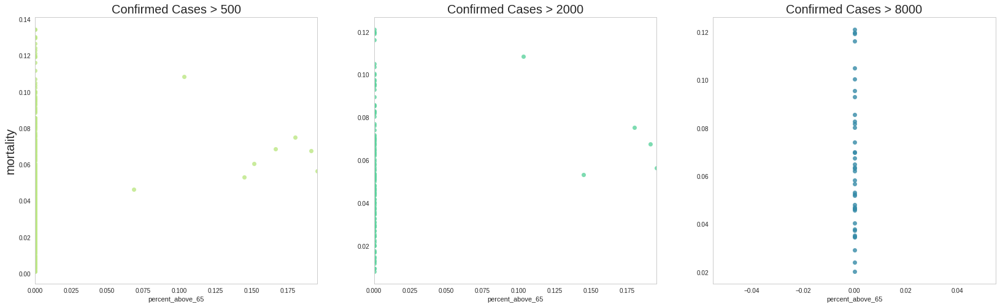

In [ ]:
# Age above 65
#age above 65
col_name = 'percent_above_65'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]), fontsize=20)
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')


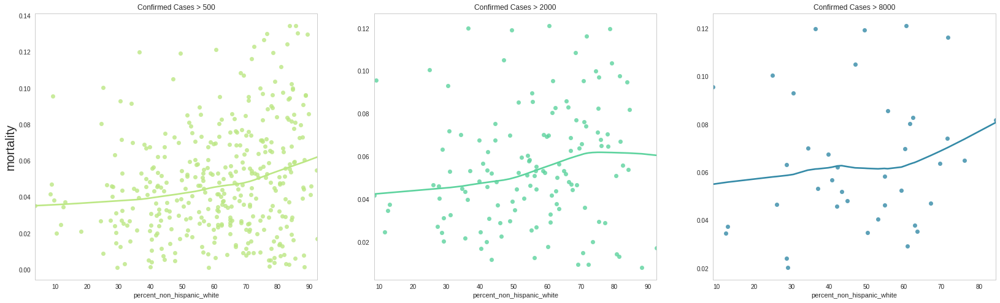

In [ ]:
# Race 

plt.figure(figsize=(25,8))
col_name = 'percent_non_hispanic_white'


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')

The lowess smoothed lines provide some insight into the nature of the relationship between covid-related mortalities and demographic variables like gender, age, and race. As I filtered for counties having a higher number of confiemed cases, we notice that certain variables reveal a stronger positive association with Covid-related mortality.

**Economic Variables**:
Income Ratio,
Uninsured,
Unemployed,
segregation level,
Food insecure

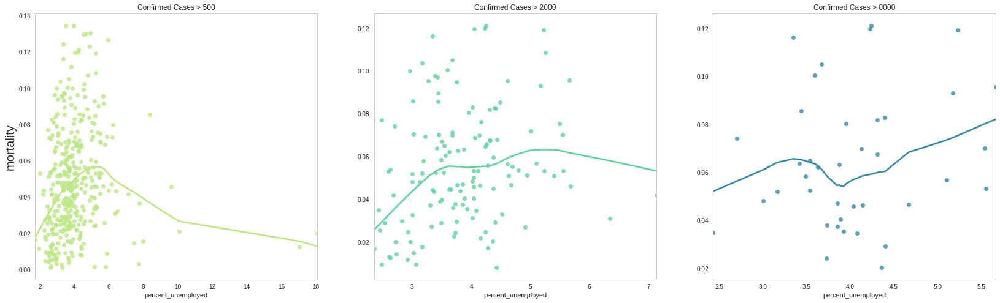

In [ ]:
# Unemployed

col_name = 'percent_unemployed'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

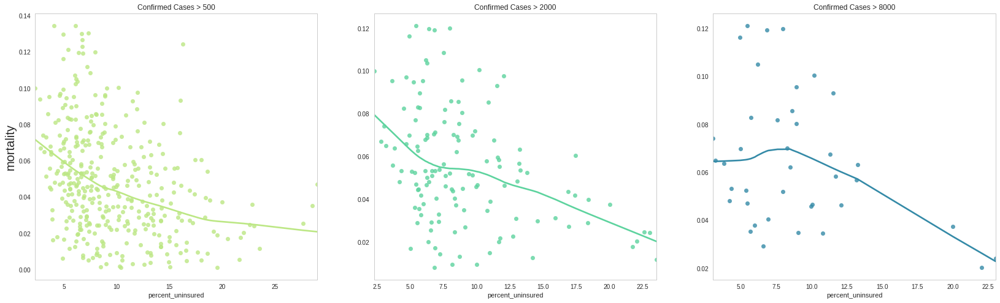

In [ ]:
# Unensured

col_name = 'percent_uninsured'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

**Health Variables**:
Smokers, Alcohol, diabetes, life expectancy, infant moratlity rate, Social Association Rate


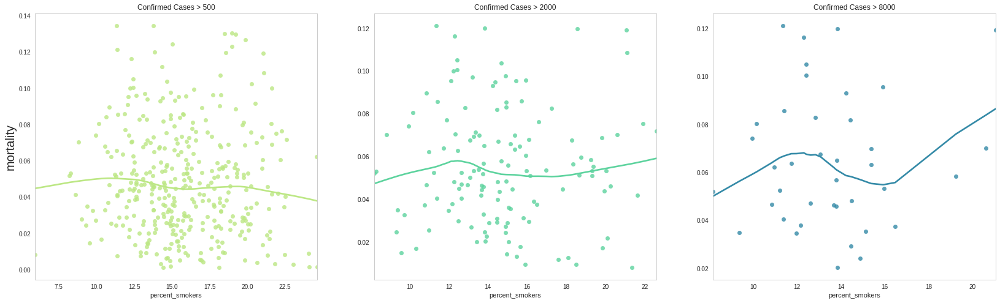

In [ ]:
# Smokers

col_name = 'percent_smokers'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

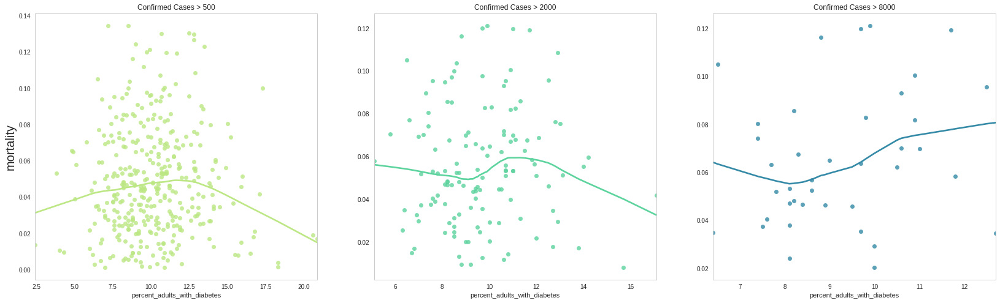

In [ ]:
# Diabetes
col_name = 'percent_adults_with_diabetes'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

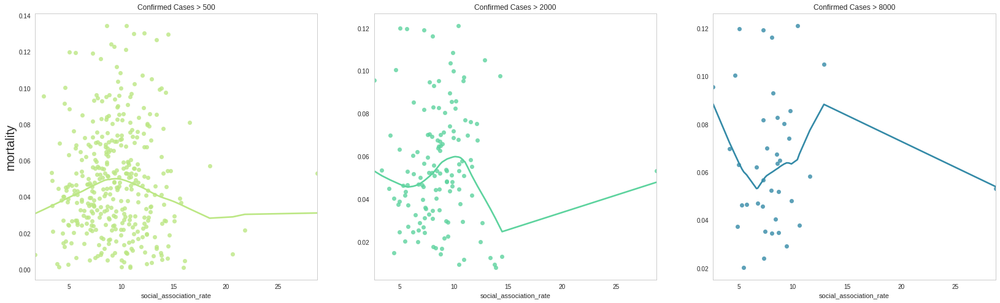

In [ ]:
# Soc association 

col_name = 'social_association_rate'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

### Global Mobility Data 

In [ ]:
df_mobility
df_mobility = df_mobility.drop(columns=['sub_region_1', 'sub_region_2'])
df_mobility.head(2)

,country_region_code,country_region,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,2/15/2020,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,2/16/2020,1.0,4.0,4.0,1.0,2.0,1.0


In [ ]:
# remove missing values
df_mobility.dropna(subset=['date'],axis='rows',inplace=True)

df_mobility['date'] = pd.to_datetime(df_mobility.date)
# change date format
df_mobility['pdate']=pd.to_datetime(df_mobility.date)
df_mobility["dayofweek"]=df_mobility.pdate.dt.dayofweek

#df.date=df.date.dt.strftime("%Y-%m-%d")
gr_region=df_mobility.groupby("country_region")
gr_date=df_mobility.groupby("date")
df_region=gr_region.sum()
df_date=gr_date.sum()

In [ ]:
#df_region
#df_date

In [ ]:
df_mob = df_mobility[df_mobility['country_region'] == 'United States']
df_mob.head(2)

,country_region_code,country_region,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,pdate,dayofweek
103361,US,United States,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0,2020-02-15,5
103362,US,United States,2020-02-16,7.0,1.0,16.0,2.0,0.0,-1.0,2020-02-16,6


In [ ]:
# Plot it
plt.figure(figsize=(24,10))
plot1=sns.lineplot(x=df_date.index,y='value',data=df_date)
plot1.set_xticklabels(df_date.index,rotation=90)
plot1.set_title("Trend of Direction request")

In [ ]:
df_mob.isna().sum()

country_region_code                                        0
country_region                                             0
date                                                       0
retail_and_recreation_percent_change_from_baseline     56527
grocery_and_pharmacy_percent_change_from_baseline      63637
parks_percent_change_from_baseline                    169151
transit_stations_percent_change_from_baseline         139807
workplaces_percent_change_from_baseline                 9933
residential_percent_change_from_baseline              124757
dtype: int64

In [ ]:
# Get regional mobility
df_Rmob = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/regional-mobility.csv')
df_Rmob.head(2)

,country,region,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,United Arab Emirates,Total,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,United Arab Emirates,Total,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0


In [ ]:
df_Rmob.isna().sum()

country                     0
region                      0
date                        0
retail                   3670
grocery_and_pharmacy     5096
parks                   15581
transit_stations        12968
workplaces               1242
residential             16256
dtype: int64

In [ ]:
df_Rmob[3:].fillna(0, inplace=True)


In [ ]:
# Subset US
df_Rmob= df_Rmob[df_Rmob['country']=='United States']
df_Rmob

,country,region,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
73563,United States,Total,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0
73564,United States,Total,2020-02-16,7.0,1.0,16.0,2.0,0.0,-1.0
73565,United States,Total,2020-02-17,6.0,0.0,28.0,-9.0,-24.0,5.0
73566,United States,Total,2020-02-18,0.0,-1.0,6.0,1.0,0.0,1.0
73567,United States,Total,2020-02-19,2.0,0.0,8.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
76522,United States,Wyoming,2020-04-07,-32.0,-5.0,15.0,-13.0,-37.0,14.0
76523,United States,Wyoming,2020-04-08,-32.0,-4.0,26.0,-12.0,-38.0,14.0
76524,United States,Wyoming,2020-04-09,-32.0,-5.0,33.0,-13.0,-38.0,14.0
76525,United States,Wyoming,2020-04-10,-33.0,1.0,44.0,-10.0,-41.0,16.0


In [ ]:
df_melt = pd.melt(df_Rmob, id_vars=['date'], value_vars=['retail', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential'])
df_melt.head(2)

,date,variable,value
0,2020-02-15,retail,6.0
1,2020-02-16,retail,7.0


### **PREDICTIONS**

```
# This is formatted as code
```



#### **Logistic Curve**

In [ ]:
df = df_core.copy()

In [ ]:
from scipy.optimize import curve_fit
# We want number of confirmed for each date for each state


df_l = df[df['Date']<"6/6/2020"]
df_l['Date'] =pd.to_datetime(df_l.Date)
state_data = pd.pivot_table(df_l, values=['Confirmed', 'Recovered','Deaths'], index=['Date'], aggfunc=np.sum)

state_data.tail()

,Confirmed,Deaths,Recovered
Date,,,
2020-06-01,1785981,104229,444538
2020-06-02,1806728,104997,458008
2020-06-03,1827466,106026,463642
2020-06-04,1847074,107005,479029
2020-06-05,1867724,108041,484762


In [ ]:
# x_data is number of days since first confirmed and y_data is confirmed data
x_data = range(len(state_data.index))
y_data = state_data['Confirmed']

def log_curve(x, k, x_0, ymax):
    return ymax / (1 + np.exp(-k*(x-x_0)))

# Fit the curve
popt, pcov = curve_fit(log_curve, x_data, y_data, bounds=([0,0,0],np.inf), maxfev=50000)
estimated_k, estimated_x_0, ymax= popt


# Plot the fitted curve
k = estimated_k
x_0 = estimated_x_0
y_fitted = log_curve(range(0,160), k, x_0, ymax)
print(k, x_0, ymax)
#print(y_fitted)
y_data.tail()

0.07385458196930857 95.2744369430536 1846808.6336416567


Date
2020-06-01    1785981
2020-06-02    1806728
2020-06-03    1827466
2020-06-04    1847074
2020-06-05    1867724
Name: Confirmed, dtype: int64

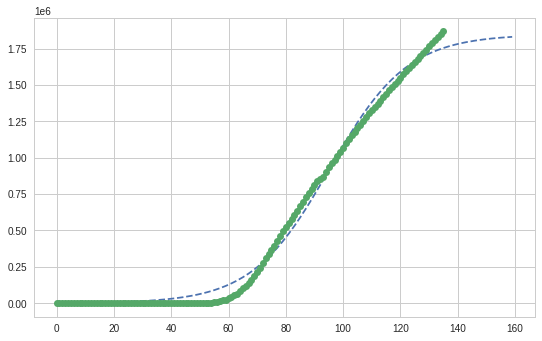

In [ ]:
# Plot everything for illustration
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(range(0,160), y_fitted, '--', label='fitted')
ax.plot(x_data, y_data, 'o', label='Confirmed Data')

Notice that this predicts the US hit the inflection point around day 85 (it is currently day 171 as of June 6th) and this model predicts that the number of confirmed cases will max out around 1846808 cases. This is certainly underestimating. We should also consider that the number of positive undiagnosed plus positive diagnosed cases in each country is likely to be much higher than the number of confirmed cases. This, along with the fact that most countries aren't testing enough, means the mortality rate is likely inflated since the number of actual positive cases in each population is likely considerably higher than confirmed cases

#### **AR**

An autoregressive model is when a value from a time series is regressed on previous values from that same time series.

In [ ]:
df.tail(2)

,State_abb,State,Date,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
4954,WV,West Virginia,6/6/2020,38.855977,-80.589955,2119,84,1445,590,118.238069,108518,0,3.964134,6055.195249,0.000000
4955,WY,Wyoming,6/6/2020,42.981420,-107.270327,933,17,755,161,161.206996,27612,90,1.822079,4770.897731,9.646302


To perform the time series analysis, we need to convert the dataframe into time series format.

In [ ]:
state_data.head(2)

,Confirmed,Deaths,Recovered
Date,,,
2020-01-22,1,0,0
2020-01-23,1,0,0


In [ ]:
df_ts = state_data.drop(['Deaths', 'Recovered'], axis=1)
#del df_ts.index.name
#df_ts

In [ ]:
#df_ts.index = pd.to_datetime(df_ts.index)
df_ts.index.name = None
df_ts.head(3)

,Confirmed
2020-01-22,1
2020-01-23,1
2020-01-24,1


In [ ]:
df_ts.tail(10)

,Confirmed
2020-05-27,1677206
2020-05-28,1695534
2020-05-29,1717853
2020-05-30,1741957
2020-05-31,1766032
2020-06-01,1785981
2020-06-02,1806728
2020-06-03,1827466
2020-06-04,1847074
2020-06-05,1867724


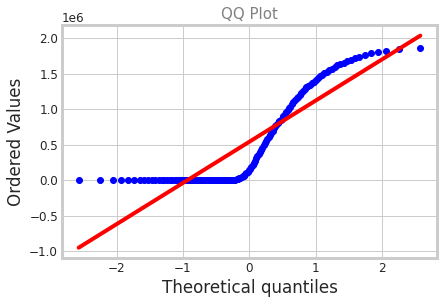

In [ ]:
# Check if the time series follow the normal distribution
scipy.stats.probplot(df_ts.Confirmed, plot=pylab)
plt.title("QQ Plot", size = 15, color = 'gray')
pylab.show()

A Q-Q plot stands for a "quantile-quantile plot". It is a plot where the axes are purposely transformed in order to make a normal (or Gaussian) distribution appear in a straight line. In other words, a perfectly normal distribution would exactly follow a line with slope = 1 and intercept = 0. In this case, the time series is not following a normal distribution.

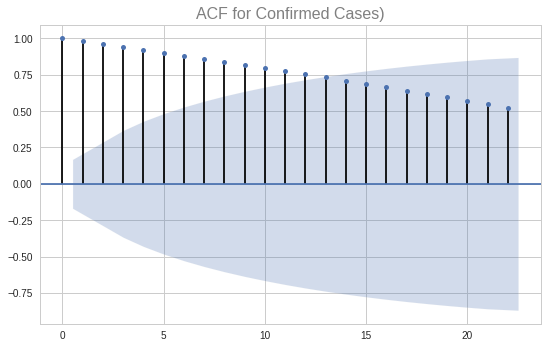

In [ ]:
# ACF plot
plot_acf(df_ts);
plt.title('ACF for Confirmed Cases)', size =16, color = "gray")
plt.show() # it is decreasing

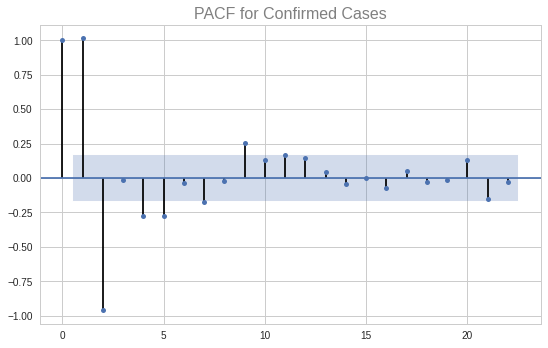

In [ ]:
# PACF plot
plot_pacf(df_ts, method='ols');
plt.title('PACF for Confirmed Cases', size=16, color = "gray")
plt.show()

The firt 3 are significan, we can use general time series. The trend in the series have to be removed. 

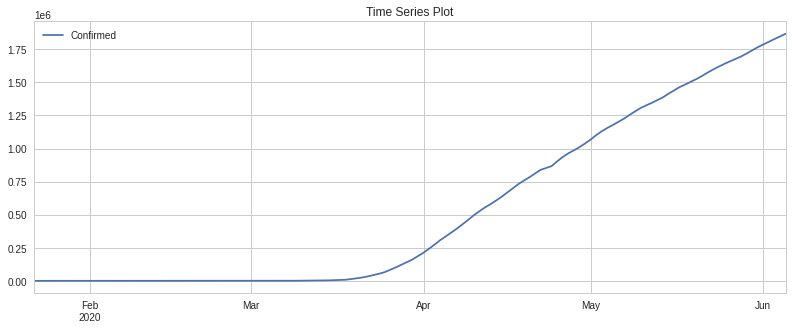

In [ ]:
from matplotlib import pyplot
df_ts.plot(figsize=(12,5), title='Time Series Plot')
pyplot.show()

In [ ]:
## Check the stationarity
# Define function for ADF test
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

#apply adf test on the series
adf_test(df_ts.Confirmed) #squeeze to get rid of 1 dimension

Results of Dickey-Fuller Test:
Test Statistic                   0.255341
p-value                          0.975200
#Lags Used                      11.000000
Number of Observations Used    124.000000
Critical Value (1%)             -3.484220
Critical Value (5%)             -2.885145
Critical Value (10%)            -2.579359
dtype: float64


If the test statistic is less than the critical value, we can reject the null hypothesis (aka the series is stationary). When the test statistic is greater than the critical value, we fail to reject the null hypothesis (which means the series is not stationary).

In our above example, the test statistic > critical value, which implies that the series is not stationary. This confirms our original observation which we initially saw in the visual test.
AR model does not work vary well on non-stataionary time series.

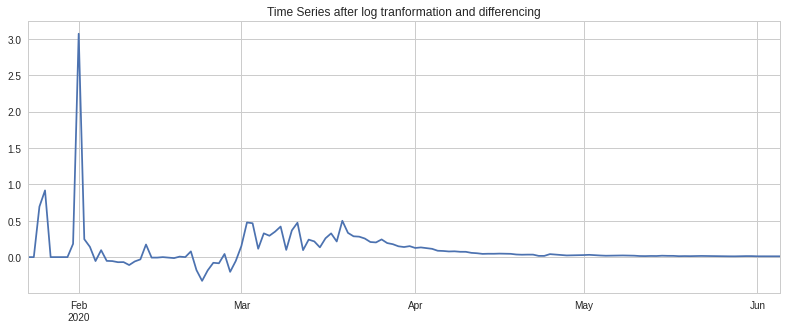

In [ ]:
# Differencing 
df_ts.Confirmed_log = np.log(df_ts.Confirmed)
df_ts.Confirmed_logd = df_ts.Confirmed_log - df_ts.Confirmed_log.shift(1)
df_ts.Confirmed_logd.dropna().plot(figsize=(12,5), title = 'Time Series after log tranformation and differencing')

In [ ]:
adf_test(df_ts.Confirmed_logd.dropna()) #stationary

Results of Dickey-Fuller Test:
Test Statistic                -5.735791e+00
p-value                        6.443160e-07
#Lags Used                     2.000000e+00
Number of Observations Used    1.320000e+02
Critical Value (1%)           -3.480888e+00
Critical Value (5%)           -2.883697e+00
Critical Value (10%)          -2.578586e+00
dtype: float64


The root-mean-square deviation or root-mean-square error is a frequently used measure of the differences between values predicted by a model or an estimator and the values observed.

In [ ]:
## With the logged 
shift_1=df_ts.Confirmed_log.shift(1)
AR_df2=pd.concat([df_ts.Confirmed_log,shift_1], axis=1)
AR_df2=AR_df2[1:]
AR_df2.columns=['Actual_Confirmed','Forecaset_Confirmed']
mse = mean_squared_error(AR_df2.Actual_Confirmed,AR_df2.Forecaset_Confirmed)
rmse=sqrt(mse)
print('The baseline RMSE: {:.3f}'.format(rmse))

The baseline RMSE: 0.320


In [ ]:
##  With the regular
shift_2=df_ts.shift(1)
AR_df3=pd.concat([df_ts,shift_2], axis=1)
AR_df3=AR_df3[1:]
AR_df3.columns=['Actual_Confirmed','Forecaset_Confirmed']
mse = mean_squared_error(AR_df3.Actual_Confirmed,AR_df3.Forecaset_Confirmed)
rmse=sqrt(mse)
print('The baseline RMSE: {:.3f}'.format(rmse))

The baseline RMSE: 18748.125


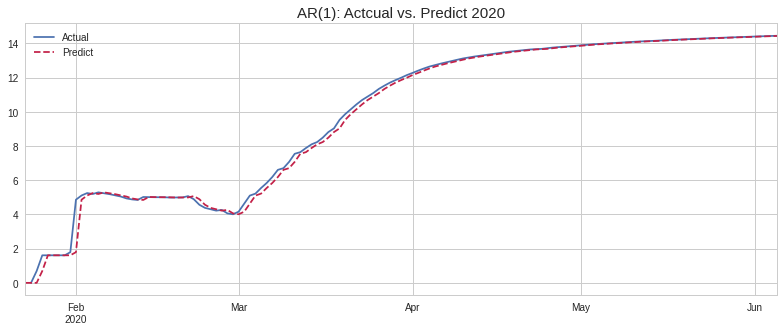

In [ ]:
AR_df2.Actual_Confirmed[1:]['2020'].plot(figsize=(12,5), label='Actual');
AR_df2.Forecaset_Confirmed['2020'].plot(figsize=(12,5), label='Predict', color='#C32148', style='--');
plt.title('AR(1): Actcual vs. Predict 2020', size=15)
plt.legend()
plt.show()

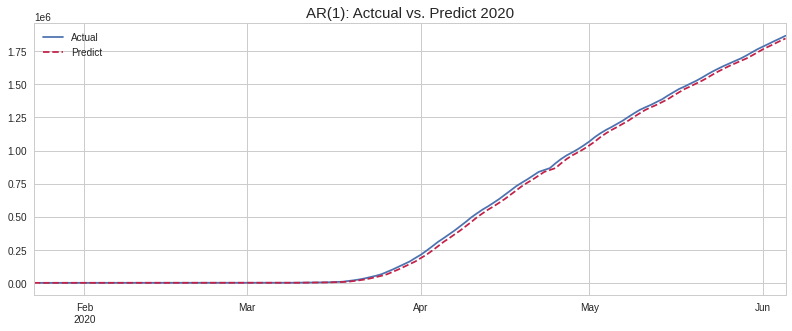

In [ ]:
AR_df3.Actual_Confirmed[1:]['2020'].plot(figsize=(12,5), label='Actual');
AR_df3.Forecaset_Confirmed['2020'].plot(figsize=(12,5), label='Predict', color='#C32148', style='--');
plt.title('AR(1): Actcual vs. Predict 2020', size=15)
plt.legend()
plt.show()

In [ ]:
## Automation of Testing
# Combine it all in one function
def adf_test(timeseries_df):
    print('\tState: {}\n'.format(timeseries_df.columns[0]))

    # Plotting
    timeseries_df.plot(title='Time Series Plot', figsize=(8,5));
    plt.show()
    timeseries_df.hist(figsize=(8,5));
    plt.title('Histogram')
    plt.show()
    timeseries_df.boxplot(flierprops= {'marker':'D', 'markerfacecolor':'g'}, figsize=(8,5), vert=False); 
    plt.title('Box Plot')
    plt.show()
    scipy.stats.probplot(timeseries_df.squeeze(), plot=pylab); #squeeze to get rid of 1 dimension
    plt.title("QQ Plot", size = 12)
    pylab.show()

    # Statistics
    print('Central of tendency:')
    print('{:10}: {}'.format('Mean', timeseries_df.mean()[0]))
    print('{:10}: {}'.format('Median', timeseries_df.median()[0]))
    
    # Augmented Dickey-Fuller unit root test
    adf_test = adfuller(pd.Series(timeseries_df.squeeze())) #squeeze to get rid of 1 dimension
    print('\nADF Statistic: {:.6f}'.format(adf_test[0]) )
    print('p-value: {:.6f}'.format(adf_test[1]))
    print('Critical Values:')
    for key, value in adf_test[4].items():
        print('\t{:>3s}: {:.3f}'.format(key, value))   

    if adf_test[1] <= 0.05:
        print("\n** Reject the null hypothesis. Data has no unit root and is stationary **")
    else:
        print("\n** Fail to reject the null hypothesis. Data has unit root and is non-stationary **")

	State: Florida



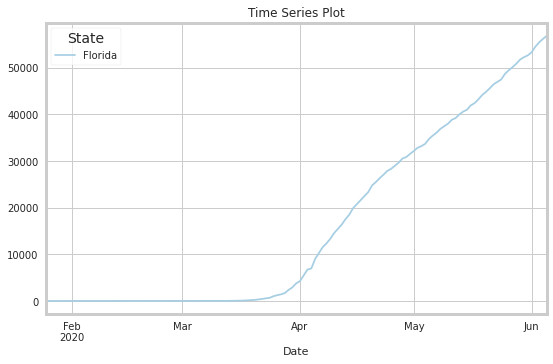

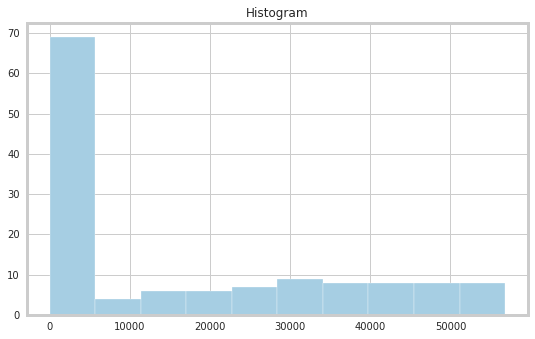

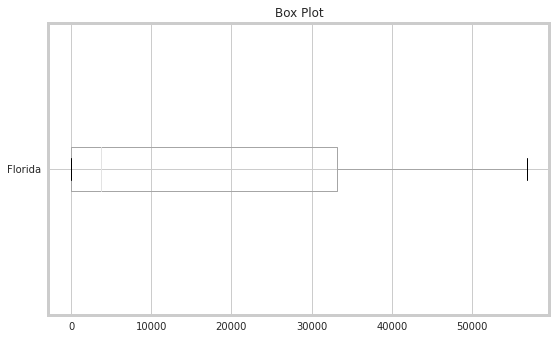

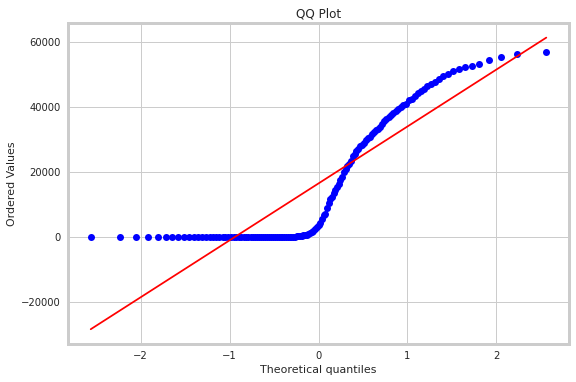

Central of tendency:
Mean      : 16419.496240601504
Median    : 3763.0

ADF Statistic: 0.042245
p-value: 0.961889
Critical Values:
	 1%: -3.483
	 5%: -2.885
	10%: -2.579

** Fail to reject the null hypothesis. Data has unit root and is non-stationary **


In [ ]:
plt.style.use('seaborn-notebook')
adf_test(dfTS[['Florida']].shift(3)[3:]) # just for one state

	State: New York



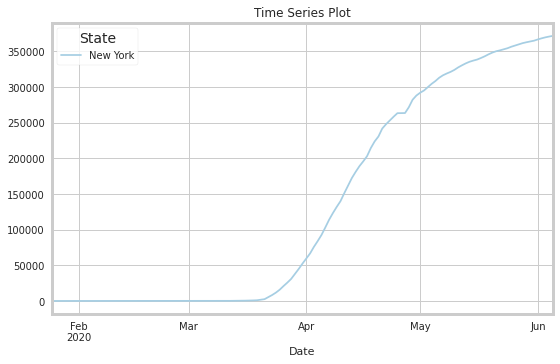

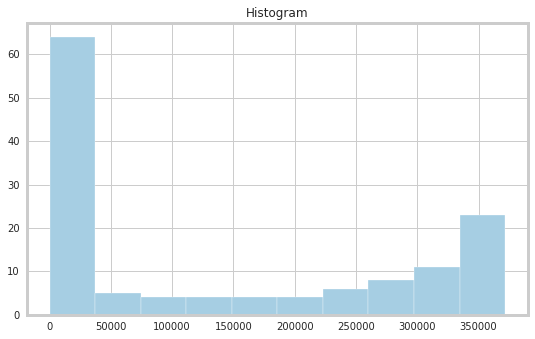

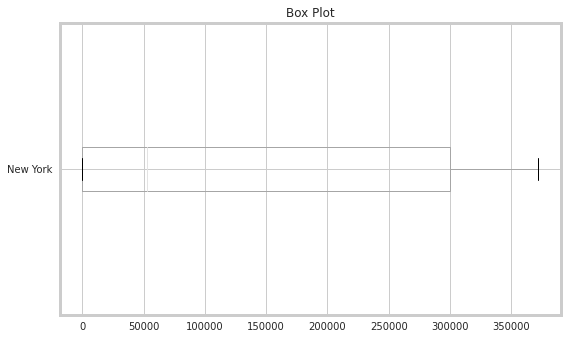

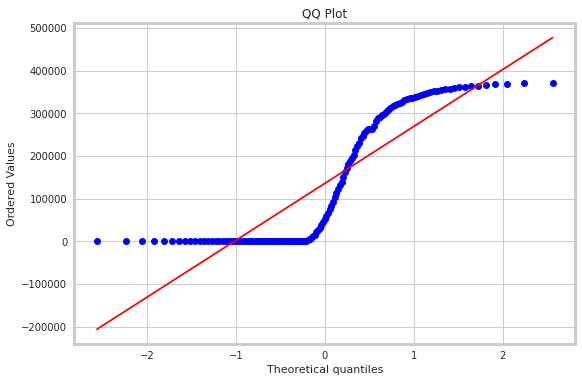

Central of tendency:
Mean      : 135818.08270676693
Median    : 52410.0

ADF Statistic: -0.487415
p-value: 0.894449
Critical Values:
	 1%: -3.487
	 5%: -2.886
	10%: -2.580

** Fail to reject the null hypothesis. Data has unit root and is non-stationary **


In [ ]:
adf_test(dfTS[['New York']].shift(3)[3:]) # just for one state

In [ ]:
df_l = df[df['Date']<"6/6/2020"]
df_l['Date'] =pd.to_datetime(df_l.Date)
dfTS = pd.pivot_table(df_l, values='Confirmed', index=['Date'], columns = ['State'],aggfunc=np.sum, fill_value=0)

dfTS.head(3)

State,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,...,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
dfTS.index

DatetimeIndex(['2020-01-22', '2020-01-23', '2020-01-24', '2020-01-25',
               '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29',
               '2020-01-30', '2020-01-31',
               ...
               '2020-05-27', '2020-05-28', '2020-05-29', '2020-05-30',
               '2020-05-31', '2020-06-01', '2020-06-02', '2020-06-03',
               '2020-06-04', '2020-06-05'],
              dtype='datetime64[ns]', name='Date', length=136, freq=None)

In [ ]:
dfTS.shape

(136, 51)

In [ ]:
## Enumerate and convert for Prophet !!!
dfPR = dfTS.copy()
dfs = []
for i, state in enumerate(dfPR.columns):
  # add only from the first valid index
  dfs.append(dfPR.loc[dfPR.loc[:,state].first_valid_index():,state])
  dfs[i] = dfs[i].to_frame()
  dfs[i].name = state
  dfs[i]['ds'] = dfs[i].index
  dfs[i].rename(columns={state: 'y'}, inplace = True)

## Check the firststate
print(dfs[0].name)

Alabama


In [ ]:
dfPR.head(2)

State,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,...,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
df = df_core.copy()

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
#We will use it to smooth the data for growth factor
plt.style.use('seaborn-notebook')
def smoother(inputdata,w,imax):
    data = 1.0*inputdata
    data = data.replace(np.nan,1)
    data = data.replace(np.inf,1)
    #print(data)
    smoothed = 1.0*data
    normalization = 1
    for i in range(-imax,imax+1):
        if i==0:
            continue
        smoothed += (w**abs(i))*data.shift(i,axis=0)
        normalization += w**abs(i)
    smoothed /= normalization
    return smoothed
# function to compute growth factor
def growth_factor(confirmed):
    confirmed_iminus1 = confirmed.shift(1, axis=0)
    confirmed_iminus2 = confirmed.shift(2, axis=0)
    return (confirmed-confirmed_iminus1)/(confirmed_iminus1-confirmed_iminus2)
#function to compute growth ratio
def growth_ratio(confirmed):
    confirmed_iminus1 = confirmed.shift(1, axis=0)
    return (confirmed/confirmed_iminus1)

# We don't need a function for growth rate since we can use the np.gradient() function.

# This is a function which plots (for in input country) the active, confirmed, and recovered cases, deaths, and the growth factor.
def plot_country_active_confirmed_recovered_growth_metrics(country):
    
    # Plots Active, Confirmed, and Recovered Cases. Also plots deaths.
    country_data = df.copy()
    table = country_data.drop(['Lat','Lon', 'State_abb', 'Active', 'Incident_Rate', 'People_Tested', 'People_Hospitalized', 'Mortality_Rate','Testing_Rate', 'Hospitalization_Rate'], axis=1)
    table['ActiveCases'] = table['Confirmed'] - table['Recovered'] - table['Deaths']
    table2 = pd.pivot_table(table, values=['ActiveCases','Confirmed', 'Recovered','Deaths'], index=['Date'], aggfunc=np.sum)
    table3 = table2.drop(['Deaths'], axis=1)
   
    # Growth Factor
    w = 0.5
    table2['GrowthFactor'] = growth_factor(table2['Confirmed'])
    table2['GrowthFactor'] = smoother(table2['GrowthFactor'],w,5)

    # 2nd Derivative
    table2['2nd_Derivative'] = np.gradient(np.gradient(table2['Confirmed'])) #2nd derivative
    table2['2nd_Derivative'] = smoother(table2['2nd_Derivative'],w,7)


    #Plot confirmed[i]/confirmed[i-1], this is called the growth ratio
    table2['GrowthRatio'] = growth_ratio(table2['Confirmed'])
    table2['GrowthRatio'] = smoother(table2['GrowthRatio'],w,5)
    
    #Plot the growth rate, we will define this as k in the logistic function presented at the beginning of this notebook.
    table2['GrowthRate']=np.gradient(np.log(table2['Confirmed']))
    table2['GrowthRate'] = smoother(table2['GrowthRate'],0.5,3)
    
    # horizontal line at growth rate 1.0 for reference
    x_coordinates = [1, 100]
    y_coordinates = [1, 1]
    #plots
    table2['Deaths'].plot(title='Deaths')
    plt.show()
    table3.plot() 
    plt.show()
    table2['GrowthFactor'].plot(title='Growth Factor')
    plt.plot(x_coordinates, y_coordinates) 
    plt.show()
    table2['2nd_Derivative'].plot(title='2nd_Derivative')
    plt.show()
    table2['GrowthRatio'].plot(title='Growth Ratio')
    plt.plot(x_coordinates, y_coordinates)
    plt.show()
    table2['GrowthRate'].plot(title='Growth Rate')
    plt.show()

    
   # import plotly.express as px
   # table3 = table3.melt(id_vars="ObservationDate", value_vars=['ActiveCases','Confirmed','Recovered'],
   #              var_name='case', value_name='count')
   # table3.reindex()
   # fig = px.area(table3, x="ObservationDate", y="count", color='case',
   #              title='Confirmed Cases', color_discrete_sequence = ['cyan', 'red', 'orange'])
   # fig.show()

    return 

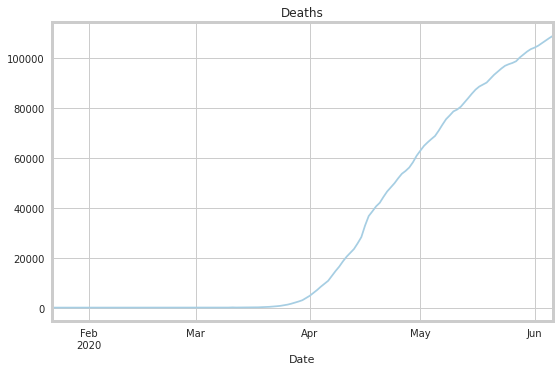

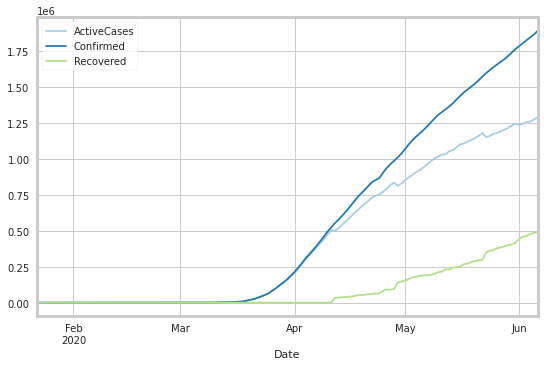

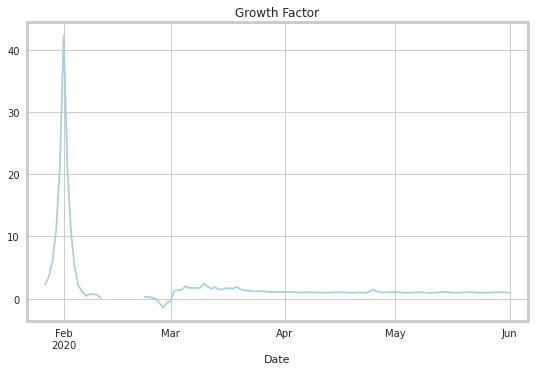

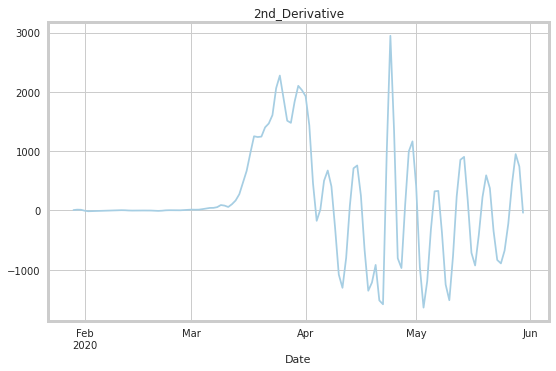

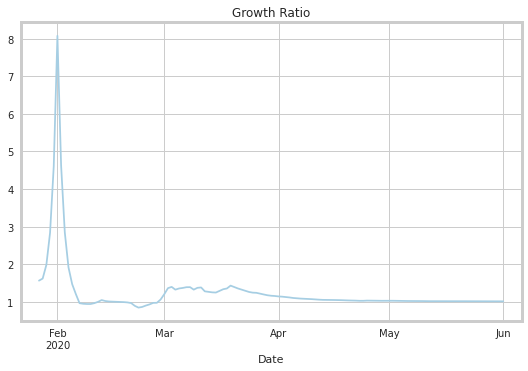

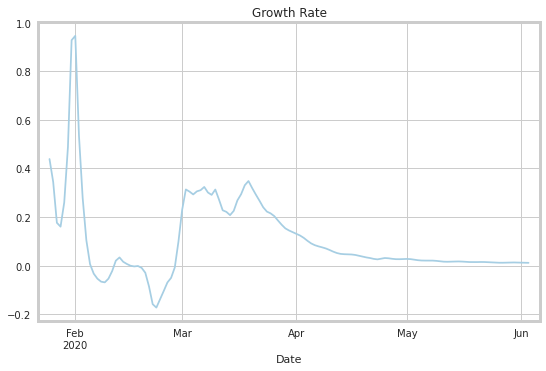

In [ ]:
plot_country_active_confirmed_recovered_growth_metrics('Washington')

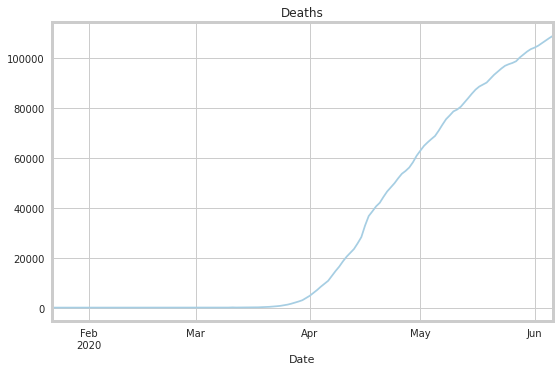

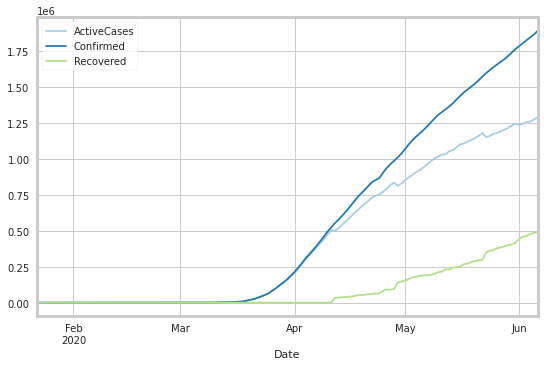

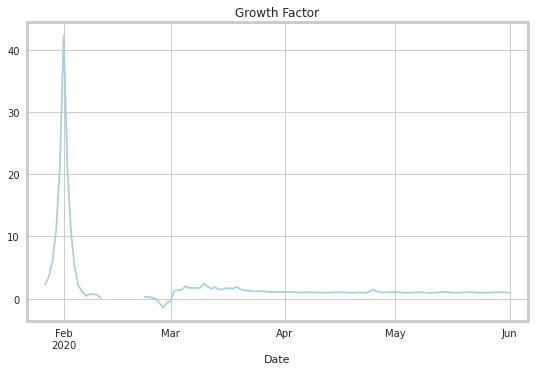

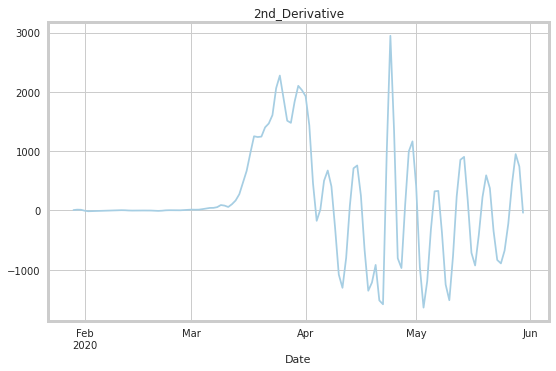

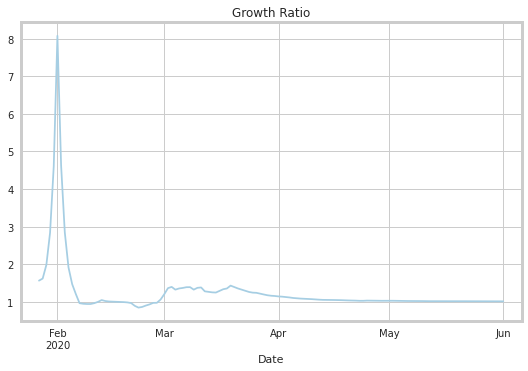

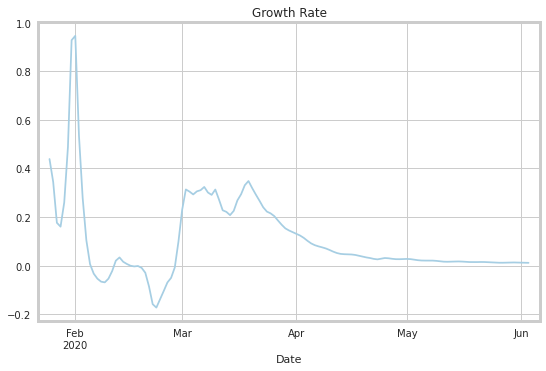

In [ ]:
plot_country_active_confirmed_recovered_growth_metrics('New York')

#### **ARIMA**

In [ ]:
## Load the packages
%matplotlib inline
import pandas as pd
from fbprophet import Prophet

import matplotlib.pyplot as plt
#plt.style.use('fivethirtyeight')

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from math import sqrt
import scipy.stats
import pylab

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from statsmodels.tsa.arima_model import ARIMA 
from pandas import Series
from statistics import mean
from statistics import median
from math import sqrt
import math

import itertools
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 300)
from google.colab import files

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
from pandas.plotting import register_matplotlib_converters
import seaborn as sns
import plotly.graph_objects as go

import statsmodels.api as sm  # statistical models (including regression)
import statsmodels.formula.api as smf  # R-like model specification


from matplotlib import pyplot

from scipy.stats import boxcox
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf


from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARIMAResults

import plotly as py
import plotly.graph_objects as go

!pip install pmdarima
import pmdarima as pm
from pmdarima.arima import auto_arima

pd.plotting.register_matplotlib_converters() 


Compare the models for individual states

In [ ]:
## Build train and test set
train = df_ts[:len(df_ts)-12]
print('Train shape: {}'.format(train.shape))
test = df_ts[len(df_ts)-12:]
print('Test shape: {}'.format(test.shape))
start_date = '2020-06-06'
end_date = '2020-12-06'

Train shape: (124, 1)
Test shape: (12, 1)


In [ ]:
#train
test

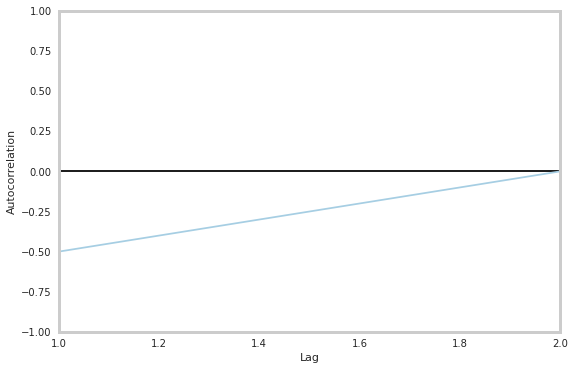

In [ ]:
from pandas.plotting import autocorrelation_plot
# Get the quterly numbers
df_ts_q = df_ts.resample('Q').mean()
df_ts_q.head()
autocorrelation_plot(df_ts_q)
plt.show()

# p value 11-12

In [ ]:
## Build parameters for grid search
import itertools
p_values=range(0,12)
d_values=range(0,3)
q_values=range(0,3)
pdq=list(itertools.product(p_values,d_values,q_values))
len(pdq)

108

In [ ]:
"""#from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_ts_q, lags=15) # q value is 2"""

'#from statsmodels.graphics.tsaplots import plot_pacf\nplot_pacf(df_ts_q, lags=15) # q value is 2'

In [ ]:
import warnings
from math import sqrt
warnings.filterwarnings('ignore')

best_score=None
for parameter in pdq:
    try:
        model_arima = ARIMA(train, order=parameter)
        model_arima_fit=model_arima.fit(disp=0)
        predictions = model_arima_fit.forecast(steps=len(test))[0]
#        predictions = model_arima_fit.predict(start= start_date, end= end_date) # store only the predictions
        mse=mean_squared_error(test, predictions)
      
        rmse = sqrt(mse)
        print('ARIMA{}, RMSE={}'.format(parameter,round(rmse,4)))
        
    except:
        continue

ARIMA(0, 0, 1), RMSE=1293244.0423
ARIMA(0, 1, 1), RMSE=54642.9429
ARIMA(0, 1, 2), RMSE=48498.4301
ARIMA(0, 2, 1), RMSE=15933.5446
ARIMA(0, 2, 2), RMSE=21347.6251
ARIMA(1, 0, 0), RMSE=152172.7692
ARIMA(1, 1, 0), RMSE=6414.4133
ARIMA(1, 1, 1), RMSE=4279.3405
ARIMA(1, 1, 2), RMSE=8043.3932
ARIMA(1, 2, 0), RMSE=14440.3675
ARIMA(1, 2, 1), RMSE=20335.464
ARIMA(1, 2, 2), RMSE=21132.9798
ARIMA(2, 0, 0), RMSE=31367.7116
ARIMA(2, 1, 0), RMSE=4776.4158
ARIMA(2, 1, 1), RMSE=6460.2142
ARIMA(2, 1, 2), RMSE=8046.4066
ARIMA(2, 2, 0), RMSE=21040.4508
ARIMA(2, 2, 1), RMSE=22405.7042
ARIMA(2, 2, 2), RMSE=15502.6158
ARIMA(3, 0, 0), RMSE=16768.8328
ARIMA(3, 1, 0), RMSE=7487.197
ARIMA(3, 1, 1), RMSE=9403.804
ARIMA(3, 1, 2), RMSE=8813.4013
ARIMA(3, 2, 0), RMSE=22953.3019
ARIMA(3, 2, 1), RMSE=22732.6161
ARIMA(4, 1, 0), RMSE=9703.0724
ARIMA(4, 1, 1), RMSE=10017.9301
ARIMA(4, 2, 0), RMSE=22903.3692
ARIMA(4, 2, 1), RMSE=22777.284
ARIMA(4, 2, 2), RMSE=23108.0944
ARIMA(5, 1, 0), RMSE=9890.1633
ARIMA(5, 1, 1), RMSE

In [ ]:
# Build a Automation of ARIMA validation for the following models
def ARIMA_validation(AR, I, MA, training_set, test_set):
    
    from statsmodels.tsa.arima_model import ARIMA
    from statsmodels.graphics.tsaplots import plot_acf
    from statsmodels.graphics.tsaplots import plot_pacf
    import numpy as np
    from sklearn.metrics import mean_squared_error
    from math import sqrt
    import pandas as pd
    import matplotlib.pyplot as plt

    arima_order = (AR,I,MA)
    print('ARIMA{}\n'.format(arima_order))

    # ACF plot
    plot_acf(training_set);
    plt.title('ACF for General Price (MA)', size =15)
    plt.show()

    # PACF plot
    plot_pacf(training_set, method='ols');
    plt.title('PACF for General Price (AR)', size=15)
    plt.show()

    # ARIMA model
    model_arima = ARIMA(training_set, order=arima_order)
    model_arima_fit=model_arima.fit(disp=0)
    predictions = model_arima_fit.forecast(steps=len(test))[0]
    #predictions = model_arima_fit.predict(start= start_date, end = end_date)

    # RMSE
    mse=mean_squared_error(test_set, predictions)
    rmse = sqrt(mse)
    print('{:5}: {}'.format('RMSE', round(rmse,4)))

    # Plotting
    test_set.plot(figsize=(12,5), label='Actual');
    #predictions.plot(figsize=(12,5), label='Predict', color='#C32148', style='--');
    plt.title('Actcual vs. Predicted', size=15)
    plt.legend()
    plt.show()

    # Summary
    print(model_arima_fit.summary())

    # Residual 
    model_arima_fit.resid.plot(title='Line Plot of the Residual Errors')
    plt.show()
    model_arima_fit.resid.plot(kind='kde', title='Density Plot of the Residual Errors')
    plt.show()
    print('Residual Errors Statistics:') 
    print(model_arima_fit.resid.describe())

ARIMA(10, 1, 0)



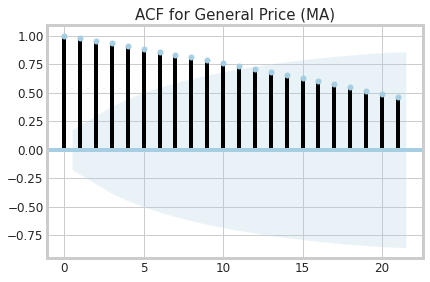

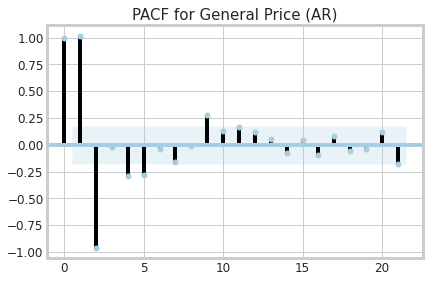

RMSE : 3586.2694


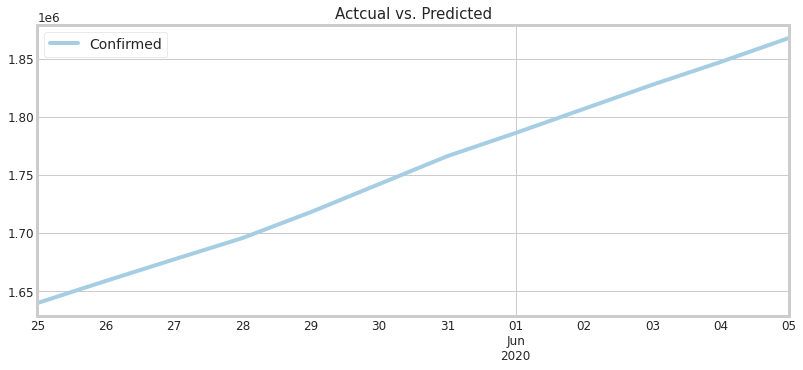

                             ARIMA Model Results                              
Dep. Variable:            D.Confirmed   No. Observations:                  123
Model:                ARIMA(10, 1, 0)   Log Likelihood               -1150.532
Method:                       css-mle   S.D. of innovations           2743.423
Date:                Tue, 09 Jun 2020   AIC                           2325.064
Time:                        01:56:10   BIC                           2358.810
Sample:                    01-23-2020   HQIC                          2338.771
                         - 05-24-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.249e+04   7326.520      1.705      0.091   -1866.600    2.69e+04
ar.L1.D.Confirmed      0.7968      0.089      9.001      0.000       0.623       0.970
ar.L2.D.Confirmed   

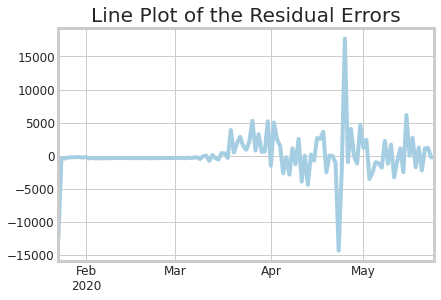

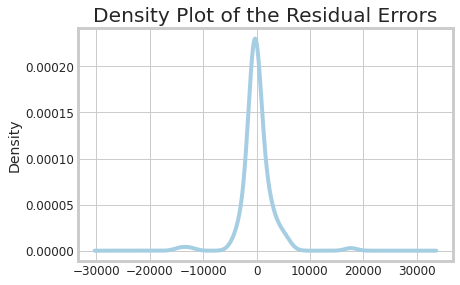

Residual Errors Statistics:
count      123.000000
mean        67.361433
std       2966.654271
min     -14316.143561
25%       -393.742074
50%       -317.931313
75%        713.426636
max      17680.059095
dtype: float64


In [ ]:
# prediction
ARIMA_validation(10,1,0, train, test)

- for all states now

In [ ]:
dfTS.head(2)

State,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,...,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
## Build train and test set
train = dfTS[:len(df_ts)-12]
print('Train shape: {}'.format(train.shape))
test = dfTS[len(df_ts)-12:]
print('Test shape: {}'.format(test.shape))
start_date = '2020-06-06'
end_date = '2020-12-30'

Train shape: (124, 51)
Test shape: (12, 51)


In [ ]:
#test

In [ ]:
zipcode=[]
RMSE=[]
for i, z in enumerate(tuple(dfTS.columns), start = 1):
    try:
        zip_train = train.loc[:,z]
        zip_test = test.loc[:,z]
        # ARIMA model
        model_arima = ARIMA(zip_train, order=(10,1,0))
        model_arima_fit=model_arima.fit(disp=0)
        predictions = model_arima_fit.forecast(steps=len(test))[0]
        #predictions = model_arima_fit.predict(start= start_date, end = end_date)

        # RMSE
        mse=mean_squared_error(zip_test, predictions)
        rmse = sqrt(mse)
        zipcode.append(z)
        RMSE.append(rmse)
        print('{}. State:{}, RMSE={}'.format(i, z,round(rmse,4)))
    except:
        continue

1. State:Alabama, RMSE=290.6128
2. State:Alaska, RMSE=35.8079
3. State:Arizona, RMSE=1292.2349
4. State:Arkansas, RMSE=225.2063
5. State:California, RMSE=2558.6527
6. State:Colorado, RMSE=335.9283
7. State:Connecticut, RMSE=565.8175
8. State:Delaware, RMSE=203.4581
9. State:District of Columbia, RMSE=148.5256
10. State:Florida, RMSE=462.6419
11. State:Georgia, RMSE=906.4028
12. State:Hawaii, RMSE=4.0716
13. State:Idaho, RMSE=36.756
14. State:Illinois, RMSE=6166.3765
15. State:Indiana, RMSE=386.6548
16. State:Iowa, RMSE=430.3724
17. State:Kansas, RMSE=266.4525
18. State:Kentucky, RMSE=196.187
19. State:Louisiana, RMSE=1451.2764
20. State:Maine, RMSE=156.3153
21. State:Maryland, RMSE=1695.709
22. State:Massachusetts, RMSE=1198.1565
23. State:Michigan, RMSE=421.6589
24. State:Minnesota, RMSE=1059.5417
25. State:Mississippi, RMSE=207.3595
26. State:Missouri, RMSE=496.0068
27. State:Montana, RMSE=33.9199
28. State:Nebraska, RMSE=418.3047
29. State:Nevada, RMSE=328.6064
30. State:New Hampshi

In [ ]:
model_arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Wyoming   No. Observations:                  123
Model:                ARIMA(10, 1, 0)   Log Likelihood                -475.074
Method:                       css-mle   S.D. of innovations             11.465
Date:                Tue, 09 Jun 2020   AIC                            974.149
Time:                        21:36:35   BIC                           1007.895
Sample:                    01-23-2020   HQIC                           987.857
                         - 05-24-2020                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                6.3592      3.598      1.768      0.077      -0.692      13.410
ar.L1.D.Wyoming      0.0264      0.088      0.300      0.764      -0.146       0.199
ar.L2.D.Wyoming      0.0117      0.088      0.133      0.894      -0.160       0.184
ar.L3.D.Wyoming     -0.0222      0.087     -0.255      0.799      -0.193       0.149
ar.L4.D.Wyoming      0.1492      0.086      1.741      0.082      -0.019       0.317
ar.L5.D.Wyoming      0.1185      0.086      1.378      0.168      -0.050       0.287
ar.L6.D.Wyoming      0.0286      0.087      0.331      0.741      -0.141       0.198
ar.L7.D.Wyoming      0.1346      0.085      1.579      0.114      -0.033       0.302
ar.L8.D.Wyoming      0.0832      0.086      0.963      0.335      -0.086       0.253
ar.L9.D.Wyoming      0.0337      0.087      0.390      0.697      -0.136       0.203
ar.L10.D.Wyoming     0.1872      0.086      2.172      0.030       0.018       0.356
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.0420           -0.0000j            1.0420           -0.0000
AR.2             0.9311           -0.7813j            1.2155           -0.1111
AR.3             0.9311           +0.7813j            1.2155            0.1111
AR.4            -1.2019           -0.0000j            1.2019           -0.5000
AR.5            -0.9750           -0.6579j            1.1762           -0.4055
AR.6            -0.9750           +0.6579j            1.1762            0.4055
AR.7             0.3410           -1.1517j            1.2011           -0.2042
AR.8             0.3410           +1.1517j            1.2011            0.2042
AR.9            -0.3073           -1.1627j            1.2026           -0.2911
AR.10           -0.3073           +1.1627j            1.2026            0.2911
------------------------------------------------------------------------------
"""

In [ ]:
predictions # 12 

array([824.50031665, 836.4876112 , 848.0364003 , 857.0908435 ,
       867.12449945, 875.93771682, 885.18752171, 895.02702791,
       902.9659516 , 912.24436767, 921.39636389, 930.70826667])

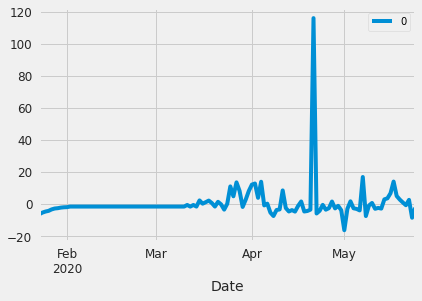

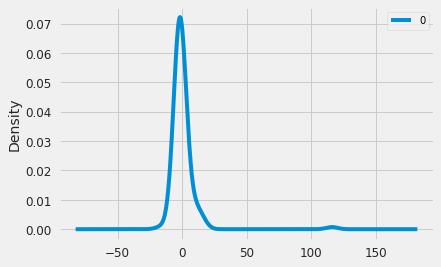

                0
count  123.000000
mean     0.369312
std     11.513214
min    -16.333479
25%     -2.631690
50%     -1.583042
75%      0.220857
max    116.019692


In [ ]:
# plot residual errors
from pandas import DataFrame
residuals = DataFrame(model_arima_fit.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

In [ ]:
state_models = pd.DataFrame({'State':zipcode,'RMSE': RMSE})
state_models.sort_values("RMSE", axis = 0, ascending = True, 
                 inplace = True)
state_models

,State,RMSE
11,Hawaii,4.071562
44,Vermont,7.523086
49,Wyoming,8.921172
47,West Virginia,31.028365
26,Montana,33.919936
1,Alaska,35.807895
12,Idaho,36.755956
36,Oregon,95.498175
40,South Dakota,115.975382
29,New Hampshire,126.036501


In [ ]:
state_models.to_csv('/content/drive/My Drive/data/arima_state.csv', index=False)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
state_models.head(2)

,State,RMSE
11,Hawaii,4.071562
44,Vermont,7.523086


In [ ]:
state_models.shape

(50, 2)

#### **ARIMA**

In [ ]:
# define a function to run auto arima and search for best model parameters
import matplotlib.dates as mdates
def find_orders(ts, exog=None):

    stepwise_model = pm.auto_arima(ts, start_p=1, start_q=1, max_p=4, max_q=14,
                                exogenous=exog, 
                                m=30, seasonal=True, stationary=False,
                                stepwise=True, trend='ct',
                                suppress_warnings=True, trace=False, 
                                error_action='ignore')

    return stepwise_model.order, stepwise_model.seasonal_order

def fit_sarimax_model(ts, exog=None, order=(10,1,1), seasonal_order=(0, 0, 0, 12), summary=True, plot=True):
  
    # fit model with exog
    model = sm.tsa.statespace.SARIMAX(ts, 
                                  exog = exog,  
                                  order=order,
                                  seasonal_order=seasonal_order,
                                  trend='ct',
                                  enforce_stationarity=True,
                                  enforce_invertibility=False)

    output = model.fit(d=0)
    
    if summary==True:
        print(output.summary())

    if plot==True:
        # plot model diagnostics
        output.plot_diagnostics(figsize=(15, 18))
        plt.show()
        
    return output

def get_predictions(test, exog, model_output, plot=True, show=True):
    
    # Use the model to forecast one month into 2020 and store the confidence intervals
    pred = model_output.get_prediction(start=pd.to_datetime('2020-06-06'), end=pd.to_datetime('2020-07-05'), dynamic=False, exog=exog)
    pred_ci = pred.conf_int()
    
    # Plot the actual results for 2018 vs the projected results. 
    ax = test['2020-06-061':].plot(label='observed')
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(8,6))
    
    
    if plot:
        #Plot observed and predicted values with confidence interval
        ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

        ax.set_xlabel('Date')
        ax.set_ylabel('Household Value')
        plt.legend(loc='upper left')
        plt.show()

    
    if show:
        
        # Obtain the predicted mean, merge with the actual values, and compute the MSE. 
        y_pred = pred.predicted_mean.reset_index()
        y_pred.columns = ['date', 'value']
        
        y_test = test.reset_index()
        
        # Compute the mean square error / RMSE
        mse = mean_squared_error(y_test.value, y_pred.value)

        rmse = math.sqrt(mse)
        r2 = r2_score(y_test.value, y_pred.value)

        # Print the results. 
        print('RMSE: ' +  str(format(round(rmse, 3))))
        print('R-squared: ' + str(format(round(r2, 3))))

def get_future(ds, exog, steps, model_output, plot):

    # Get forecast and confidence interval from base model, by steps 30
    

    #future_1y= model_output.forecast(steps=12, exog=exog)
    future_1y = model_output.get_forecast(steps=steps, exog=exog, dynamic=True)
    future_conf_1y = future_1y.conf_int(steps=steps)

    print(future_1y.predicted_mean)

    if plot: # plot results

        # 1 yr
        ax = ds.plot(label='Observed', figsize=(12, 8))
        future_1y.predicted_mean.plot(ax=ax, label='Forecast')
        ax.fill_between(future_conf_1y.index,
                        future_conf_1y.iloc[:, 0],
                        future_conf_1y.iloc[:, 1], color='k', alpha=.25)
        ax.xaxis.set_minor_locator(mdates.DayLocator())
        ax.set_xlabel('Date')
        ax.set_ylabel('Returns')
        ax.set_title('1-Month Forecast')
        ax.legend()
        plt.show()        

    df_out = future_conf_1y
    df_out['yhat'] = future_1y.predicted_mean
    df_out.columns = ['yhat_lower', 'yhat_upper', 'yhat']


""" gain_df = pd.DataFrame({'value':df_out['yhat'].values, 'date':df_out.index})
    lastObs = pd.DataFrame({'value':ds.iloc[-1]['value'], 'date':ds.index[-1]}, index=[0])

    # preappend one row from actuals to forecast so that roi can be projected.
    gain_df = pd.concat([ lastObs, gain_df])
    gain_df = gain_df.set_index('date')

    roi = calculate_gain(gain_df, steps=steps, plot=False)

    print(str(steps) + '-Step ROI: ' + str(roi.iloc[0,0]))"""
    #return (df_out)

# function to calculate gain percentage (ROI) on previous 2, 5 and 10 years
# source: https://github.com/gioamorim80/Zillow-Time-Series/blob/master/Module%204%20Final%20Project.ipynb
"""def calculate_gain(ts, steps=12, plot=True): 
    
    '''Takes a time series and performs calculations on returns over investments
    for period of 1 year'''
    
    # calculates ROI by taking current value, decreasing investment(value at x steps in past) and 
    # dividing by investment. Multiplies by 100 to get percentage number
    roi_1 = (ts - ts.shift(periods=steps))/ts.shift(periods=steps)*100
    roi_1.dropna(inplace=True)  

    # plot results
    if plot:
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=roi_1.index, y=roi_1.value, name='1-Year Investment',
                                 line_color='deepskyblue'))
        
        fig.update_layout(title_text='ROI',
                          yaxis_title="ROI (%)", 
                          xaxis_rangeslider_visible=False)
        fig.show()"""
    
    # saves new ts with returns for 1 period
    #return roi_1

'def calculate_gain(ts, steps=12, plot=True): \n    \n    \'\'\'Takes a time series and performs calculations on returns over investments\n    for period of 1 year\'\'\'\n    \n    # calculates ROI by taking current value, decreasing investment(value at x steps in past) and \n    # dividing by investment. Multiplies by 100 to get percentage number\n    roi_1 = (ts - ts.shift(periods=steps))/ts.shift(periods=steps)*100\n    roi_1.dropna(inplace=True)  \n\n    # plot results\n    if plot:\n        fig = go.Figure()\n        fig.add_trace(go.Scatter(x=roi_1.index, y=roi_1.value, name=\'1-Year Investment\',\n                                 line_color=\'deepskyblue\'))\n        \n        fig.update_layout(title_text=\'ROI\',\n                          yaxis_title="ROI (%)", \n                          xaxis_rangeslider_visible=False)\n        fig.show()'

In [ ]:
dfTS.head(2)

State,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,...,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


**Alabama**

In [ ]:
AL = dfTS.iloc[:,0]

2020-06-06    19410.672757
2020-06-07    19752.973922
2020-06-08    20098.919392
2020-06-09    20448.525067
2020-06-10    20801.806844
2020-06-11    21158.780622
2020-06-12    21519.462299
2020-06-13    21883.867774
2020-06-14    22252.012945
2020-06-15    22623.913711
2020-06-16    22999.585970
2020-06-17    23379.045620
2020-06-18    23762.308560
2020-06-19    24149.390688
2020-06-20    24540.307903
2020-06-21    24935.076103
2020-06-22    25333.711186
2020-06-23    25736.229052
2020-06-24    26142.645597
2020-06-25    26552.976721
2020-06-26    26967.238322
2020-06-27    27385.446299
2020-06-28    27807.616549
2020-06-29    28233.764972
2020-06-30    28663.907465
2020-07-01    29098.059927
2020-07-02    29536.238257
2020-07-03    29978.458353
2020-07-04    30424.736114
2020-07-05    30875.087436
Freq: D, dtype: float64


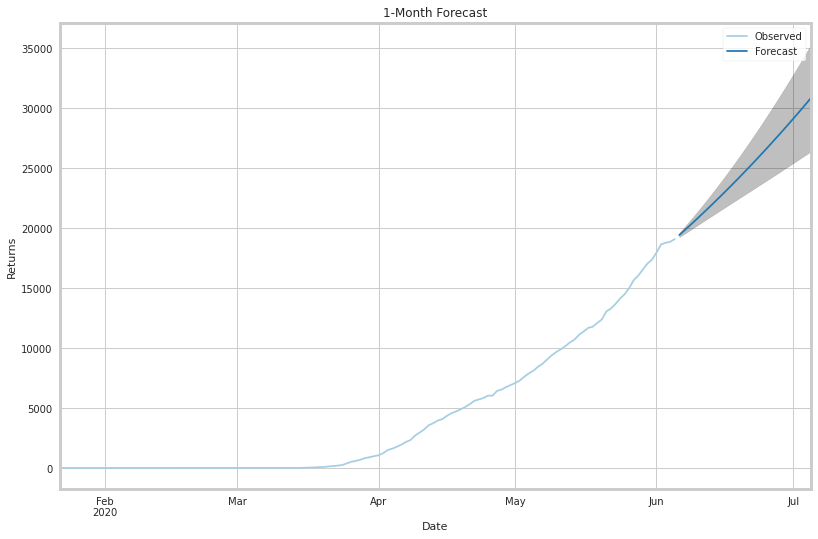

In [ ]:
# Alabama 
get_forecast(AL, 30)

**Alaska**

In [ ]:
AK = dfTS.iloc[:,1]

2020-06-06     529.288385
2020-06-07     544.554914
2020-06-08     558.752031
2020-06-09     574.688192
2020-06-10     590.422637
2020-06-11     606.271642
2020-06-12     622.630279
2020-06-13     639.174976
2020-06-14     655.983852
2020-06-15     673.111361
2020-06-16     690.506352
2020-06-17     708.187197
2020-06-18     726.162583
2020-06-19     744.426226
2020-06-20     762.983581
2020-06-21     781.837617
2020-06-22     800.989278
2020-06-23     820.441447
2020-06-24     840.196462
2020-06-25     860.256407
2020-06-26     880.623678
2020-06-27     901.300561
2020-06-28     922.289316
2020-06-29     943.592250
2020-06-30     965.211650
2020-07-01     987.149802
2020-07-02    1009.408997
2020-07-03    1031.991523
2020-07-04    1054.899671
2020-07-05    1078.135728
Freq: D, dtype: float64


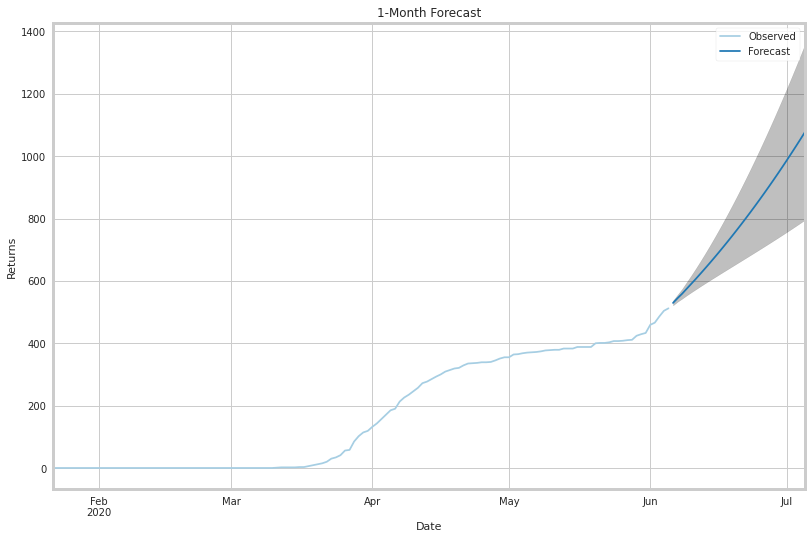

In [ ]:
# Alabama 
get_forecast(AK, 30)

**Arizona**

In [ ]:
AZ = dfTS.iloc[:,2]

2020-06-06    23781.058085
2020-06-07    24892.600777
2020-06-08    25624.374227
2020-06-09    26500.541937
2020-06-10    27622.342673
2020-06-11    28607.682671
2020-06-12    29573.789477
2020-06-13    30611.843840
2020-06-14    31639.940390
2020-06-15    32648.727887
2020-06-16    33722.887408
2020-06-17    34882.239797
2020-06-18    36046.730389
2020-06-19    37219.915337
2020-06-20    38434.696729
2020-06-21    39627.352967
2020-06-22    40898.862599
2020-06-23    42155.346164
2020-06-24    43463.124092
2020-06-25    44834.050164
2020-06-26    46207.168682
2020-06-27    47554.751409
2020-06-28    48895.677130
2020-06-29    50254.126447
2020-06-30    51581.473300
2020-07-01    52967.282039
2020-07-02    54527.121416
2020-07-03    55830.701625
2020-07-04    57174.260915
2020-07-05    58715.173083
Freq: D, dtype: float64


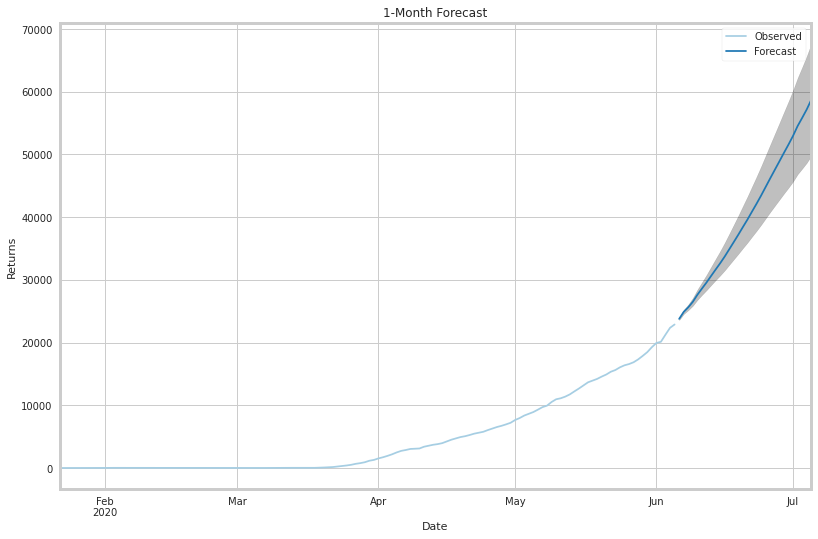

In [ ]:
# Arizona
get_forecast(AZ, 30)

**Arkansas**

2020-06-06     8725.948296
2020-06-07     9054.745914
2020-06-08     9363.594134
2020-06-09     9672.448250
2020-06-10    10070.119653
2020-06-11    10400.838553
2020-06-12    10758.383556
2020-06-13    11110.976831
2020-06-14    11490.595161
2020-06-15    11867.141443
2020-06-16    12253.977025
2020-06-17    12670.667414
2020-06-18    13055.785486
2020-06-19    13449.534479
2020-06-20    13858.362591
2020-06-21    14364.816833
2020-06-22    14795.546206
2020-06-23    15237.091811
2020-06-24    15675.328545
2020-06-25    16118.524465
2020-06-26    16583.087740
2020-06-27    17039.519033
2020-06-28    17556.612791
2020-06-29    18073.220358
2020-06-30    18594.239748
2020-07-01    19126.877950
2020-07-02    19653.216735
2020-07-03    20241.508610
2020-07-04    20800.335996
2020-07-05    21401.186760
Freq: D, dtype: float64


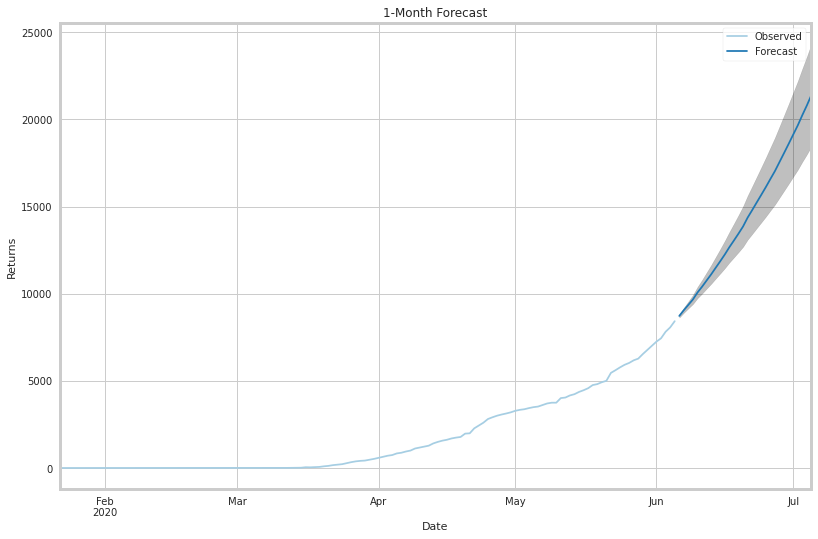

In [ ]:
AR = dfTS.iloc[:,3]
# Arizona
get_forecast(AR, 30)

#### **PROPHET**

**Confirmed**

In [ ]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import datetime
from datetime import date, timedelta
from sklearn.cluster import KMeans
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, add_changepoints_to_plot
import plotly.offline as py
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from keras.models import Sequential
from keras.layers import LSTM,Dense
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

Using TensorFlow backend.


In [ ]:
df = df_core.copy()
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')


In [ ]:
pred_cnfrm = df.loc[:,["Date","Confirmed"]]

In [ ]:
df_l = df[df['Date']<"6/6/2020"]
df_l['Date'] =pd.to_datetime(df_l.Date)
temp = pd.pivot_table(df_l, values=['Confirmed'], index=['Date'], aggfunc=np.sum)
temp = temp.reset_index()
temp = temp.rename(columns={'Date': 'ds', 'Confirmed': 'y'})
#temp

In [ ]:
df_ts.head(2)

,Confirmed
2020-01-22,1
2020-01-23,1


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


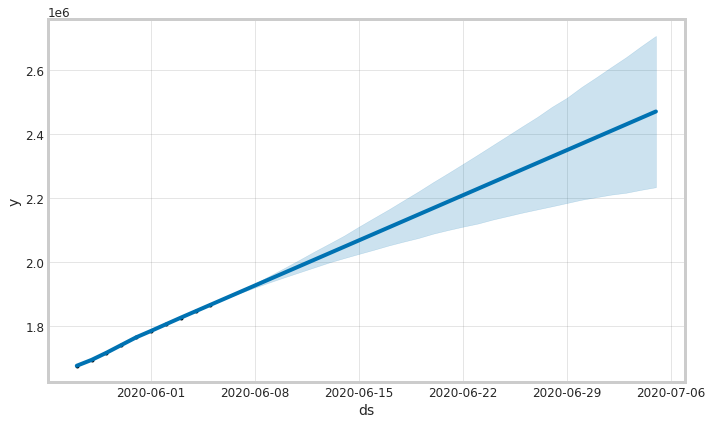

In [ ]:
m = Prophet()
m.fit(pr_data)
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
se = np.square(forecast.loc[:, 'yhat'] - df_ts.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)

In [ ]:
forecast.tail(36).T

,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
ds,2020-05-31 00:00:00,2020-06-01 00:00:00,2020-06-02 00:00:00,2020-06-03 00:00:00,2020-06-04 00:00:00,2020-06-05 00:00:00,2020-06-06 00:00:00,2020-06-07 00:00:00,2020-06-08 00:00:00,2020-06-09 00:00:00,2020-06-10 00:00:00,2020-06-11 00:00:00,2020-06-12 00:00:00,2020-06-13 00:00:00,2020-06-14 00:00:00,2020-06-15 00:00:00,2020-06-16 00:00:00,2020-06-17 00:00:00,2020-06-18 00:00:00,2020-06-19 00:00:00,2020-06-20 00:00:00,2020-06-21 00:00:00,2020-06-22 00:00:00,2020-06-23 00:00:00,2020-06-24 00:00:00,2020-06-25 00:00:00,2020-06-26 00:00:00,2020-06-27 00:00:00,2020-06-28 00:00:00,2020-06-29 00:00:00,2020-06-30 00:00:00,2020-07-01 00:00:00,2020-07-02 00:00:00,2020-07-03 00:00:00,2020-07-04 00:00:00,2020-07-05 00:00:00
trend,1.76603e+06,1.78599e+06,1.80672e+06,1.82729e+06,1.84742e+06,1.86755e+06,1.88768e+06,1.90781e+06,1.92794e+06,1.94807e+06,1.9682e+06,1.98833e+06,2.00846e+06,2.02859e+06,2.04872e+06,2.06885e+06,2.08898e+06,2.10911e+06,2.12924e+06,2.14937e+06,2.1695e+06,2.18963e+06,2.20976e+06,2.22989e+06,2.25002e+06,2.27015e+06,2.29028e+06,2.31041e+06,2.33054e+06,2.35067e+06,2.3708e+06,2.39093e+06,2.41106e+06,2.43119e+06,2.45132e+06,2.47145e+06
yhat_lower,1.76586e+06,1.78582e+06,1.80657e+06,1.82711e+06,1.84725e+06,1.86739e+06,1.88675e+06,1.90442e+06,1.92115e+06,1.93632e+06,1.95088e+06,1.96574e+06,1.98059e+06,1.9955e+06,2.0098e+06,2.02272e+06,2.03599e+06,2.05073e+06,2.06357e+06,2.07552e+06,2.08727e+06,2.09919e+06,2.10962e+06,2.12076e+06,2.13227e+06,2.14383e+06,2.15383e+06,2.16319e+06,2.17215e+06,2.18144e+06,2.19121e+06,2.20301e+06,2.21099e+06,2.21709e+06,2.22761e+06,2.23715e+06
yhat_upper,1.7662e+06,1.78616e+06,1.80689e+06,1.82746e+06,1.8476e+06,1.86772e+06,1.88861e+06,1.91089e+06,1.93441e+06,1.9588e+06,1.98415e+06,2.00932e+06,2.03503e+06,2.0603e+06,2.08718e+06,2.11441e+06,2.14169e+06,2.16917e+06,2.19789e+06,2.22532e+06,2.25309e+06,2.28087e+06,2.31019e+06,2.33964e+06,2.37046e+06,2.40143e+06,2.43104e+06,2.46128e+06,2.49275e+06,2.52331e+06,2.55202e+06,2.58629e+06,2.61636e+06,2.64704e+06,2.67952e+06,2.71007e+06
trend_lower,1.76603e+06,1.78599e+06,1.80672e+06,1.82729e+06,1.84742e+06,1.86755e+06,1.88677e+06,1.9044e+06,1.92112e+06,1.93624e+06,1.95091e+06,1.96571e+06,1.98051e+06,1.99537e+06,2.00984e+06,2.02297e+06,2.03594e+06,2.05072e+06,2.06373e+06,2.07556e+06,2.08735e+06,2.09917e+06,2.10965e+06,2.12065e+06,2.13216e+06,2.14395e+06,2.15393e+06,2.16326e+06,2.17219e+06,2.18132e+06,2.1913e+06,2.20283e+06,2.2108e+06,2.21715e+06,2.2274e+06,2.23725e+06
trend_upper,1.76603e+06,1.78599e+06,1.80672e+06,1.82729e+06,1.84742e+06,1.86755e+06,1.88855e+06,1.91093e+06,1.93436e+06,1.95886e+06,1.98413e+06,2.00925e+06,2.03503e+06,2.0604e+06,2.08712e+06,2.11438e+06,2.14174e+06,2.16907e+06,2.19786e+06,2.22537e+06,2.25328e+06,2.28082e+06,2.31024e+06,2.33941e+06,2.37058e+06,2.40144e+06,2.43111e+06,2.46133e+06,2.49267e+06,2.52337e+06,2.55197e+06,2.58615e+06,2.61656e+06,2.64703e+06,2.67952e+06,2.71028e+06
additive_terms,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
additive_terms_lower,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
additive_terms_upper,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
multiplicative_terms,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
m=Prophet()
m.fit(pr_data)
future=m.make_future_dataframe(periods=30) # next month 
forecast=m.predict(future)
forecast

In [ ]:
cnfrm = forecast.loc[:,['ds','trend']]
cnfrm = cnfrm[cnfrm['trend']>0]
cnfrm.columns = ['Date','Confirm']
cnfrm.head(10)

,Date,Confirm
0,2020-05-27,1.677204e+06
1,2020-05-28,1.695536e+06
2,2020-05-29,1.717856e+06
3,2020-05-30,1.741954e+06
4,2020-05-31,1.766029e+06
5,2020-06-01,1.785988e+06
6,2020-06-02,1.806725e+06
7,2020-06-03,1.827291e+06
8,2020-06-04,1.847421e+06
9,2020-06-05,1.867551e+06


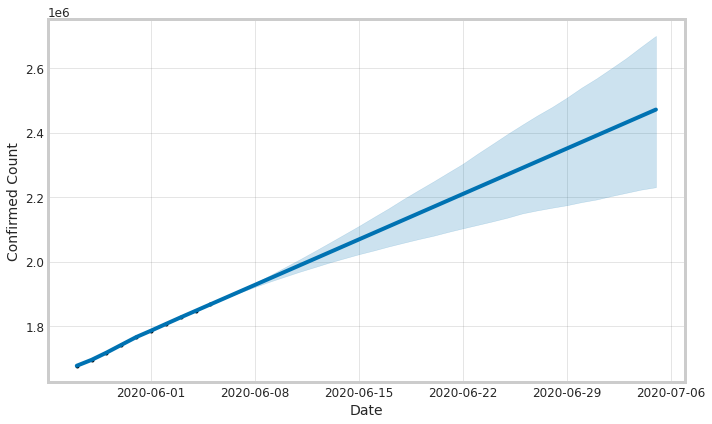

In [ ]:
import plotly.offline as py
import plotly.express as px
from fbprophet.plot import plot_plotly
fig = plot_plotly(m, forecast)
py.iplot(fig) 

fig = m.plot(forecast,xlabel='Date',ylabel='Confirmed Count')

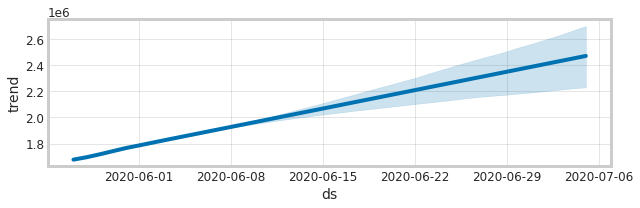

In [ ]:
# Python
fig2 = m.plot_components(forecast)

**ARIMA**

In [ ]:
df

,State_abb,State,Date,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,WA,Washington,2020-01-22,46.703529,-119.359134,1,0,0,0,0.000000,0,0,0.000000,0.000000,0.000000
1,WA,Washington,2020-01-23,46.703529,-119.359134,1,0,0,0,0.000000,0,0,0.000000,0.000000,0.000000
2,WA,Washington,2020-01-24,46.703529,-119.359134,1,0,0,0,0.000000,0,0,0.000000,0.000000,0.000000
3,IL,Illinois,2020-01-25,39.794874,-88.659056,1,0,0,0,0.000000,0,0,0.000000,0.000000,0.000000
4,WA,Washington,2020-01-25,46.703529,-119.359134,1,0,0,0,0.000000,0,0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4951,VT,Vermont,2020-06-06,42.871718,-70.666712,1027,55,882,90,164.586235,39117,0,5.355404,6268.860509,0.000000
4952,WA,Washington,2020-06-06,46.703529,-119.359134,22993,1149,0,21844,301.947775,383587,3615,4.997173,5037.326197,15.722176
4953,WI,Wisconsin,2020-06-06,44.119213,-89.354966,20249,633,13337,6279,347.775518,323581,2791,3.126080,5557.486783,13.783397
4954,WV,West Virginia,2020-06-06,38.855977,-80.589955,2119,84,1445,590,118.238069,108518,0,3.964134,6055.195249,0.000000


In [ ]:
pred_cnfrm = df_core.loc[:,["Date","Confirmed"]]
pred_cnfrm

,Date,Confirmed
0,1/22/2020,1
1,1/23/2020,1
2,1/24/2020,1
3,1/25/2020,1
4,1/25/2020,1
...,...,...
4951,6/6/2020,1027
4952,6/6/2020,22993
4953,6/6/2020,20249
4954,6/6/2020,2119


In [ ]:
confirm_cs = pred_cnfrm.cumsum()
confirm_cs['date1'] = pred_cnfrm['Date']
confirm_cs = confirm_cs.drop('Date',axis=1)
arima_data = confirm_cs
arima_data.columns = ['count','confirmed_date']
arima_data.head()

,count,confirmed_date
0,1,1/22/2020
1,2,1/23/2020
2,3,1/24/2020
3,4,1/25/2020
4,5,1/25/2020


In [ ]:
model = ARIMA(arima_data['count'].values, order=(10, 1, 0))
fit_model = model.fit(trend='c', full_output=True, disp=True)
fit_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                 4955
Model:                ARIMA(10, 1, 0)   Log Likelihood              -59132.027
Method:                       css-mle   S.D. of innovations          36857.108
Date:                Mon, 08 Jun 2020   AIC                         118288.055
Time:                        08:22:04   BIC                         118366.152
Sample:                             1   HQIC                        118315.439
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        1.53e+04    977.255     15.651      0.000    1.34e+04    1.72e+04
ar.L1.D.y      0.0037      0.014      0.258      0.797      -0.024       0.031
ar.L2.D.y     -0.0232      0.014     -1.654      0.098      -0.051       0.004
ar.L3.D.y      0.3236      0.014     23.099      0.000       0.296       0.351
ar.L4.D.y      0.1436      0.015      9.755      0.000       0.115       0.172
ar.L5.D.y      0.0594      0.015      4.044      0.000       0.031       0.088
ar.L6.D.y     -0.1549      0.015    -10.536      0.000      -0.184      -0.126
ar.L7.D.y     -0.0547      0.015     -3.716      0.000      -0.084      -0.026
ar.L8.D.y     -0.0389      0.014     -2.780      0.005      -0.066      -0.011
ar.L9.D.y      0.1513      0.014     10.793      0.000       0.124       0.179
ar.L10.D.y     0.0547      0.014      3.860      0.000       0.027       0.083
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.1563           -0.0000j            1.1563           -0.0000
AR.2             1.0620           -0.6499j            1.2450           -0.0874
AR.3             1.0620           +0.6499j            1.2450            0.0874
AR.4             0.1429           -1.1674j            1.1761           -0.2306
AR.5             0.1429           +1.1674j            1.1761            0.2306
AR.6            -0.5342           -1.1150j            1.2364           -0.3211
AR.7            -0.5342           +1.1150j            1.2364            0.3211
AR.8            -1.1277           -0.5762j            1.2664           -0.4248
AR.9            -1.1277           +0.5762j            1.2664            0.4248
AR.10           -3.0059           -0.0000j            3.0059           -0.5000
------------------------------------------------------------------------------
"""

In [ ]:
forcast = fit_model.forecast(steps=7)
pred_y = forcast[0].tolist()
pred = pd.DataFrame(pred_y)
pred['pred']=  pred - pred.shift(1) 
pred

,0,pred
0,7.579858e+07,NaN
1,7.582087e+07,22294.917558
2,7.583086e+07,9983.595565
3,7.584600e+07,15138.761088
4,7.586338e+07,17382.359743
5,7.588087e+07,17489.501983
6,7.589882e+07,17949.770481


In [ ]:
dataset_c = pd.DataFrame(pred_cnfrm['Confirmed'])

In [ ]:
data = np.array(dataset_c).reshape(-1, 1)
train_data = dataset_c[:len(dataset_c)-8]
test_data = dataset_c[len(dataset_c)-8:]

**LSTM**

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM,Dense
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [ ]:
scaler = MinMaxScaler()
scaler.fit(train_data)
scaled_train_data = scaler.transform(train_data)
scaled_test_data = scaler.transform(test_data)
n_input =5
n_features =1
                             
generator = TimeseriesGenerator(scaled_train_data,scaled_train_data, length=n_input, batch_size=1)

lstm_model = Sequential()
lstm_model.add(LSTM(units = 50, return_sequences = True, input_shape = (n_input, n_features)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(units = 50, return_sequences = True))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(units = 50))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(units = 1))
lstm_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
lstm_model.fit(generator, epochs = 8)

Epoch 1/8
4943/4943 [==============================] - 41s 8ms/step - loss: 0.0108
Epoch 2/8
4943/4943 [==============================] - 40s 8ms/step - loss: 0.0100
Epoch 3/8
4943/4943 [==============================] - 40s 8ms/step - loss: 0.0074
Epoch 4/8
4943/4943 [==============================] - 40s 8ms/step - loss: 0.0072
Epoch 5/8
4943/4943 [==============================] - 42s 8ms/step - loss: 0.0080
Epoch 6/8
4943/4943 [==============================] - 40s 8ms/step - loss: 0.0079
Epoch 7/8
4943/4943 [==============================] - 39s 8ms/step - loss: 0.0076
Epoch 8/8
4943/4943 [==============================] - 39s 8ms/step - loss: 0.0069


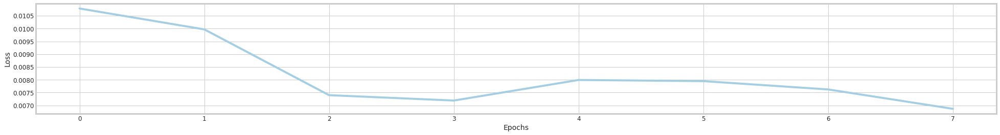

In [ ]:
losses_lstm = lstm_model.history.history['loss']
plt.figure(figsize = (30,4))
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xticks(np.arange(0,100,1))
plt.plot(range(len(losses_lstm)), losses_lstm)

In [ ]:
lstm_predictions_scaled = []

batch = scaled_train_data[-n_input:]
current_batch = batch.reshape((1, n_input, n_features))

for i in range(len(test_data)):   
    lstm_pred = lstm_model.predict(current_batch)[0]
    lstm_predictions_scaled.append(lstm_pred) 
    current_batch = np.append(current_batch[:,1:,:],[[lstm_pred]],axis=1)

prediction = pd.DataFrame(scaler.inverse_transform(lstm_predictions_scaled))
prediction

,0
0,56410.213618
1,13731.652062
2,10719.767618
3,15702.455319
4,25534.290317
5,36618.333061
6,11484.574261
7,10635.792097


**Deaths**

In [ ]:
temp = pd.pivot_table(df_l, values=['Deaths'], index=['Date'], aggfunc=np.sum)
temp = temp.reset_index()
temp = temp.rename(columns={'Date': 'ds', 'Deaths': 'y'})
#temp

In [ ]:
pr_data_r =temp.tail(10)
pr_data_r

,ds,y
126,2020-05-27,98768
127,2020-05-28,100273
128,2020-05-29,101469
129,2020-05-30,102661
130,2020-05-31,103627
131,2020-06-01,104229
132,2020-06-02,104997
133,2020-06-03,106026
134,2020-06-04,107005
135,2020-06-05,108041


In [ ]:
m=Prophet()
m.fit(pr_data_r)
future_r=m.make_future_dataframe(periods=30)
forecast_r=m.predict(future)
forecast_r

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-05-27,98768.090259,98758.905223,98777.615225,98768.090259,98768.090259,0.0,0.0,0.0,0.0,0.0,0.0,98768.090259
1,2020-05-28,100272.909761,100263.631815,100282.048171,100272.909761,100272.909761,0.0,0.0,0.0,0.0,0.0,0.0,100272.909761
2,2020-05-29,101469.000657,101459.392788,101478.118534,101469.000657,101469.000657,0.0,0.0,0.0,0.0,0.0,0.0,101469.000657
3,2020-05-30,102660.999157,102651.319867,102669.807156,102660.999157,102660.999157,0.0,0.0,0.0,0.0,0.0,0.0,102660.999157
4,2020-05-31,103626.819466,103616.830567,103635.889561,103626.819466,103626.819466,0.0,0.0,0.0,0.0,0.0,0.0,103626.819466
5,2020-06-01,104229.180180,104219.196582,104238.475645,104229.180180,104229.180180,0.0,0.0,0.0,0.0,0.0,0.0,104229.180180
6,2020-06-02,104997.180559,104988.395795,105006.443303,104997.180559,104997.180559,0.0,0.0,0.0,0.0,0.0,0.0,104997.180559
7,2020-06-03,106016.304501,106007.038063,106025.956856,106016.304501,106016.304501,0.0,0.0,0.0,0.0,0.0,0.0,106016.304501
8,2020-06-04,107023.939894,107014.584131,107033.186508,107023.939894,107023.939894,0.0,0.0,0.0,0.0,0.0,0.0,107023.939894
9,2020-06-05,108031.575287,108023.131405,108041.823537,108031.575287,108031.575287,0.0,0.0,0.0,0.0,0.0,0.0,108031.575287


In [ ]:
rec = forecast_r.loc[:,['ds','trend']]
rec = rec[rec['trend']>0]
rec.columns = ['Date','Recovered']
rec.head(10)

,Date,Recovered
0,2020-05-27,98768.090259
1,2020-05-28,100272.909761
2,2020-05-29,101469.000657
3,2020-05-30,102660.999157
4,2020-05-31,103626.819466
5,2020-06-01,104229.180180
6,2020-06-02,104997.180559
7,2020-06-03,106016.304501
8,2020-06-04,107023.939894
9,2020-06-05,108031.575287


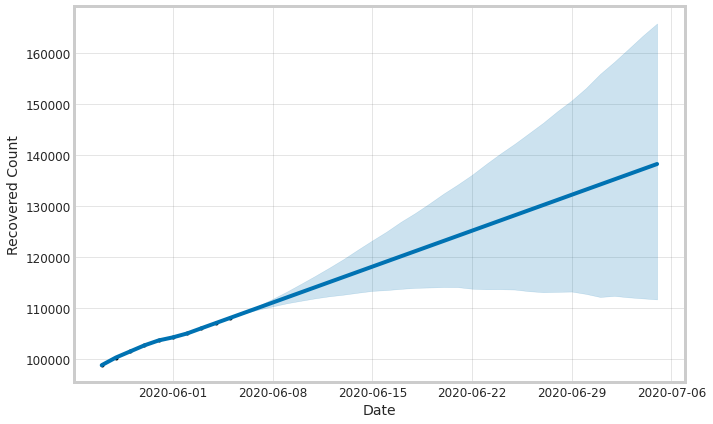

In [ ]:
fig_r = plot_plotly(m, forecast_r)
py.iplot(fig_r) 

fig_r = m.plot(forecast_r,xlabel='Date',ylabel='Recovered Count')



---



ARIMA

In [ ]:
df_ts.head(10)
df = df_ts.copy()
df.head(2)

,Confirmed
2020-01-22,1
2020-01-23,1


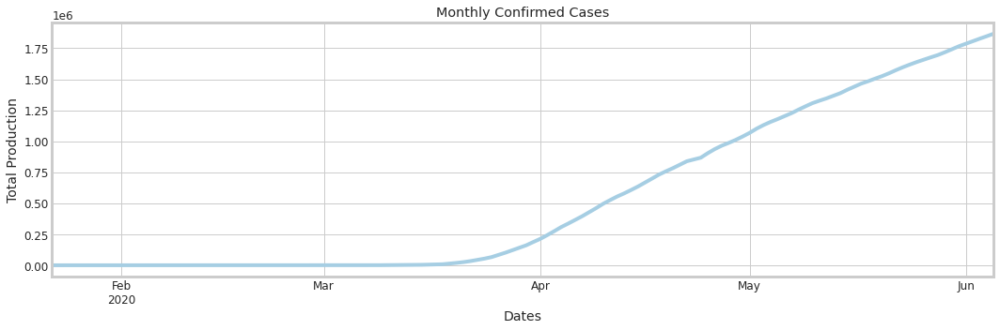

In [ ]:
#df.index.freq = 'MS'
ax = df['Confirmed'].plot(figsize = (16,5), title = "Monthly Confirmed Cases")
ax.set(xlabel='Dates', ylabel='Total Production');

There is no seasonality in the data. 

In [ ]:
auto_arima(df['Confirmed'], seasonal=False, m=12,max_p=7, max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  136
Model:               SARIMAX(2, 2, 2)   Log Likelihood               -1253.781
Date:                Wed, 10 Jun 2020   AIC                           2519.563
Time:                        19:54:10   BIC                           2536.950
Sample:                             0   HQIC                          2526.629
                                - 136                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     77.6949    137.655      0.564      0.572    -192.105     347.495
ar.L1          1.1533      0.120      9.623      0.000       0.918       1.388
ar.L2         -0.7642      0.088     -8.640      0.000      -0.938      -0.591
ma.L1         -1.4081      0.132    -10.655      0.000      -1.667      -1.149
ma.L2          0.7836      0.119      6.568      0.000       0.550       1.017
sigma2      8.679e+06      0.003   2.73e+09      0.000    8.68e+06    8.68e+06
===================================================================================
Ljung-Box (Q):                       31.01   Jarque-Bera (JB):              1642.65
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):             408.70   Skew:                             0.68
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.56e+25. Standard errors may be unstable.
"""

In [ ]:
len(df)

136

In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf 
from statsmodels.tsa.seasonal import seasonal_decompose 
from pmdarima import auto_arima                        
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
import warnings
warnings.filterwarnings("ignore")
train_data = df[:len(df)-12]
test_data = df[len(df)-12:]
arima_model = SARIMAX(train_data['Confirmed'], order = (2,2,2))
arima_result = arima_model.fit()
arima_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Confirmed   No. Observations:                  124
Model:               SARIMAX(2, 2, 2)   Log Likelihood               -1146.034
Date:                Wed, 10 Jun 2020   AIC                           2302.068
Time:                        19:54:21   BIC                           2316.088
Sample:                    01-22-2020   HQIC                          2307.762
                         - 05-24-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1192      0.146      7.677      0.000       0.833       1.405
ar.L2         -0.7497      0.099     -7.573      0.000      -0.944      -0.556
ma.L1         -1.3775      0.157     -8.751      0.000      -1.686      -1.069
ma.L2          0.7649      0.133      5.752      0.000       0.504       1.025
sigma2      9.785e+06   1.59e-08   6.14e+14      0.000    9.79e+06    9.79e+06
===================================================================================
Ljung-Box (Q):                       28.29   Jarque-Bera (JB):              1455.23
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):           25380.68   Skew:                             0.72
Prob(H) (two-sided):                  0.00   Kurtosis:                        19.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.52e+30. Standard errors may be unstable.
"""

In [ ]:
arima_pred = arima_result.predict(start = len(train_data), end = len(df)-1, typ="levels").rename("ARIMA Predictions")
arima_pred

2020-05-25    1.639835e+06
2020-05-26    1.660670e+06
2020-05-27    1.682278e+06
2020-05-28    1.704672e+06
2020-05-29    1.727367e+06
2020-05-30    1.749808e+06
2020-05-31    1.771740e+06
2020-06-01    1.793294e+06
2020-06-02    1.814804e+06
2020-06-03    1.836550e+06
2020-06-04    1.858592e+06
2020-06-05    1.880789e+06
Freq: D, Name: ARIMA Predictions, dtype: float64

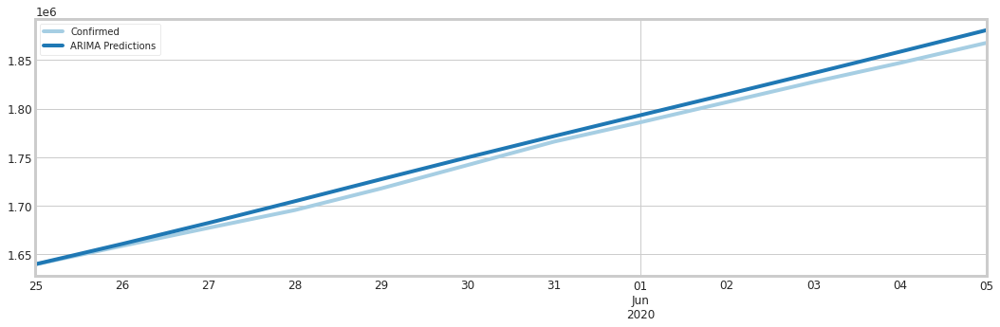

In [ ]:
test_data['Confirmed'].plot(figsize = (16,5), legend=True)
arima_pred.plot(legend = True);

In [ ]:
from statsmodels.tools.eval_measures import rmse
arima_rmse_error = rmse(test_data['Confirmed'], arima_pred)
arima_mse_error = arima_rmse_error**2
mean_value = df['Confirmed'].mean()

print(f'MSE Error: {arima_mse_error}\nRMSE Error: {arima_rmse_error}\nMean: {mean_value}')

MSE Error: 66891739.79804941
RMSE Error: 8178.737053974129
Mean: 543345.4044117647


In [ ]:
test_data['ARIMA_Predictions'] = arima_pred

LSTM Forecast

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(train_data)
scaled_train_data = scaler.transform(train_data)
scaled_test_data = scaler.transform(test_data)

In [ ]:
## Create a time series generator object
from keras.preprocessing.sequence import TimeseriesGenerator

n_input = 12
n_features= 1
generator = TimeseriesGenerator(scaled_train_data, scaled_train_data, length=n_input, batch_size=1)
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

lstm_model = Sequential()
lstm_model.add(LSTM(200, activation='relu', input_shape=(n_input, n_features)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')

lstm_model.summary()


Using TensorFlow backend.


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 200)               161600    
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 201       
Total params: 161,801
Trainable params: 161,801
Non-trainable params: 0
_________________________________________________________________


In [ ]:
lstm_model.fit_generator(generator,epochs=20)

Epoch 1/20
112/112 [==============================] - 2s 17ms/step - loss: 0.0275
Epoch 2/20
112/112 [==============================] - 1s 12ms/step - loss: 0.0013
Epoch 3/20
112/112 [==============================] - 1s 12ms/step - loss: 6.5118e-04
Epoch 4/20
112/112 [==============================] - 1s 12ms/step - loss: 7.2509e-04
Epoch 5/20
112/112 [==============================] - 1s 12ms/step - loss: 4.8485e-04
Epoch 6/20
112/112 [==============================] - 1s 12ms/step - loss: 2.4859e-04
Epoch 7/20
112/112 [==============================] - 1s 12ms/step - loss: 3.7069e-04
Epoch 8/20
112/112 [==============================] - 1s 13ms/step - loss: 1.2066e-04
Epoch 9/20
112/112 [==============================] - 1s 13ms/step - loss: 1.1789e-04
Epoch 10/20
112/112 [==============================] - 1s 13ms/step - loss: 7.4566e-05
Epoch 11/20
112/112 [==============================] - 1s 13ms/step - loss: 2.2041e-04
Epoch 12/20
112/112 [==============================] - 1s 13

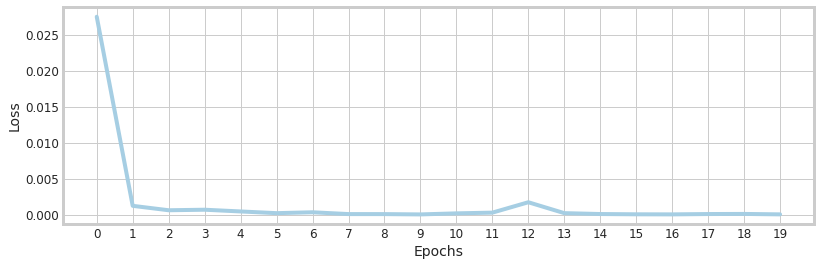

In [ ]:
losses_lstm = lstm_model.history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,21,1))
plt.plot(range(len(losses_lstm)),losses_lstm);

In [ ]:
lstm_predictions_scaled = list()

batch = scaled_train_data[-n_input:]
current_batch = batch.reshape((1, n_input, n_features))

for i in range(len(test_data)):   
    lstm_pred = lstm_model.predict(current_batch)[0]
    lstm_predictions_scaled.append(lstm_pred) 
    current_batch = np.append(current_batch[:,1:,:],[[lstm_pred]],axis=1)

In [ ]:
lstm_predictions_scaled

[array([1.0110468], dtype=float32),
 array([1.0241735], dtype=float32),
 array([1.0372531], dtype=float32),
 array([1.0501217], dtype=float32),
 array([1.062846], dtype=float32),
 array([1.0754063], dtype=float32),
 array([1.0879599], dtype=float32),
 array([1.1004493], dtype=float32),
 array([1.1128969], dtype=float32),
 array([1.1252165], dtype=float32),
 array([1.1373509], dtype=float32),
 array([1.1493416], dtype=float32)]

In [ ]:
# inverse to see the predictions
lstm_predictions = scaler.inverse_transform(lstm_predictions_scaled)
lstm_predictions

array([[1636990.86501694],
       [1658244.40755463],
       [1679421.71025848],
       [1700257.18828964],
       [1720859.12151337],
       [1741195.66291046],
       [1761521.20261002],
       [1781742.90172577],
       [1801896.85354614],
       [1821843.51022339],
       [1841490.41889572],
       [1860904.55480957]])

In [ ]:
test_data['LSTM_Predictions'] = lstm_predictions
test_data

,Confirmed,ARIMA_Predictions,LSTM_Predictions
2020-05-25,1639649,1.639835e+06,1.636991e+06
2020-05-26,1658634,1.660670e+06,1.658244e+06
2020-05-27,1677206,1.682278e+06,1.679422e+06
2020-05-28,1695534,1.704672e+06,1.700257e+06
2020-05-29,1717853,1.727367e+06,1.720859e+06
2020-05-30,1741957,1.749808e+06,1.741196e+06
2020-05-31,1766032,1.771740e+06,1.761521e+06
2020-06-01,1785981,1.793294e+06,1.781743e+06
2020-06-02,1806728,1.814804e+06,1.801897e+06
2020-06-03,1827466,1.836550e+06,1.821844e+06


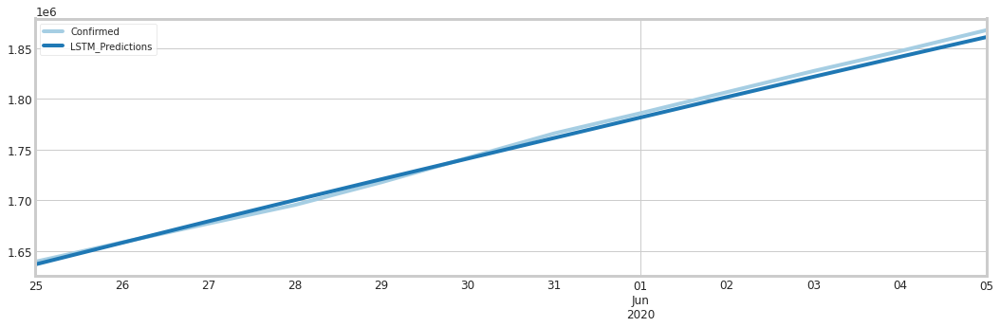

In [ ]:
test_data['Confirmed'].plot(figsize = (16,5), legend=True)
test_data['LSTM_Predictions'].plot(legend = True)
#test_data['ARIMA_Predictions'].plot(legent = True)

In [ ]:
from statsmodels.tools.eval_measures import rmse
lstm_rmse_error = rmse(test_data['Confirmed'], test_data["LSTM_Predictions"])
lstm_mse_error = lstm_rmse_error**2
mean_value = df['Confirmed'].mean()

print(f'MSE Error: {lstm_mse_error}\nRMSE Error: {lstm_rmse_error}\nMean: {mean_value}')

MSE Error: 17916174.351937406
RMSE Error: 4232.7502113799965
Mean: 543345.4044117647


Prophet

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 136 entries, 2020-01-22 to 2020-06-05
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Confirmed  136 non-null    int64
dtypes: int64(1)
memory usage: 2.1 KB


In [ ]:
df_pr = df.copy()
df_pr = df.reset_index()
df_pr.columns = ['ds','y'] # To use prophet column names should be like that
train_data_pr = df_pr.iloc[:len(df)-30]
test_data_pr = df_pr.iloc[len(df)-30:]
from fbprophet import Prophet
m = Prophet()
m.fit(train_data_pr)
future = m.make_future_dataframe(periods=30)
prophet_pred = m.predict(future)
prophet_pred.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
131,2020-06-01,1.902853e+06,1.812589e+06,1.994339e+06,1.813282e+06,1.993298e+06,208.085856,208.085856,208.085856,208.085856,208.085856,208.085856,0.0,0.0,0.0,1.903061e+06
132,2020-06-02,1.929700e+06,1.832821e+06,2.023604e+06,1.834081e+06,2.025117e+06,-594.382658,-594.382658,-594.382658,-594.382658,-594.382658,-594.382658,0.0,0.0,0.0,1.929105e+06
133,2020-06-03,1.956547e+06,1.854754e+06,2.056387e+06,1.855661e+06,2.057745e+06,-483.819919,-483.819919,-483.819919,-483.819919,-483.819919,-483.819919,0.0,0.0,0.0,1.956063e+06
134,2020-06-04,1.983394e+06,1.874415e+06,2.087896e+06,1.876121e+06,2.089866e+06,-738.411513,-738.411513,-738.411513,-738.411513,-738.411513,-738.411513,0.0,0.0,0.0,1.982655e+06
135,2020-06-05,2.010241e+06,1.896694e+06,2.119722e+06,1.896987e+06,2.121216e+06,-686.236958,-686.236958,-686.236958,-686.236958,-686.236958,-686.236958,0.0,0.0,0.0,2.009554e+06


In [ ]:
prophet_pred = pd.DataFrame({"Date" : prophet_pred[-12:]['ds'], "Pred" : prophet_pred[-12:]["yhat"]})

In [ ]:
prophet_pred = prophet_pred.set_index("Date")

In [ ]:
prophet_pred

,Pred
Date,
2020-05-25,1.715132e+06
2020-05-26,1.741177e+06
2020-05-27,1.768134e+06
2020-05-28,1.794727e+06
2020-05-29,1.821626e+06
2020-05-30,1.850253e+06
2020-05-31,1.877207e+06
2020-06-01,1.903061e+06
2020-06-02,1.929105e+06


In [ ]:
test_data["Prophet_Predictions"] = prophet_pred['Pred'].values

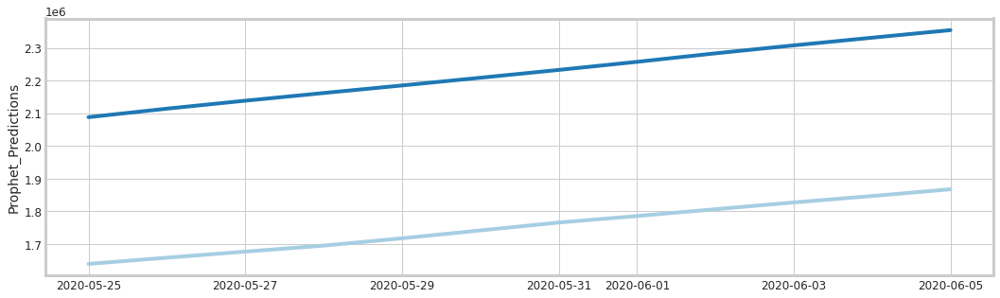

In [ ]:
plt.figure(figsize=(16,5))
ax = sns.lineplot(x= test_data.index, y=test_data["Confirmed"])
sns.lineplot(x=test_data.index, y = test_data["Prophet_Predictions"]);

In [ ]:
prophet_rmse_error = rmse(test_data['Confirmed'], test_data["Prophet_Predictions"])
prophet_mse_error = prophet_rmse_error**2
mean_value = df['Confirmed'].mean()

print(f'MSE Error: {prophet_mse_error}\nRMSE Error: {prophet_rmse_error}\nMean: {mean_value}')

MSE Error: 220195742458.85776
RMSE Error: 469250.19175154075
Mean: 543345.4044117647


In [ ]:
rmse_errors = [arima_rmse_error, lstm_rmse_error, prophet_rmse_error]
mse_errors = [arima_mse_error, lstm_mse_error, prophet_mse_error]
errors = pd.DataFrame({"Models" : ["ARIMA", "LSTM", "Prophet"],"RMSE Errors" : rmse_errors, "MSE Errors" : mse_errors})

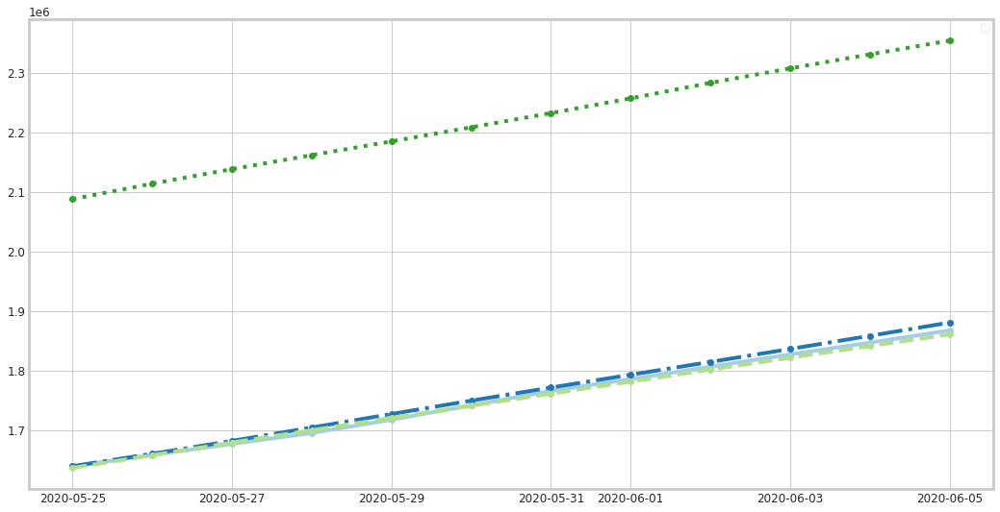

In [ ]:
plt.figure(figsize=(16,9))
plt.plot_date(test_data.index, test_data["Confirmed"], linestyle="-")
plt.plot_date(test_data.index, test_data["ARIMA_Predictions"], linestyle="-.")
plt.plot_date(test_data.index, test_data["LSTM_Predictions"], linestyle="--")
plt.plot_date(test_data.index, test_data["Prophet_Predictions"], linestyle=":")
plt.legend()
plt.show()

In [ ]:
print(f"Mean: {test_data['Confirmed'].mean()}")
errors

Mean: 1752653.1666666667


,Models,RMSE Errors,MSE Errors
0,ARIMA,8178.737054,6.689174e+07
1,LSTM,4232.750211,1.791617e+07
2,Prophet,469250.191752,2.201957e+11


In [ ]:
test_data

,Confirmed,ARIMA_Predictions,LSTM_Predictions,Prophet_Predictions
2020-05-25,1639649,1.639835e+06,1.636991e+06,2.088086e+06
2020-05-26,1658634,1.660670e+06,1.658244e+06,2.114059e+06
2020-05-27,1677206,1.682278e+06,1.679422e+06,2.138395e+06
2020-05-28,1695534,1.704672e+06,1.700257e+06,2.161882e+06
2020-05-29,1717853,1.727367e+06,1.720859e+06,2.184957e+06
2020-05-30,1741957,1.749808e+06,1.741196e+06,2.208568e+06
2020-05-31,1766032,1.771740e+06,1.761521e+06,2.232456e+06
2020-06-01,1785981,1.793294e+06,1.781743e+06,2.257200e+06
2020-06-02,1806728,1.814804e+06,1.801897e+06,2.283173e+06
2020-06-03,1827466,1.836550e+06,1.821844e+06,2.307509e+06




---



s**time series univariate LSTM**

In [ ]:
# https://github.com/ashukrishna100/COVID19-time-series/blob/master/time%20series%20univariate%20LSTM%20confirmed%20Iran.ipynb

In [ ]:
dfTS.to_csv('/content/sample_data/state.csv')

In [ ]:
df_new = df_ts[["Confirmed"]]
df_new.tail(10)

,Confirmed
2020-05-27,1677206
2020-05-28,1695534
2020-05-29,1717853
2020-05-30,1741957
2020-05-31,1766032
2020-06-01,1785981
2020-06-02,1806728
2020-06-03,1827466
2020-06-04,1847074
2020-06-05,1867724


In [ ]:
len(df_new)

136

In [ ]:
# I want to predict 10 days afterwards
x = len(df_new)-5
x

131

In [ ]:
train=df_new.iloc[:x]
test = df_new.iloc[x:]
train

In [ ]:
##scale or normalize data as the data is too skewed
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [ ]:
scaler.fit(train) #find max value

MinMaxScaler(copy=True, feature_range=(0, 1))

In [ ]:
scaled_train = scaler.transform(train)#and divide every point by max value
scaled_test = scaler.transform(test)
print(scaled_train[-5:])

[[0.94970303]
 [0.96008111]
 [0.97271905]
 [0.98636774]
 [1.        ]]


In [ ]:
## feed in batches [t1,t2,t3] --> t4
from keras.preprocessing.sequence import TimeseriesGenerator

In [ ]:
scaled_train.shape

(131, 1)

In [ ]:
## how to decide num of inputs , 
n_input = 5  ## number of steps
n_features = 1 ## number of features you want to predict (for univariate time series n_features=1)
generator = TimeseriesGenerator(scaled_train,scaled_train,length = n_input,batch_size=1)

In [ ]:
len(scaled_train)

131

In [ ]:
len(generator)

126

In [ ]:
x,y = generator[50]

In [ ]:
(x,y)

(array([[[0.00117495],
         [0.00149431],
         [0.00185444],
         [0.00212057],
         [0.00274627]]]), array([[0.00380514]]))

In [ ]:
y

array([[0.00380514]])

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Activation

In [ ]:
model = Sequential()
model.add(LSTM(150,activation="relu",input_shape=(n_input,n_features)))
#model.add(Dropout(0.2))
model.add(Dense(75, activation='relu'))
model.add(Dense(units=1))
#model.add(Activation('softmax'))
#model.add(Dense(1))
model.compile(optimizer="adam",loss="mse")

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 150)               91200     
_________________________________________________________________
dense_6 (Dense)              (None, 75)                11325     
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 76        
Total params: 102,601
Trainable params: 102,601
Non-trainable params: 0
_________________________________________________________________


In [ ]:
validation_set = np.append(scaled_train[55],scaled_test)
validation_set=validation_set.reshape(6,1)
validation_set

array([[0.00380514],
       [1.01129595],
       [1.02304376],
       [1.03478648],
       [1.04588934],
       [1.05758223]])

In [ ]:
## how to decide num of inputs , 
n_input = 5
n_features = 1
validation_gen = TimeseriesGenerator(validation_set,validation_set,length=5,batch_size=1)

In [ ]:
validation_gen[0][0].shape,validation_gen[0][1].shape

((1, 5, 1), (1, 1))

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',patience=20,restore_best_weights=True)

In [ ]:
model.fit_generator(generator,validation_data=validation_gen,epochs=100,callbacks=[early_stop],steps_per_epoch=10)

Epoch 1/100
10/10 [==============================] - 0s 37ms/step - loss: 0.1177 - val_loss: 0.9114
Epoch 2/100
10/10 [==============================] - 0s 5ms/step - loss: 0.1308 - val_loss: 0.6942
Epoch 3/100
10/10 [==============================] - 0s 9ms/step - loss: 0.1024 - val_loss: 0.4387
Epoch 4/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0355 - val_loss: 0.1766
Epoch 5/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0106 - val_loss: 0.0391
Epoch 6/100
10/10 [==============================] - 0s 10ms/step - loss: 2.5746e-04 - val_loss: 0.0492
Epoch 7/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0014 - val_loss: 0.0281
Epoch 8/100
10/10 [==============================] - 0s 10ms/step - loss: 6.7087e-04 - val_loss: 0.0553
Epoch 9/100
10/10 [==============================] - 0s 10ms/step - loss: 5.2011e-04 - val_loss: 0.0290
Epoch 10/100
10/10 [==============================] - 0s 10ms/step - loss: 3.4251e-04 - va

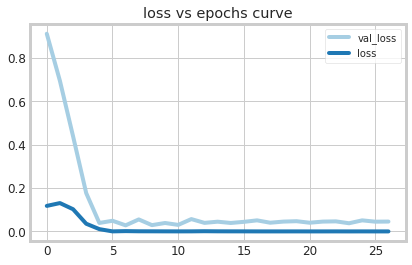

In [ ]:
pd.DataFrame(model.history.history).plot(title="loss vs epochs curve")

In [ ]:
model.history.history.keys()

dict_keys(['val_loss', 'loss'])

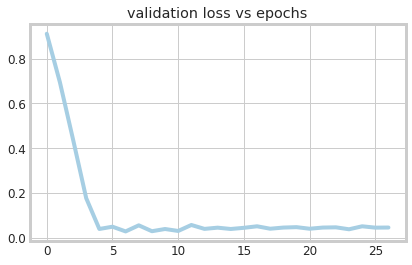

In [ ]:
myloss = model.history.history["val_loss"]
plt.title("validation loss vs epochs")
plt.plot(range(len(myloss)),myloss)

In [ ]:
## FORECAST

## holding predictions
test_prediction = []

##last n points from training set
first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape(1,n_input,n_features)

In [ ]:
current_batch.shape

(1, 5, 1)

In [ ]:
## how far in future we can predict
for i in range(len(test)+7):
    current_pred = model.predict(current_batch)[0]
    test_prediction.append(current_pred)
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [ ]:
test_prediction

[array([1.0665919], dtype=float32),
 array([1.0954655], dtype=float32),
 array([1.1296647], dtype=float32),
 array([1.1688071], dtype=float32),
 array([1.2115266], dtype=float32),
 array([1.262121], dtype=float32),
 array([1.3107803], dtype=float32),
 array([1.364997], dtype=float32),
 array([1.4248945], dtype=float32),
 array([1.4909155], dtype=float32),
 array([1.5644045], dtype=float32),
 array([1.6453042], dtype=float32)]

In [ ]:
### inverse scaled data
true_prediction = scaler.inverse_transform(test_prediction)
true_prediction[:,0]

array([1883635.28710115, 1934627.10463631, 1995023.80828166,
       2064150.65803802, 2139594.58998322, 2228945.74489427,
       2314879.62065816, 2410628.06865966, 2516408.77412784,
       2633004.05651259, 2762787.82165813, 2905659.22698736])

In [ ]:
time_series_array = test.index
for k in range(0,7):
    time_series_array = time_series_array.append(time_series_array[-1:] + pd.DateOffset(1))
time_series_array

DatetimeIndex(['2020-06-01', '2020-06-02', '2020-06-03', '2020-06-04',
               '2020-06-05', '2020-06-06', '2020-06-07', '2020-06-08',
               '2020-06-09', '2020-06-10', '2020-06-11', '2020-06-12'],
              dtype='datetime64[ns]', freq=None)

In [ ]:
df_forecast = pd.DataFrame(columns=["confirmed","confirmed_predicted"],index=time_series_array)
df_forecast

,confirmed,confirmed_predicted
2020-06-01,NaN,NaN
2020-06-02,NaN,NaN
2020-06-03,NaN,NaN
2020-06-04,NaN,NaN
2020-06-05,NaN,NaN
2020-06-06,NaN,NaN
2020-06-07,NaN,NaN
2020-06-08,NaN,NaN
2020-06-09,NaN,NaN
2020-06-10,NaN,NaN


In [ ]:
df_forecast.loc[:,"confirmed_predicted"] = true_prediction[:,0]
df_forecast.loc[:,"confirmed"] = test["Confirmed"]

In [ ]:
df_forecast

,confirmed,confirmed_predicted
2020-06-01,1785981.0,1.883635e+06
2020-06-02,1806728.0,1.934627e+06
2020-06-03,1827466.0,1.995024e+06
2020-06-04,1847074.0,2.064151e+06
2020-06-05,1867724.0,2.139595e+06
2020-06-06,NaN,2.228946e+06
2020-06-07,NaN,2.314880e+06
2020-06-08,NaN,2.410628e+06
2020-06-09,NaN,2.516409e+06
2020-06-10,NaN,2.633004e+06


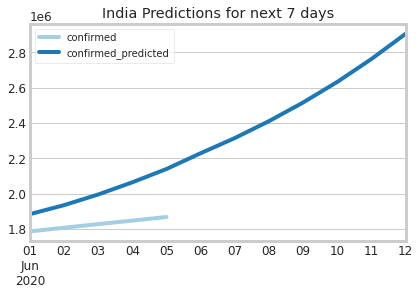

In [ ]:
#plt.ylim([80000,85000])
df_forecast.plot(title="India Predictions for next 7 days")

In [ ]:
MAPE = np.mean(np.abs(np.array(df_forecast["confirmed"][:5]) - np.array(df_forecast["confirmed_predicted"][:5]))/np.array(df_forecast["confirmed"][:5]))
print("MAPE is " + str(MAPE*100) + " %")

MAPE is 9.604888397868619 %


In [ ]:
sum_errs = np.sum((np.array(df_forecast["confirmed"][:5]) - np.array(df_forecast["confirmed_predicted"][:5]))**2)
sum_errs

175006053034.93976

In [ ]:
stdev = np.sqrt(1/(5-2) * sum_errs)
stdev

241527.12272464676

In [ ]:
# calculate prediction interval
interval = 1.96 * stdev
interval

473393.16054030764

In [ ]:
df_forecast["confirm_min"] = df_forecast["confirmed_predicted"] - interval
df_forecast["confirm_max"] = df_forecast["confirmed_predicted"] + interval
df_forecast

,confirmed,confirmed_predicted,confirm_min,confirm_max
2020-06-01,1785981.0,1.883635e+06,1.410242e+06,2.357028e+06
2020-06-02,1806728.0,1.934627e+06,1.461234e+06,2.408020e+06
2020-06-03,1827466.0,1.995024e+06,1.521631e+06,2.468417e+06
2020-06-04,1847074.0,2.064151e+06,1.590757e+06,2.537544e+06
2020-06-05,1867724.0,2.139595e+06,1.666201e+06,2.612988e+06
2020-06-06,NaN,2.228946e+06,1.755553e+06,2.702339e+06
2020-06-07,NaN,2.314880e+06,1.841486e+06,2.788273e+06
2020-06-08,NaN,2.410628e+06,1.937235e+06,2.884021e+06
2020-06-09,NaN,2.516409e+06,2.043016e+06,2.989802e+06
2020-06-10,NaN,2.633004e+06,2.159611e+06,3.106397e+06


In [ ]:
df_forecast["Model Accuracy"] = round((1-MAPE),2)
df_forecast

,confirmed,confirmed_predicted,confirm_min,confirm_max,Model Accuracy
2020-06-01,1785981.0,1.883635e+06,1.410242e+06,2.357028e+06,0.9
2020-06-02,1806728.0,1.934627e+06,1.461234e+06,2.408020e+06,0.9
2020-06-03,1827466.0,1.995024e+06,1.521631e+06,2.468417e+06,0.9
2020-06-04,1847074.0,2.064151e+06,1.590757e+06,2.537544e+06,0.9
2020-06-05,1867724.0,2.139595e+06,1.666201e+06,2.612988e+06,0.9
2020-06-06,NaN,2.228946e+06,1.755553e+06,2.702339e+06,0.9
2020-06-07,NaN,2.314880e+06,1.841486e+06,2.788273e+06,0.9
2020-06-08,NaN,2.410628e+06,1.937235e+06,2.884021e+06,0.9
2020-06-09,NaN,2.516409e+06,2.043016e+06,2.989802e+06,0.9
2020-06-10,NaN,2.633004e+06,2.159611e+06,3.106397e+06,0.9


In [ ]:
from datetime import datetime

df_forecast["Execution date"] = str(datetime.now()).split()[0]
df_forecast

,confirmed,confirmed_predicted,confirm_min,confirm_max,Model Accuracy,Execution date
2020-06-01,1785981.0,1.883635e+06,1.410242e+06,2.357028e+06,0.9,2020-06-08
2020-06-02,1806728.0,1.934627e+06,1.461234e+06,2.408020e+06,0.9,2020-06-08
2020-06-03,1827466.0,1.995024e+06,1.521631e+06,2.468417e+06,0.9,2020-06-08
2020-06-04,1847074.0,2.064151e+06,1.590757e+06,2.537544e+06,0.9,2020-06-08
2020-06-05,1867724.0,2.139595e+06,1.666201e+06,2.612988e+06,0.9,2020-06-08
2020-06-06,NaN,2.228946e+06,1.755553e+06,2.702339e+06,0.9,2020-06-08
2020-06-07,NaN,2.314880e+06,1.841486e+06,2.788273e+06,0.9,2020-06-08
2020-06-08,NaN,2.410628e+06,1.937235e+06,2.884021e+06,0.9,2020-06-08
2020-06-09,NaN,2.516409e+06,2.043016e+06,2.989802e+06,0.9,2020-06-08
2020-06-10,NaN,2.633004e+06,2.159611e+06,3.106397e+06,0.9,2020-06-08


In [ ]:
df_forecast.to_csv("/content/drive/My Drive/data/confirmed.csv")

In [ ]:
"""from google.colab import drive
drive.mount('/content/drive')"""

"from google.colab import drive\ndrive.mount('/content/drive')"

In [ ]:
### save model
model.save("/content/drive/My Drive/data/model.h5".format(str(datetime.now()).split()[0]))

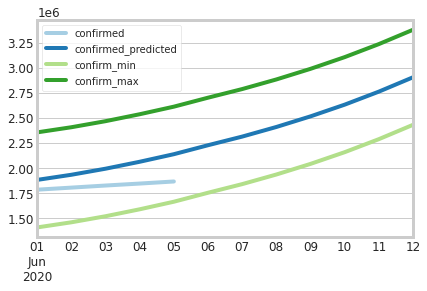

In [ ]:
df_forecast.iloc[:,:4].plot()

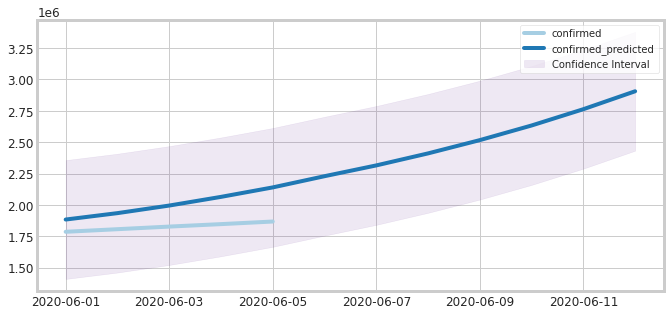

In [ ]:
fig= plt.figure(figsize=(10,5))

plt.plot(df_forecast.index,df_forecast["confirmed"],label="confirmed")
plt.plot(df_forecast.index,df_forecast["confirmed_predicted"],label="confirmed_predicted")
#ax.fill_between(x, (y-ci), (y+ci), color='b', alpha=.1)
plt.fill_between(df_forecast.index,df_forecast["confirm_min"],df_forecast["confirm_max"],color="indigo",alpha=0.09,label="Confidence Interval")
plt.legend()
plt.show()



---



In [ ]:
df_ts

In [ ]:
df_pr = df_ts.copy()
df_pr.head(2)

,Confirmed
2020-01-22,1
2020-01-23,1


In [ ]:
df_pr = df_ts.copy()
df_pr = df_ts.reset_index()
df_pr.columns = ['ds','y'] # To use prophet column names should be like that
train_data_pr = df_pr.iloc[:len(df)-12]
test_data_pr = df_pr.iloc[len(df)-12:]
from fbprophet import Prophet
m = Prophet()
m.fit(train_data_pr)
future = m.make_future_dataframe(periods=30)
prophet_pred = m.predict(future)
prophet_pred.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
161,2020-07-01,2.444512e+06,2.343443e+06,2.541596e+06,2.344756e+06,2.544018e+06,-1084.499870,-1084.499870,-1084.499870,-1084.499870,-1084.499870,-1084.499870,0.0,0.0,0.0,2.443427e+06
162,2020-07-02,2.466426e+06,2.359322e+06,2.569857e+06,2.359831e+06,2.571663e+06,-1551.301646,-1551.301646,-1551.301646,-1551.301646,-1551.301646,-1551.301646,0.0,0.0,0.0,2.464875e+06
163,2020-07-03,2.488340e+06,2.373924e+06,2.598561e+06,2.374299e+06,2.598973e+06,-1089.439540,-1089.439540,-1089.439540,-1089.439540,-1089.439540,-1089.439540,0.0,0.0,0.0,2.487251e+06
164,2020-07-04,2.510255e+06,2.390332e+06,2.627475e+06,2.389996e+06,2.624382e+06,1292.121276,1292.121276,1292.121276,1292.121276,1292.121276,1292.121276,0.0,0.0,0.0,2.511547e+06
165,2020-07-05,2.532169e+06,2.409960e+06,2.652940e+06,2.406179e+06,2.651326e+06,1965.978292,1965.978292,1965.978292,1965.978292,1965.978292,1965.978292,0.0,0.0,0.0,2.534135e+06


In [ ]:
prophet_pred = pd.DataFrame({"Date" : prophet_pred[-12:]['ds'], "Pred" : prophet_pred[-12:]["yhat"]})
prophet_pred = prophet_pred.set_index("Date")
#prophet_pred.index.freq = "MS"
prophet_pred

,Pred
Date,
2020-06-24,2.290027e+06
2020-06-25,2.311474e+06
2020-06-26,2.333850e+06
2020-06-27,2.358146e+06
2020-06-28,2.380735e+06
2020-06-29,2.401627e+06
2020-06-30,2.422120e+06
2020-07-01,2.443427e+06
2020-07-02,2.464875e+06


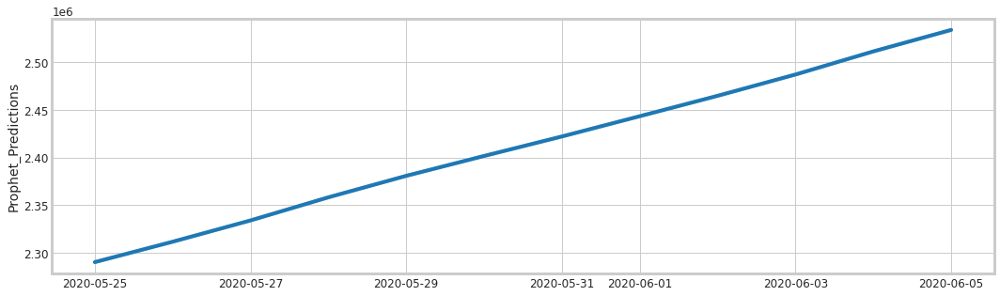

In [ ]:
test_data["Confirmed"] = prophet_pred['Pred'].values
import seaborn as sns
plt.figure(figsize=(16,5))
ax = sns.lineplot(x= test_data.index, y=test_data["Confirmed"])
sns.lineplot(x=test_data.index, y = test_data["Prophet_Predictions"]);

In [ ]:
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
prophet_rmse_error = rmse(test_data['Confirmed'], test_data["Prophet_Predictions"])
prophet_mse_error = prophet_rmse_error**2
mean_value = df['Confirmed'].mean()

print(f'MSE Error: {prophet_mse_error}\nRMSE Error: {prophet_rmse_error}\nMean: {mean_value}')

MSE Error: 0.0
RMSE Error: 0.0
Mean: 15292.031275221952


**Prophet for each state**

In [ ]:
dfPR.head(2)

State,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,...,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
df = dfPR.copy()
df.columns

Index(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
       'Connecticut', 'Delaware', 'District of Columbia', 'Florida', 'Georgia',
       'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky',
       'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan',
       'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
       'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
       'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'],
      dtype='object', name='State')

In [ ]:
## Enumerate and convert for Prophet !!!
dfPR = dfTS.copy()
dfs = []
for i, state in enumerate(dfPR.columns):
  # add only from the first valid index
  dfs.append(dfPR.loc[dfPR.loc[:,state].first_valid_index():,state])
  dfs[i] = dfs[i].to_frame()
  dfs[i].name = state
  dfs[i]['ds'] = dfs[i].index
  dfs[i].rename(columns={state: 'y'}, inplace = True)

## Check the firststate
print(dfs[0].name)

Alabama


In [ ]:
## Check the firststate
print(dfs[6].name)

Connecticut


In [ ]:
dfs[0] # state Alabama

In [ ]:
dfs[2] # Alaska 

Try just for one state:

**Alabama**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


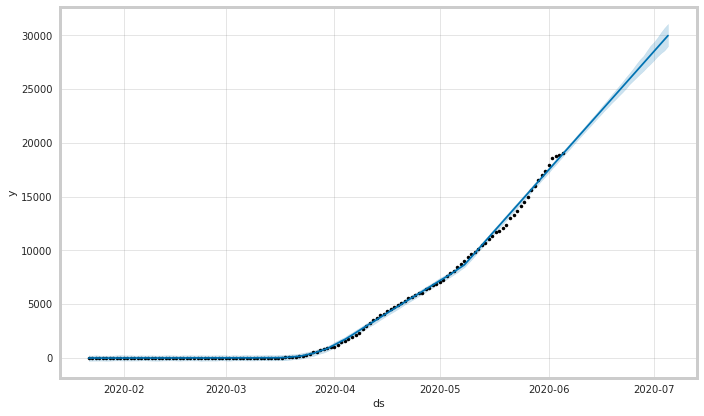

In [ ]:
m = Prophet()
m.fit(dfs[0])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
# Python
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='30 days', period='10 days', horizon = '30 days')
df_cv.head()

# Python
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:fbprophet:Making 8 forecasts with cutoffs between 2020-02-26 00:00:00 and 2020-05-06 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,3 days,142258.550292,377.171778,266.974294,NaN,0.291667
1,4 days,205342.704891,453.147553,320.987746,NaN,0.291667
2,5 days,275225.698220,524.619575,372.502355,NaN,0.250000
3,6 days,366104.540253,605.065732,431.201293,NaN,0.166667
4,7 days,471656.822166,686.772759,482.229933,NaN,0.125000


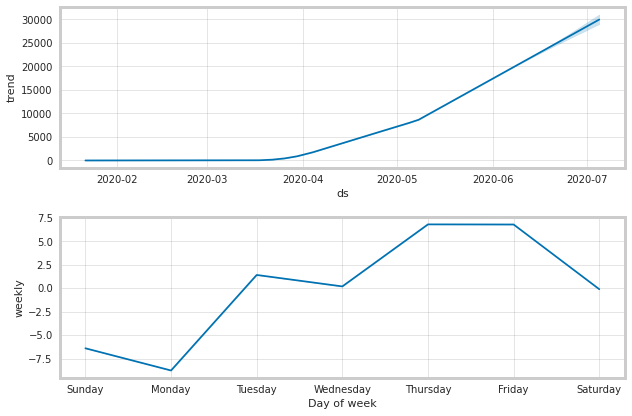

In [ ]:
fig2 = m.plot_components(forecast)


In [ ]:
forecast.tail(36).T

,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165
ds,2020-05-31 00:00:00,2020-06-01 00:00:00,2020-06-02 00:00:00,2020-06-03 00:00:00,2020-06-04 00:00:00,2020-06-05 00:00:00,2020-06-06 00:00:00,2020-06-07 00:00:00,2020-06-08 00:00:00,2020-06-09 00:00:00,2020-06-10 00:00:00,2020-06-11 00:00:00,2020-06-12 00:00:00,2020-06-13 00:00:00,2020-06-14 00:00:00,2020-06-15 00:00:00,2020-06-16 00:00:00,2020-06-17 00:00:00,2020-06-18 00:00:00,2020-06-19 00:00:00,2020-06-20 00:00:00,2020-06-21 00:00:00,2020-06-22 00:00:00,2020-06-23 00:00:00,2020-06-24 00:00:00,2020-06-25 00:00:00,2020-06-26 00:00:00,2020-06-27 00:00:00,2020-06-28 00:00:00,2020-06-29 00:00:00,2020-06-30 00:00:00,2020-07-01 00:00:00,2020-07-02 00:00:00,2020-07-03 00:00:00,2020-07-04 00:00:00,2020-07-05 00:00:00
trend,17113,17480.8,17848.6,18216.4,18584.2,18952,19319.8,19687.6,20055.4,20423.2,20791,21158.8,21526.6,21894.4,22262.2,22630,22997.8,23365.6,23733.4,24101.2,24469,24836.8,25204.6,25572.4,25940.2,26307.9,26675.7,27043.5,27411.3,27779.1,28146.9,28514.7,28882.5,29250.3,29618.1,29985.9
yhat_lower,16847.7,17212.2,17616.4,17962,18342.3,18713.7,19079.4,19426.5,19807.3,20173.1,20539.8,20896.3,21262.3,21601.9,21970.6,22333.3,22679.9,23035.4,23364.9,23727.6,24033,24375.8,24698.6,25048.9,25446.1,25760.6,26076.7,26395.7,26695.4,27043.3,27350.3,27689.6,28039.8,28348.9,28601.5,28996.9
yhat_upper,17347.5,17724.6,18098.7,18451.9,18840,19193.8,19568.4,19940.2,20291.1,20682.8,21051.8,21413.4,21800.3,22192.5,22549.9,22923.9,23340.6,23721,24108.8,24514.8,24885.1,25283.6,25666.3,26093.1,26474.5,26886.6,27339.4,27753.2,28090,28577.7,29042.6,29384,29800.2,30278.9,30702.6,31066.5
trend_lower,17113,17480.8,17848.6,18216.4,18584.2,18952,19319.8,19682.3,20039.3,20389,20738.7,21081.9,21427.8,21768,22114,22451.8,22789.4,23135,23479.9,23814.7,24148.5,24481.3,24804.4,25137.8,25469.8,25804.7,26123.4,26438.2,26760.8,27072.7,27394.6,27715.3,28049.8,28380.5,28701.7,28999.1
trend_upper,17113,17480.8,17848.6,18216.4,18584.2,18952,19319.8,19693.8,20073.9,20457.6,20845.2,21235.1,21625.8,22023.2,22417.7,22810.3,23211.7,23612.5,24017.8,24420.8,24816.2,25211.4,25614.7,26023.2,26427.4,26840.7,27253.1,27681.5,28105.6,28529.3,28966.1,29386.3,29815.2,30243,30673.9,31089.5
additive_terms,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585
additive_terms_lower,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585
additive_terms_upper,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585
weekly,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585,-8.75141,1.42257,0.203012,6.80968,6.7968,-0.094794,-6.38585


In [ ]:
## Actual
dfs[0].tail(6)

,y,ds
Date,,
2020-05-31,17359,2020-05-31
2020-06-01,17952,2020-06-01
2020-06-02,18630,2020-06-02
2020-06-03,18766,2020-06-03
2020-06-04,18851,2020-06-04
2020-06-05,19072,2020-06-05


In [ ]:
df_actual = dfs[0].iloc[:,0]

In [ ]:
se = np.square(forecast.loc[:, 'yhat'] - dfs[0].iloc[:,0])
mse = np.mean(se)
rmse = np.sqrt(mse)

In [ ]:
rmse

nan

In [ ]:
"""# Compute the mean square error / RMSE
mse_prophet = mean_squared_error(test['zip_median'].values, forecast[forecast['ds']>='2018-01-01'].yhat.values)
r2_prophet = r2_score(test['zip_median'].values, forecast[forecast['ds']>='2018-01-01'].yhat.values)

# Print the results. 
print('RMSE: ' +  str(format(round(sqrt(mse_prophet), 3))))
print('R-squared: ' + str(format(round(r2_prophet, 3))))"""


"# Compute the mean square error / RMSE\n  mse_prophet = mean_squared_error(test['zip_median'].values, forecast[forecast['ds']>='2018-01-01'].yhat.values)\n  r2_prophet = r2_score(test['zip_median'].values, forecast[forecast['ds']>='2018-01-01'].yhat.values)\n\n  # Print the results. \n  print('RMSE: ' +  str(format(round(sqrt(mse_prophet), 3))))\n  print('R-squared: ' + str(format(round(r2_prophet, 3))))\n"

In [ ]:
 predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'AL_Predict':forecast.tail(30)['yhat'], 'AL_lower':forecast.tail(30)['yhat_lower'], 'AL_upper':forecast.tail(30)['yhat_upper'] } )
 Alabama = predictions.copy()
  #predictions.to_csv('/content/drive/My Drive/IST718/home_zip_predictions_CA_1146.csv', mode='a', header=False)

In [ ]:
Alabama

,Date,AL_Predict,AL_lower,AL_upper
136,2020-06-06,19319.711568,19085.044307,19550.123975
137,2020-06-07,19681.217385,19441.567132,19939.530424
138,2020-06-08,20046.648703,19789.872272,20288.621195
139,2020-06-09,20424.619568,20157.142945,20638.276520
140,2020-06-10,20791.196883,20516.625800,21039.088038
141,2020-06-11,21165.600424,20903.785624,21412.823533
142,2020-06-12,21533.384424,21249.937697,21807.042123
143,2020-06-13,21894.289708,21601.957076,22152.611796
144,2020-06-14,22255.795525,21930.004712,22541.010808
145,2020-06-15,22621.226843,22272.381790,22892.976979


**Alaska**

In [ ]:
def prophet(df, location_name):
  m = Prophet()
  m.fit(df)
  future = m.make_future_dataframe(periods=30)
  forecast = m.predict(future)
  print("====",location_name,"====")
  fig1 = m.plot(forecast)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Alaska ====


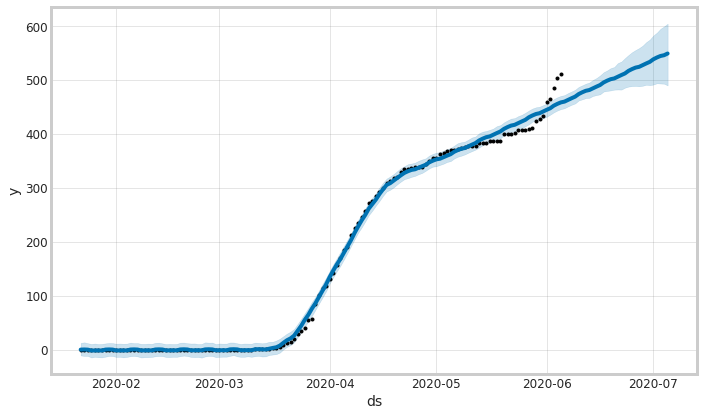

In [ ]:
prophet(dfs[1], dfs[1].name)

In [ ]:
m = Prophet()
m.fit(dfs[1])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
 predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'AK_Predict':forecast.tail(30)['yhat'], 'AK_lower':forecast.tail(30)['yhat_lower'], 'AK_upper':forecast.tail(30)['yhat_upper'] } )
 Alaska = predictions.copy()

In [ ]:
Alaska

**Arizona**

In [ ]:
print(dfs[2].name)

Arizona


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Arizona ====


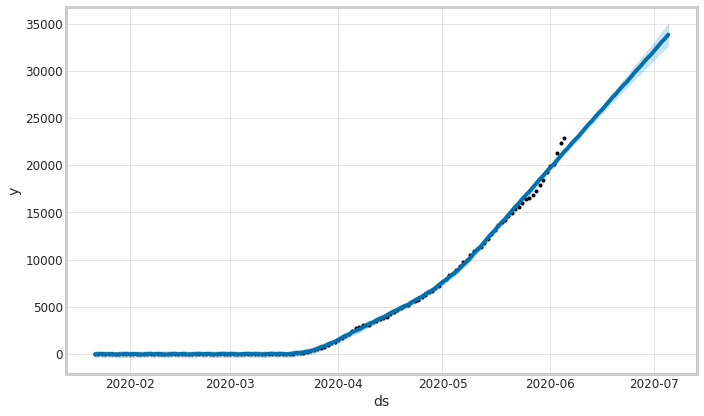

In [ ]:
prophet(dfs[2], dfs[2].name)

In [ ]:
m = Prophet()
m.fit(dfs[2])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
 predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'AZ_Predict':forecast.tail(30)['yhat'], 'AZ_lower':forecast.tail(30)['yhat_lower'], 'AZ_upper':forecast.tail(30)['yhat_upper'] } )
Arizona = predictions.copy()

In [ ]:
Arizona

**Arkansas**

In [ ]:
print(dfs[3].name)

Arkansas


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Arkansas ====


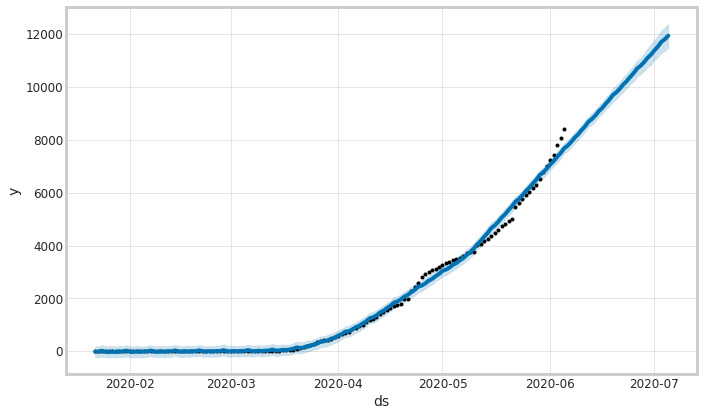

In [ ]:
prophet(dfs[3], dfs[3].name)

In [ ]:
m = Prophet()
m.fit(dfs[3])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'AR_Predict':forecast.tail(30)['yhat'], 'AR_lower':forecast.tail(30)['yhat_lower'], 'AR_upper':forecast.tail(30)['yhat_upper'] } )
Arkansas = predictions.copy()

In [ ]:
Arkansas

**California**

In [ ]:
print(dfs[4].name)

California


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== California ====


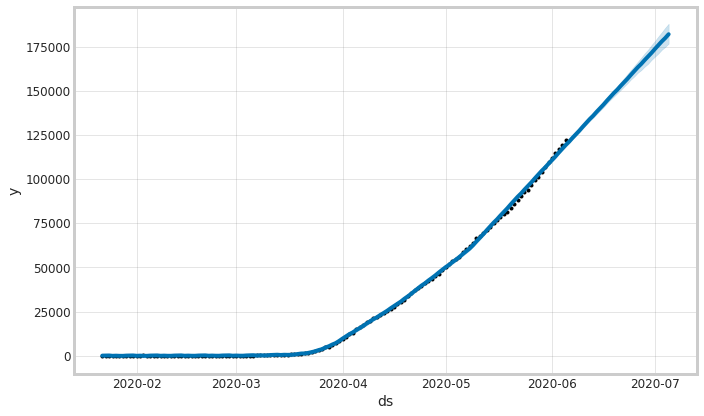

In [ ]:
prophet(dfs[4], dfs[4].name)

In [ ]:
m = Prophet()
m.fit(dfs[4])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'CA_Predict':forecast.tail(30)['yhat'], 'CA_lower':forecast.tail(30)['yhat_lower'], 'CA_upper':forecast.tail(30)['yhat_upper'] } )
California = predictions.copy()

In [ ]:
California

**Colorado**

In [ ]:
print(dfs[5].name)

Colorado


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Colorado ====


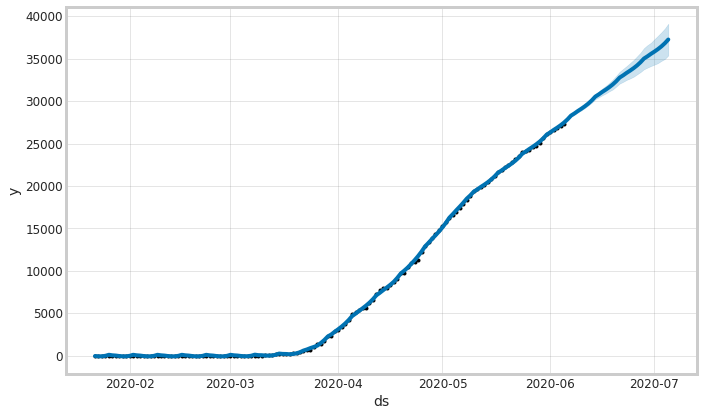

In [ ]:
prophet(dfs[5], dfs[5].name)

In [ ]:
m = Prophet()
m.fit(dfs[5])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'CO_Predict':forecast.tail(30)['yhat'], 'CO_lower':forecast.tail(30)['yhat_lower'], 'CO_upper':forecast.tail(30)['yhat_upper'] } )
Colorado = predictions.copy()

In [ ]:
Colorado

**Connecticut**

In [ ]:
print(dfs[6].name)

Connecticut


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Connecticut ====


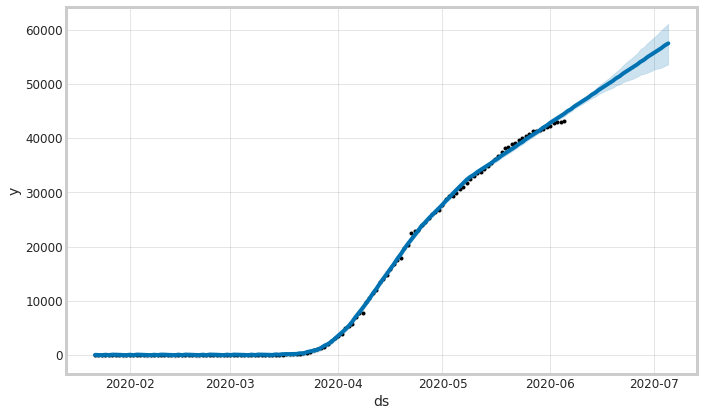

In [ ]:
prophet(dfs[6], dfs[6].name)

In [ ]:
m = Prophet()
m.fit(dfs[6])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'CT_Predict':forecast.tail(30)['yhat'], 'CT_lower':forecast.tail(30)['yhat_lower'], 'CT_upper':forecast.tail(30)['yhat_upper'] } )
Connecticut = predictions.copy()

**Delaware**

In [ ]:
print(dfs[7].name)

Delaware


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Delaware ====


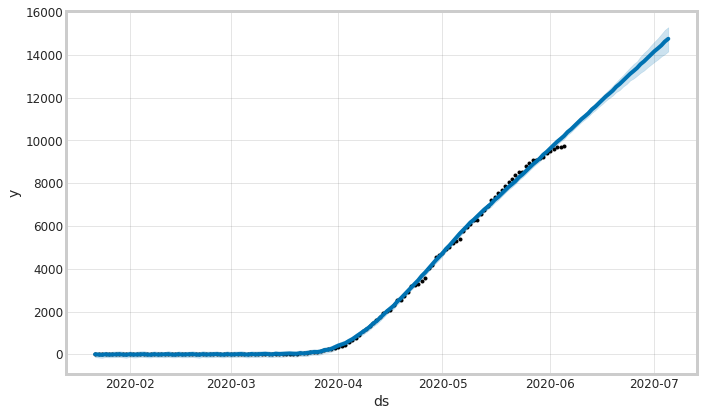

In [ ]:
prophet(dfs[7], dfs[7].name)

In [ ]:
m = Prophet()
m.fit(dfs[7])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'DE_Predict':forecast.tail(30)['yhat'], 'DE_lower':forecast.tail(30)['yhat_lower'], 'DE_upper':forecast.tail(30)['yhat_upper'] } )
Delaware = predictions.copy()

In [ ]:
Delaware

**District of Columbia**

In [ ]:
print(dfs[8].name)

District of Columbia


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== District of Columbia ====


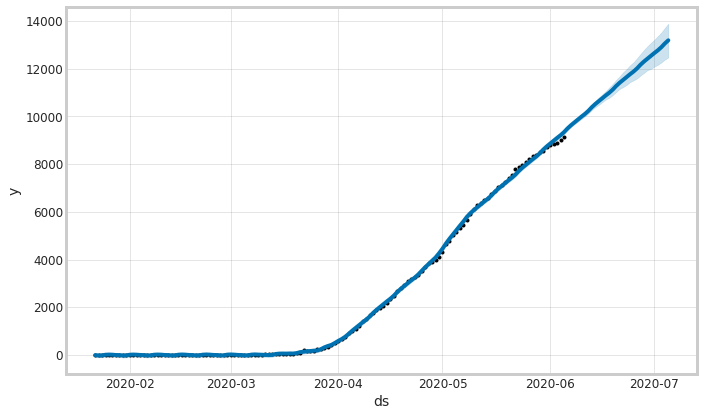

In [ ]:
prophet(dfs[8], dfs[8].name)

In [ ]:
m = Prophet()
m.fit(dfs[8])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'DC_Predict':forecast.tail(30)['yhat'], 'DC_lower':forecast.tail(30)['yhat_lower'], 'DC_upper':forecast.tail(30)['yhat_upper'] } )
DC = predictions.copy()

In [ ]:
DC

**Florida**

In [ ]:
print(dfs[9].name)

Florida


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Florida ====


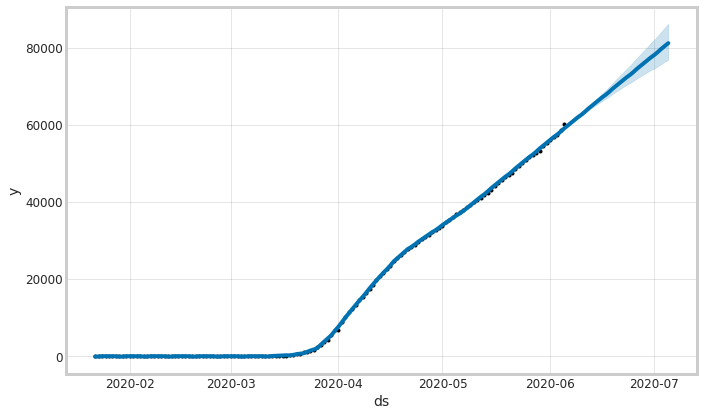

In [ ]:
prophet(dfs[9], dfs[9].name)

In [ ]:
m = Prophet()
m.fit(dfs[9])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'FL_Predict':forecast.tail(30)['yhat'], 'FL_lower':forecast.tail(30)['yhat_lower'], 'FL_upper':forecast.tail(30)['yhat_upper'] } )
Florida = predictions.copy()

In [ ]:
Florida

In [ ]:
## Combine the first 10
m1 = pd.merge(left=Alabama,right=Alaska, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

In [ ]:
m2 = pd.merge(left=m1,right=Arizona, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

In [ ]:
m3 = pd.merge(left=m2,right=Arkansas, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m4 = pd.merge(left=m3,right=California, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m5 = pd.merge(left=m4,right=Colorado, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m6 = pd.merge(left=m5,right=Connecticut, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m7 = pd.merge(left=m6,right=Delaware, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m8 = pd.merge(left=m7,right=DC, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m9 = pd.merge(left=m8,right=Florida, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')


**Georgia**

In [ ]:
print(dfs[10].name)

Georgia


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Georgia ====


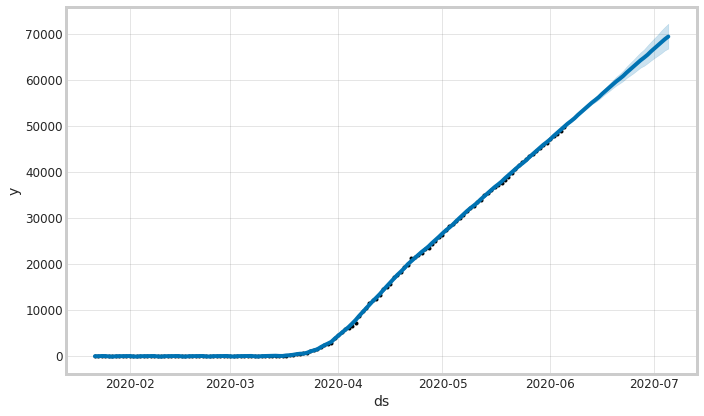

In [ ]:
prophet(dfs[10], dfs[10].name)

In [ ]:
m = Prophet()
m.fit(dfs[10])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'GA_Predict':forecast.tail(30)['yhat'], 'GA_lower':forecast.tail(30)['yhat_lower'], 'GA_upper':forecast.tail(30)['yhat_upper'] } )
Georgia = predictions.copy()

**Hawaii**

In [ ]:
print(dfs[11].name)

Hawaii


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Hawaii ====


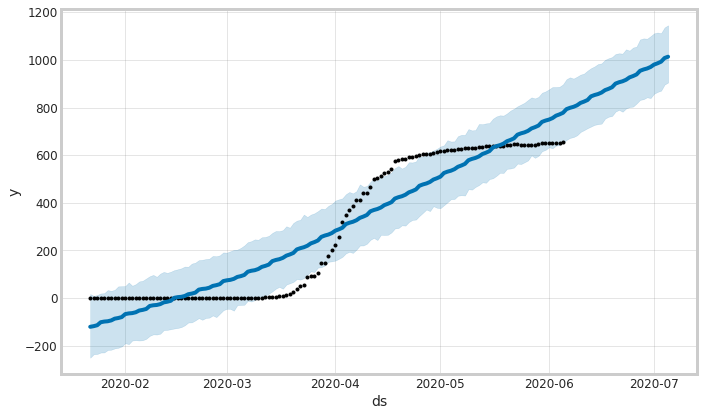

In [ ]:
prophet(dfs[11], dfs[11].name)

In [ ]:
m = Prophet()
m.fit(dfs[11])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'HI_Predict':forecast.tail(30)['yhat'], 'HI_lower':forecast.tail(30)['yhat_lower'], 'HI_upper':forecast.tail(30)['yhat_upper'] } )
Hawaii = predictions.copy()

**Idaho**

In [ ]:
print(dfs[12].name)

Idaho


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Idaho ====


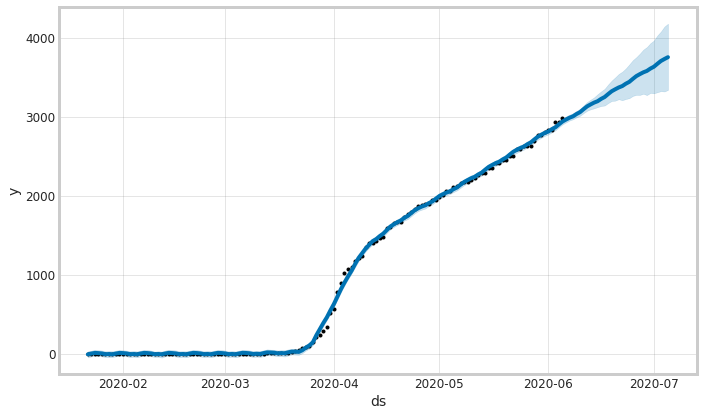

In [ ]:
prophet(dfs[12], dfs[12].name)

In [ ]:
m = Prophet()
m.fit(dfs[12])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'ID_Predict':forecast.tail(30)['yhat'], 'ID_lower':forecast.tail(30)['yhat_lower'], 'ID_upper':forecast.tail(30)['yhat_upper'] } )
Idaho = predictions.copy()

**Illinois**

In [ ]:
print(dfs[13].name)

Illinois


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Illinois ====


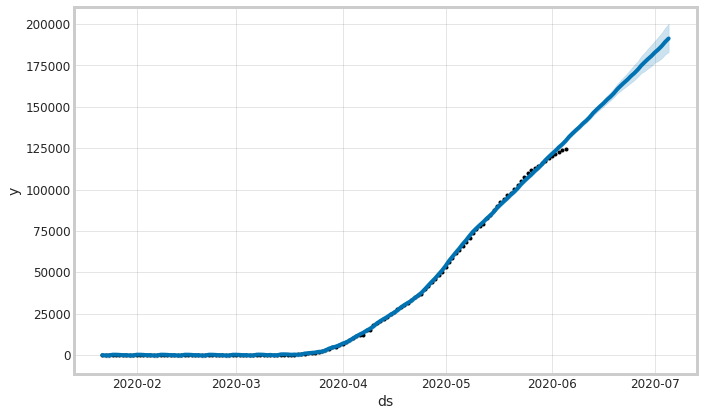

In [ ]:
prophet(dfs[13], dfs[13].name)

In [ ]:
m = Prophet()
m.fit(dfs[13])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'IL_Predict':forecast.tail(30)['yhat'], 'IL_lower':forecast.tail(30)['yhat_lower'], 'IL_upper':forecast.tail(30)['yhat_upper'] } )
Illinois = predictions.copy()

**Indiana**

In [ ]:
print(dfs[14].name)

Indiana


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Indiana ====


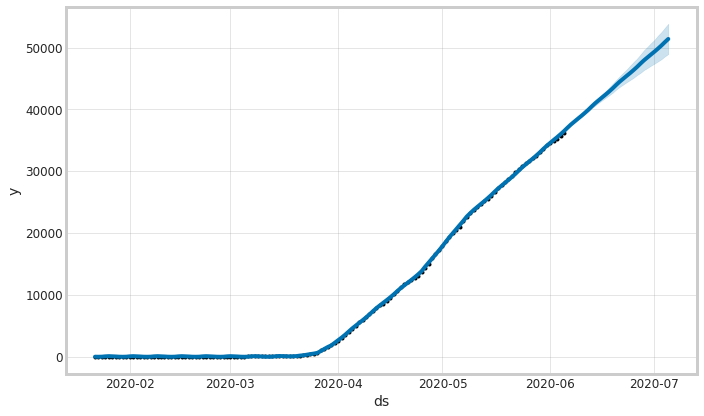

In [ ]:
prophet(dfs[14], dfs[14].name)

In [ ]:
m = Prophet()
m.fit(dfs[14])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'IN_Predict':forecast.tail(30)['yhat'], 'IN_lower':forecast.tail(30)['yhat_lower'], 'IN_upper':forecast.tail(30)['yhat_upper'] } )
Indiana = predictions.copy()

**Iowa**

In [ ]:
print(dfs[15].name)

Iowa


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Iowa ====


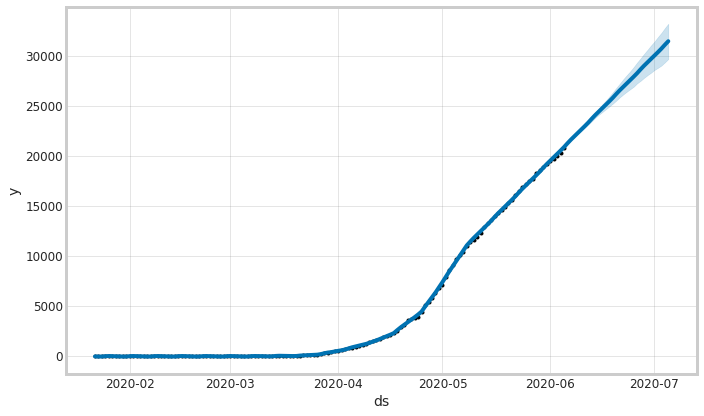

In [ ]:
prophet(dfs[15], dfs[15].name)

In [ ]:
m = Prophet()
m.fit(dfs[15])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'IA_Predict':forecast.tail(30)['yhat'], 'IA_lower':forecast.tail(30)['yhat_lower'], 'IA_upper':forecast.tail(30)['yhat_upper'] } )
Iowa = predictions.copy()

**Kansas**

In [ ]:
print(dfs[16].name)

Kansas


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Kansas ====


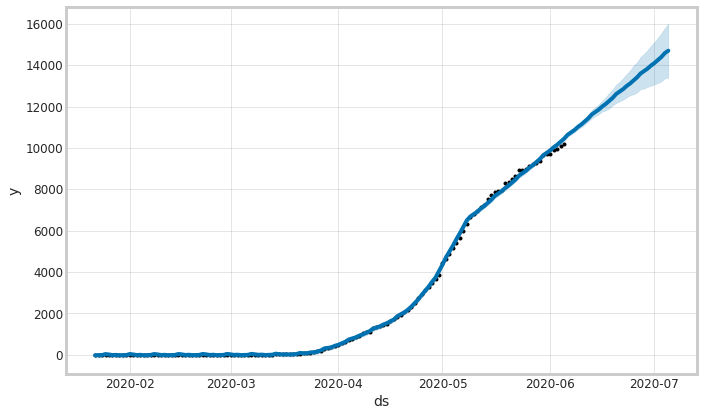

In [ ]:
prophet(dfs[16], dfs[16].name)

In [ ]:
m = Prophet()
m.fit(dfs[16])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'KS_Predict':forecast.tail(30)['yhat'], 'KS_lower':forecast.tail(30)['yhat_lower'], 'KS_upper':forecast.tail(30)['yhat_upper'] } )
Kansas = predictions.copy()

**Kentucky**

In [ ]:
print(dfs[17].name)

Kentucky


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Kentucky ====


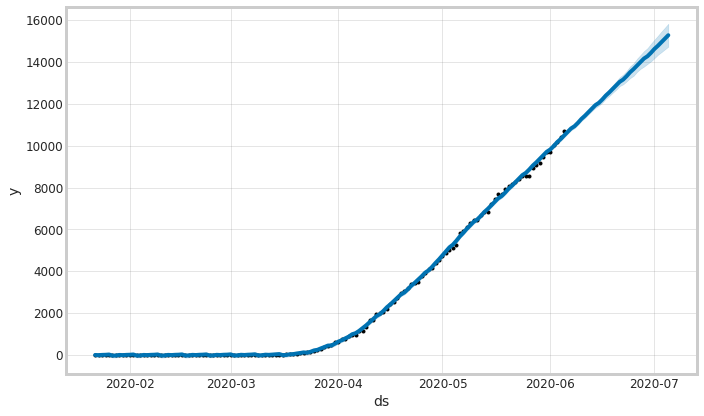

In [ ]:
prophet(dfs[17], dfs[17].name)

In [ ]:
m = Prophet()
m.fit(dfs[17])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'KY_Predict':forecast.tail(30)['yhat'], 'KY_lower':forecast.tail(30)['yhat_lower'], 'KY_upper':forecast.tail(30)['yhat_upper'] } )
Kentucky = predictions.copy()

**Louisiana**

In [ ]:
print(dfs[18].name)

Louisiana


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Louisiana ====


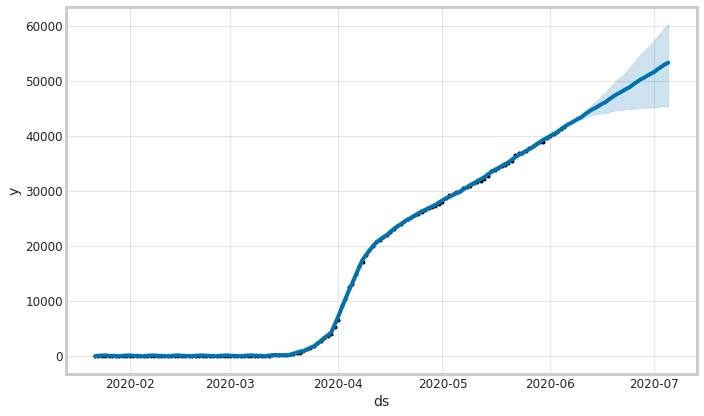

In [ ]:
prophet(dfs[18], dfs[18].name)

In [ ]:
m = Prophet()
m.fit(dfs[18])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'LA_Predict':forecast.tail(30)['yhat'], 'LA_lower':forecast.tail(30)['yhat_lower'], 'LA_upper':forecast.tail(30)['yhat_upper'] } )
Louisiana = predictions.copy()

**Maine**

In [ ]:
print(dfs[19].name)

Maine


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Maine ====


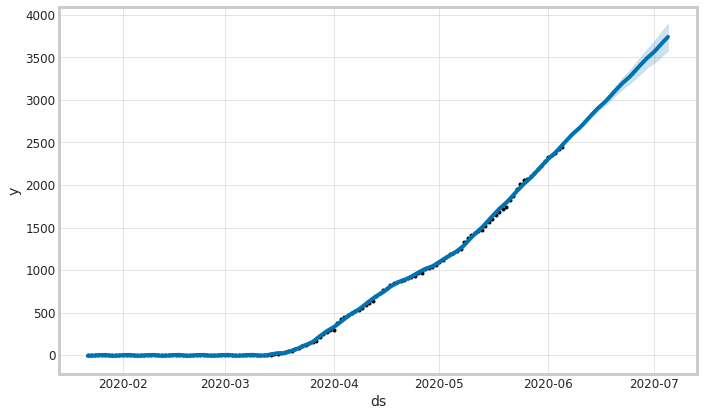

In [ ]:
prophet(dfs[19], dfs[19].name)

In [ ]:
m = Prophet()
m.fit(dfs[19])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'ME_Predict':forecast.tail(30)['yhat'], 'ME_lower':forecast.tail(30)['yhat_lower'], 'ME_upper':forecast.tail(30)['yhat_upper'] } )
Maine = predictions.copy()

In [ ]:
## Combine next 10
m10 = pd.merge(left=m9,right=Georgia, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m11 = pd.merge(left=m10,right=Hawaii, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m12 = pd.merge(left=m11,right=Idaho, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m13 = pd.merge(left=m12,right=Illinois, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m14 = pd.merge(left=m13,right=Indiana, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m15 = pd.merge(left=m14,right=Iowa, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m16 = pd.merge(left=m15,right=Kansas, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m17 = pd.merge(left=m16,right=Kentucky, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m18 = pd.merge(left=m17,right=Louisiana, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m19 = pd.merge(left=m18,right=Maine, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

**Maryland**

In [ ]:
print(dfs[20].name)

Maryland


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Maryland ====


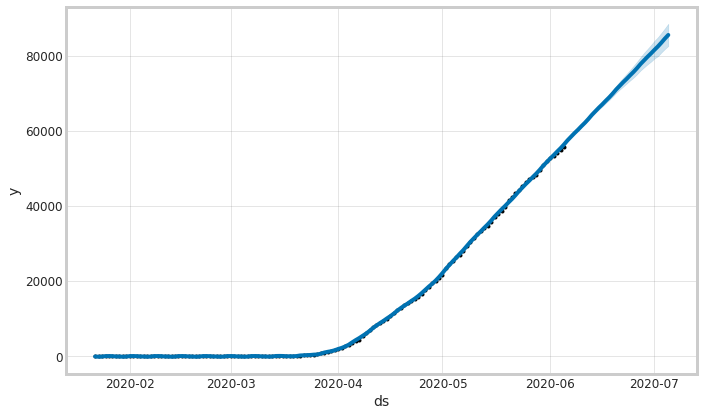

In [ ]:
prophet(dfs[20], dfs[20].name)

In [ ]:
m = Prophet()
m.fit(dfs[20])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MD_Predict':forecast.tail(30)['yhat'], 'MD_lower':forecast.tail(30)['yhat_lower'], 'MD_upper':forecast.tail(30)['yhat_upper'] } )
Maryland = predictions.copy()

**Massachusetts**

In [ ]:
print(dfs[21].name)

Massachusetts


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Massachusetts ====


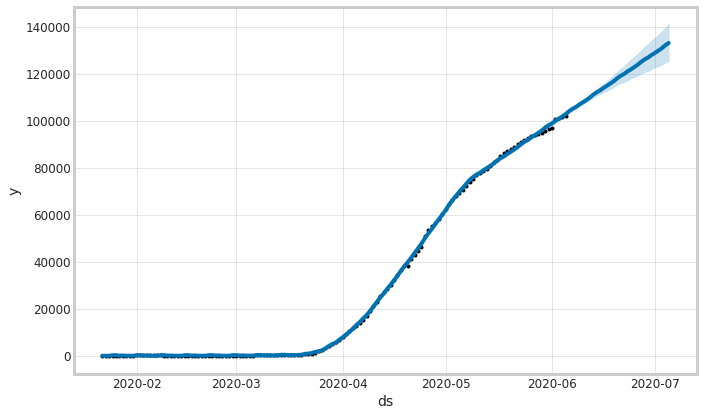

In [ ]:
prophet(dfs[21], dfs[21].name)

In [ ]:
m = Prophet()
m.fit(dfs[21])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MA_Predict':forecast.tail(30)['yhat'], 'MA_lower':forecast.tail(30)['yhat_lower'], 'MA_upper':forecast.tail(30)['yhat_upper'] } )
Massachusetts = predictions.copy()

**Michigan**

In [ ]:
print(dfs[22].name)

Michigan


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Michigan ====


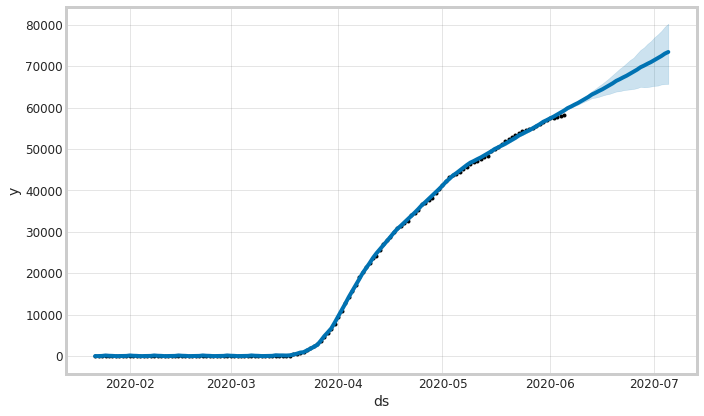

In [ ]:
prophet(dfs[22], dfs[22].name)

In [ ]:
m = Prophet()
m.fit(dfs[22])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MI_Predict':forecast.tail(30)['yhat'], 'MI_lower':forecast.tail(30)['yhat_lower'], 'MI_upper':forecast.tail(30)['yhat_upper'] } )
Michigan = predictions.copy()

**Minnesota**

In [ ]:
print(dfs[23].name)

Minnesota


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Minnesota ====


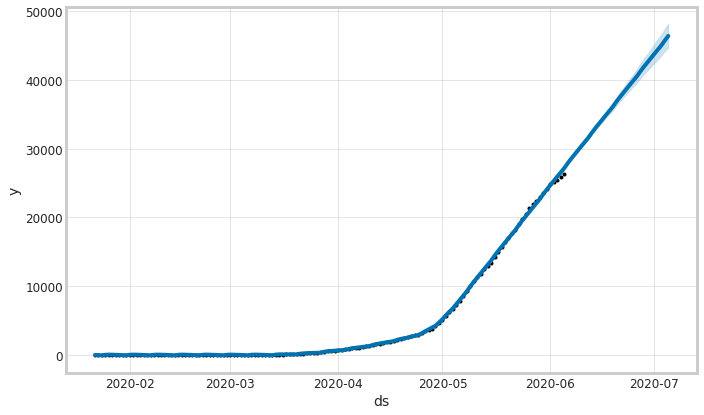

In [ ]:
prophet(dfs[23], dfs[23].name)

In [ ]:
m = Prophet()
m.fit(dfs[23])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MN_Predict':forecast.tail(30)['yhat'], 'MN_lower':forecast.tail(30)['yhat_lower'], 'MN_upper':forecast.tail(30)['yhat_upper'] } )
Minnesota = predictions.copy()

**Mississippi**

In [ ]:
print(dfs[24].name)

Mississippi


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Mississippi ====


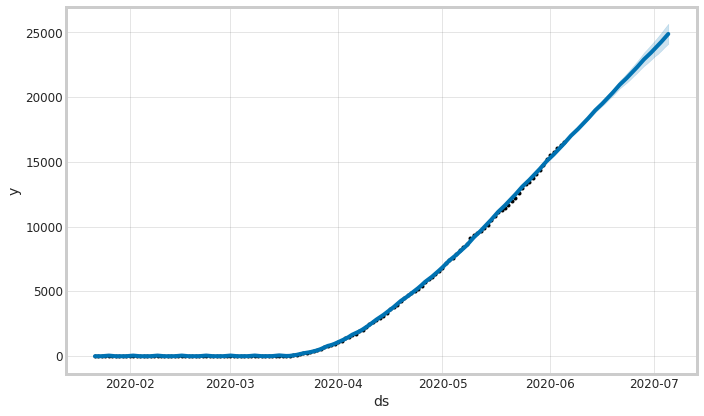

In [ ]:
prophet(dfs[24], dfs[24].name)

In [ ]:
m = Prophet()
m.fit(dfs[24])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MS_Predict':forecast.tail(30)['yhat'], 'MS_lower':forecast.tail(30)['yhat_lower'], 'MS_upper':forecast.tail(30)['yhat_upper'] } )
Mississippi = predictions.copy()

**Missouri**

In [ ]:
print(dfs[25].name)

Missouri


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Missouri ====


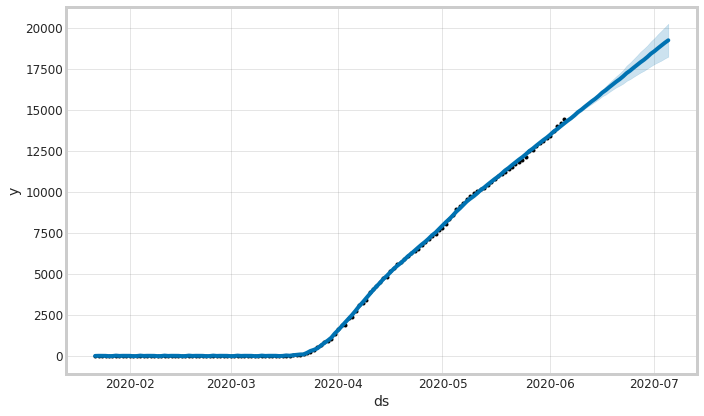

In [ ]:
prophet(dfs[25], dfs[25].name)

In [ ]:
m = Prophet()
m.fit(dfs[25])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MO_Predict':forecast.tail(30)['yhat'], 'MO_lower':forecast.tail(30)['yhat_lower'], 'MO_upper':forecast.tail(30)['yhat_upper'] } )
Missouri = predictions.copy()

**Montana**

In [ ]:
print(dfs[26].name)

Montana


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Montana ====


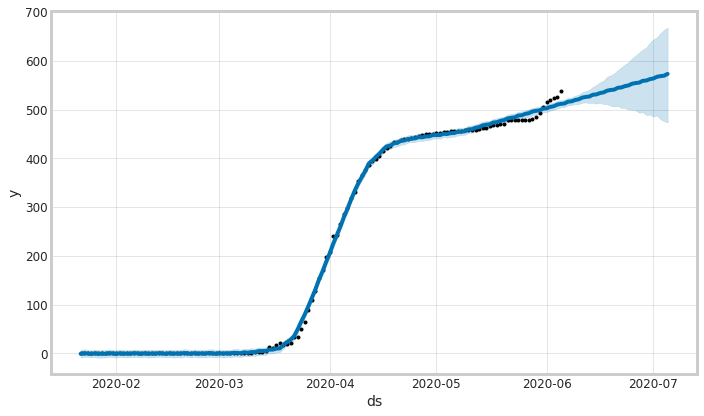

In [ ]:
prophet(dfs[26], dfs[26].name)

In [ ]:
m = Prophet()
m.fit(dfs[26])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'MT_Predict':forecast.tail(30)['yhat'], 'MT_lower':forecast.tail(30)['yhat_lower'], 'MT_upper':forecast.tail(30)['yhat_upper'] } )
Montana = predictions.copy()

**Nebraska**

In [ ]:
print(dfs[27].name)

Nebraska


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Nebraska ====


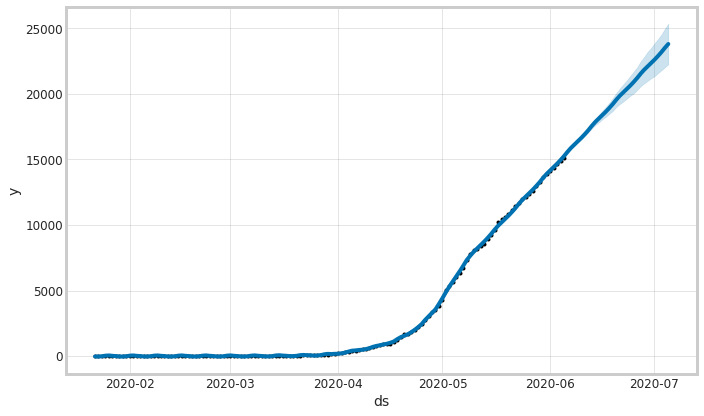

In [ ]:
prophet(dfs[27], dfs[27].name)

In [ ]:
m = Prophet()
m.fit(dfs[27])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NE_Predict':forecast.tail(30)['yhat'], 'NE_lower':forecast.tail(30)['yhat_lower'], 'NE_upper':forecast.tail(30)['yhat_upper'] } )
Nebraska = predictions.copy()

**Nevada**

In [ ]:
print(dfs[28].name)

Nevada


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Nevada ====


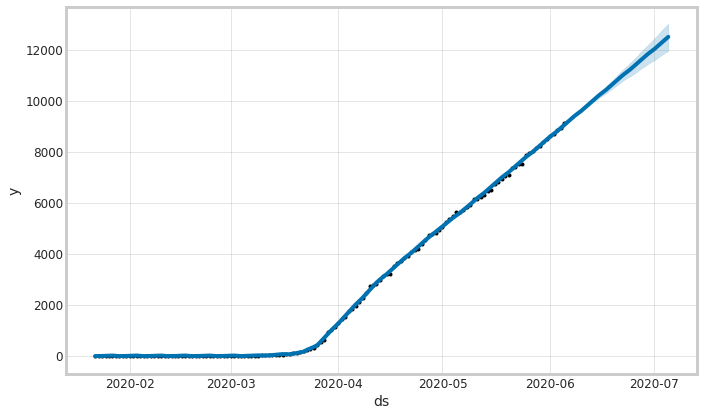

In [ ]:
prophet(dfs[28], dfs[28].name)

In [ ]:
m = Prophet()
m.fit(dfs[28])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NV_Predict':forecast.tail(30)['yhat'], 'NV_lower':forecast.tail(30)['yhat_lower'], 'NV_upper':forecast.tail(30)['yhat_upper'] } )
Nevada = predictions.copy()

**New Hampshire**

In [ ]:
print(dfs[29].name)

New Hampshire


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== New Hampshire ====


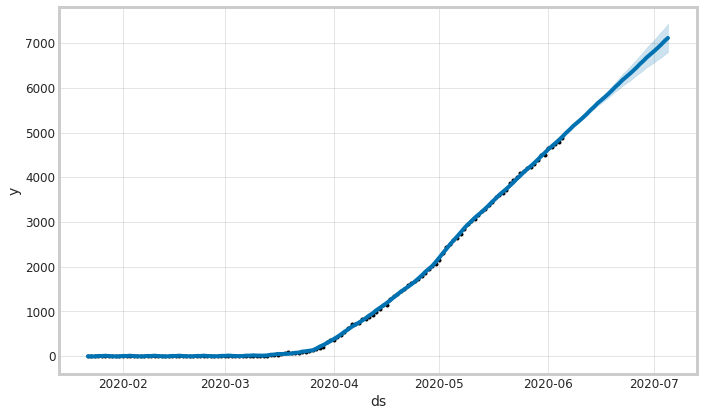

In [ ]:
prophet(dfs[29], dfs[29].name)

In [ ]:
m = Prophet()
m.fit(dfs[29])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NH_Predict':forecast.tail(30)['yhat'], 'NH_lower':forecast.tail(30)['yhat_lower'], 'NH_upper':forecast.tail(30)['yhat_upper'] } )
NH = predictions.copy()

In [ ]:
## Combine next 10
m20 = pd.merge(left=m19,right=Maryland, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m21 = pd.merge(left=m20,right=Massachusetts, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m22 = pd.merge(left=m21,right=Michigan, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m23 = pd.merge(left=m22,right=Minnesota, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m24 = pd.merge(left=m23,right=Mississippi, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m25 = pd.merge(left=m24,right=Missouri, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m26 = pd.merge(left=m25,right=Montana, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m27 = pd.merge(left=m26,right=Nebraska, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m28 = pd.merge(left=m27,right=Nevada, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m29 = pd.merge(left=m28,right=NH, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

**New Jersey**

In [ ]:
print(dfs[30].name)

New Jersey


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== New Jersey ====


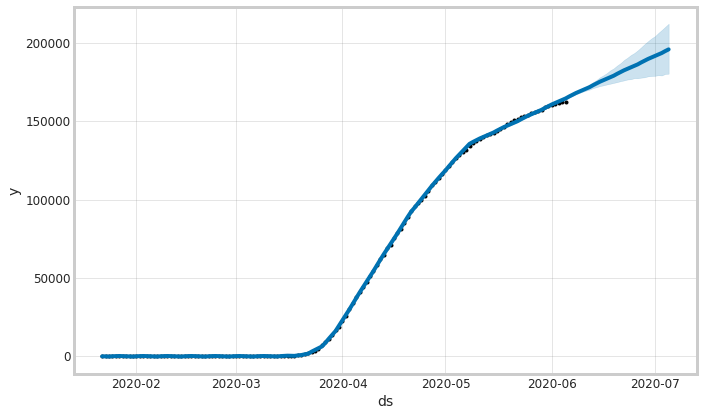

In [ ]:
prophet(dfs[30], dfs[30].name)

In [ ]:
m = Prophet()
m.fit(dfs[30])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NJ_Predict':forecast.tail(30)['yhat'], 'NJ_lower':forecast.tail(30)['yhat_lower'], 'NJ_upper':forecast.tail(30)['yhat_upper'] } )
NJ = predictions.copy()

**New Mexico**

In [ ]:
print(dfs[31].name)

New Mexico


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== New Mexico ====


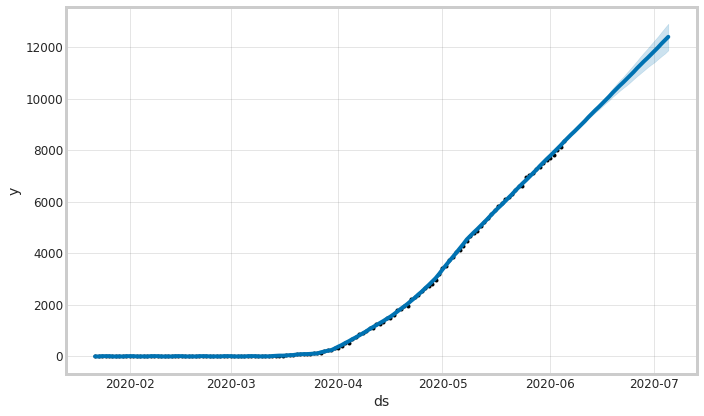

In [ ]:
prophet(dfs[31], dfs[31].name)

In [ ]:
m = Prophet()
m.fit(dfs[31])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NM_Predict':forecast.tail(30)['yhat'], 'NM_lower':forecast.tail(30)['yhat_lower'], 'NM_upper':forecast.tail(30)['yhat_upper'] } )
NM = predictions.copy()

**New York**

In [ ]:
print(dfs[32].name)

New York


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== New York ====


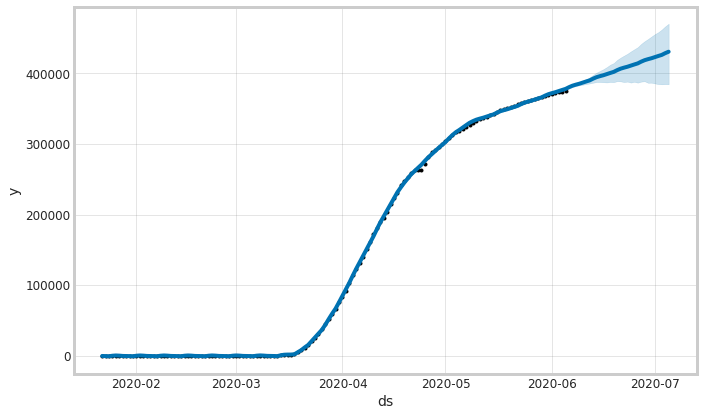

In [ ]:
prophet(dfs[32], dfs[32].name)

In [ ]:
m = Prophet()
m.fit(dfs[32])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NY_Predict':forecast.tail(30)['yhat'], 'NY_lower':forecast.tail(30)['yhat_lower'], 'NY_upper':forecast.tail(30)['yhat_upper'] } )
NY = predictions.copy()

**North Carolina**

In [ ]:
print(dfs[33].name)

North Carolina


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== North Carolina ====


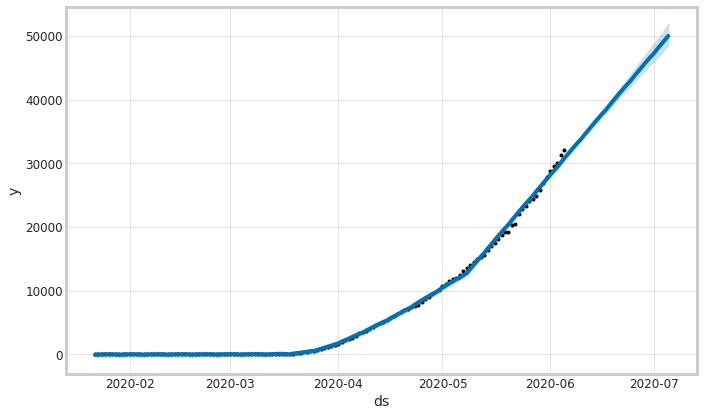

In [ ]:
prophet(dfs[33], dfs[33].name)

In [ ]:
m = Prophet()
m.fit(dfs[33])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'NC_Predict':forecast.tail(30)['yhat'], 'NC_lower':forecast.tail(30)['yhat_lower'], 'NC_upper':forecast.tail(30)['yhat_upper'] } )
NC = predictions.copy()

**North Dakota**

In [ ]:
print(dfs[34].name)

North Dakota


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== North Dakota ====


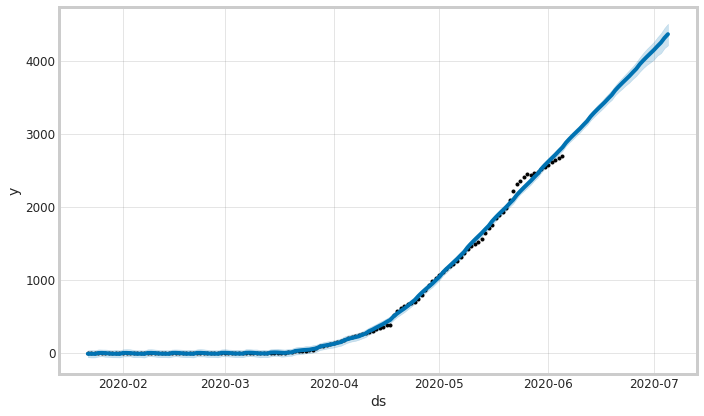

In [ ]:
prophet(dfs[34], dfs[34].name)

In [ ]:
m = Prophet()
m.fit(dfs[34])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'ND_Predict':forecast.tail(30)['yhat'], 'ND_lower':forecast.tail(30)['yhat_lower'], 'ND_upper':forecast.tail(30)['yhat_upper'] } )
ND = predictions.copy()

**Ohio**

In [ ]:
print(dfs[35].name)

Ohio


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Ohio ====


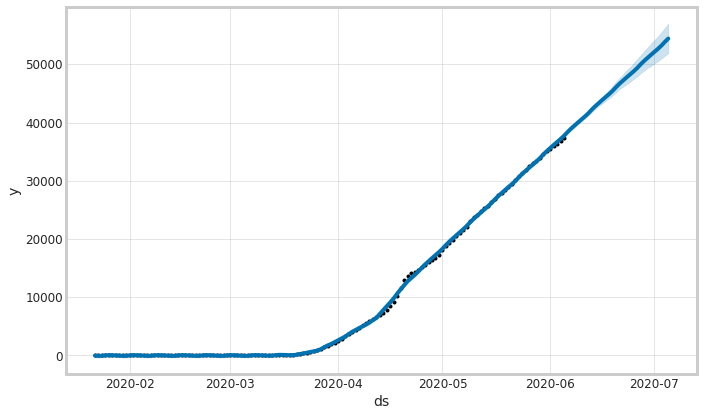

In [ ]:
prophet(dfs[35], dfs[35].name)

In [ ]:
m = Prophet()
m.fit(dfs[35])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'OH_Predict':forecast.tail(30)['yhat'], 'OH_lower':forecast.tail(30)['yhat_lower'], 'OH_upper':forecast.tail(30)['yhat_upper'] } )
OH = predictions.copy()

**Oklahoma**

In [ ]:
print(dfs[36].name)

Oklahoma


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Oklahoma ====


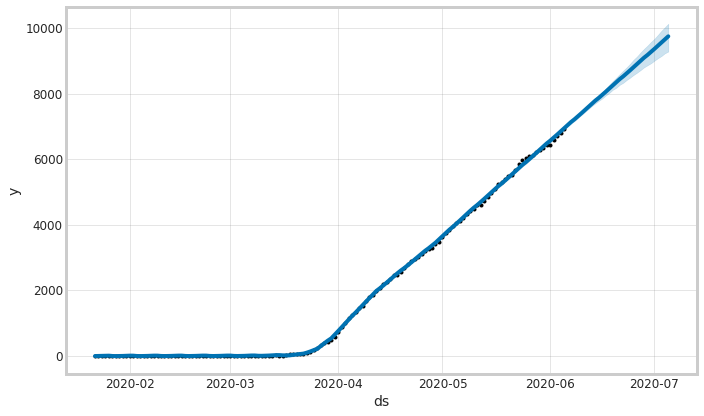

In [ ]:
prophet(dfs[36], dfs[36].name)

In [ ]:
m = Prophet()
m.fit(dfs[36])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'OK_Predict':forecast.tail(30)['yhat'], 'OK_lower':forecast.tail(30)['yhat_lower'], 'OK_upper':forecast.tail(30)['yhat_upper'] } )
OK = predictions.copy()

**Oregon**

In [ ]:
print(dfs[37].name)

Oregon


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Oregon ====


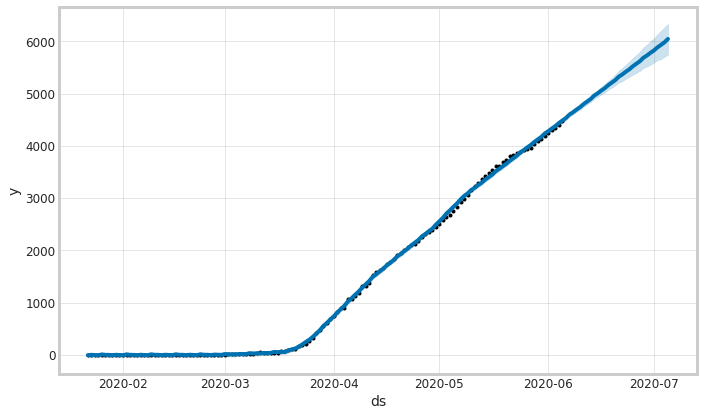

In [ ]:
prophet(dfs[37], dfs[37].name)

In [ ]:
m = Prophet()
m.fit(dfs[37])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'OR_Predict':forecast.tail(30)['yhat'], 'OR_lower':forecast.tail(30)['yhat_lower'], 'OR_upper':forecast.tail(30)['yhat_upper'] } )
Oregon = predictions.copy()

**Pennsylvania**

In [ ]:
print(dfs[38].name)

Pennsylvania


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Pennsylvania ====


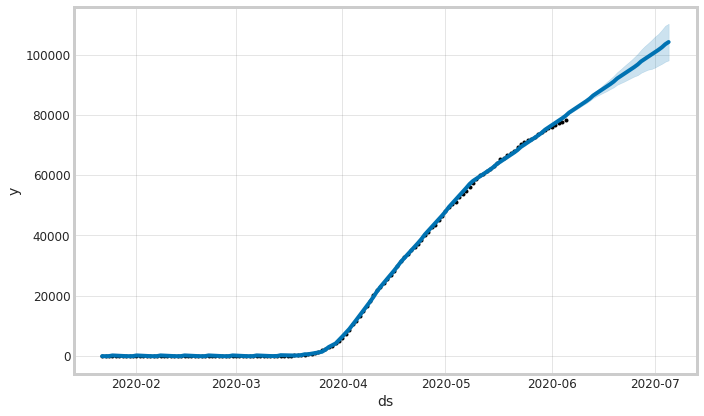

In [ ]:
prophet(dfs[38], dfs[38].name)

In [ ]:
m = Prophet()
m.fit(dfs[38])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'PA_Predict':forecast.tail(30)['yhat'], 'PA_lower':forecast.tail(30)['yhat_lower'], 'PA_upper':forecast.tail(30)['yhat_upper'] } )
PA = predictions.copy()

**Rhode Island**

In [ ]:
print(dfs[39].name)

Rhode Island


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Rhode Island ====


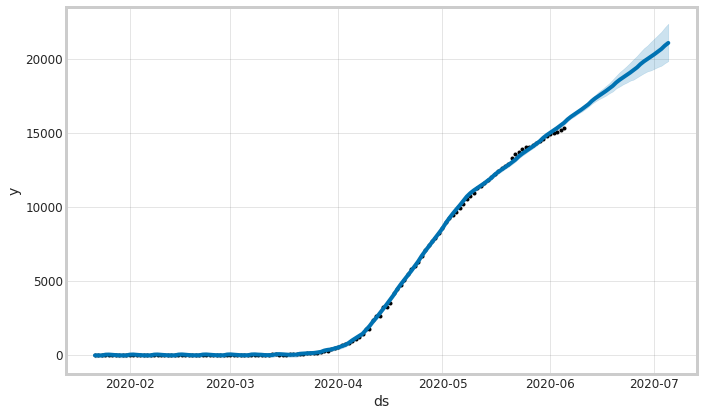

In [ ]:
prophet(dfs[39], dfs[39].name)

In [ ]:
m = Prophet()
m.fit(dfs[39])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'RI_Predict':forecast.tail(30)['yhat'], 'RI_lower':forecast.tail(30)['yhat_lower'], 'RI_upper':forecast.tail(30)['yhat_upper'] } )
RI = predictions.copy()

In [ ]:
## Combine next 10
m30 = pd.merge(left=m29,right=NJ, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m31 = pd.merge(left=m30,right=NM, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m32 = pd.merge(left=m31,right=NY, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m33 = pd.merge(left=m32,right=NC, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m34 = pd.merge(left=m33,right=ND, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m35 = pd.merge(left=m34,right=OH, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m36 = pd.merge(left=m35,right=OK, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m37 = pd.merge(left=m36,right=Oregon, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m38 = pd.merge(left=m37,right=PA, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m39 = pd.merge(left=m38,right=RI, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

**South Carolina**

In [ ]:
print(dfs[40].name)

South Carolina


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== South Carolina ====


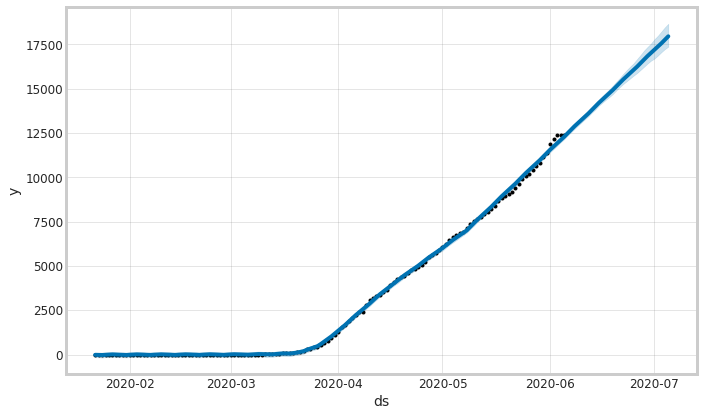

In [ ]:
prophet(dfs[40], dfs[40].name)

In [ ]:
m = Prophet()
m.fit(dfs[40])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'SC_Predict':forecast.tail(30)['yhat'], 'SC_lower':forecast.tail(30)['yhat_lower'], 'SC_upper':forecast.tail(30)['yhat_upper'] } )
SC = predictions.copy()

**South Dakota**

In [ ]:
print(dfs[41].name)

South Dakota


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== South Dakota ====


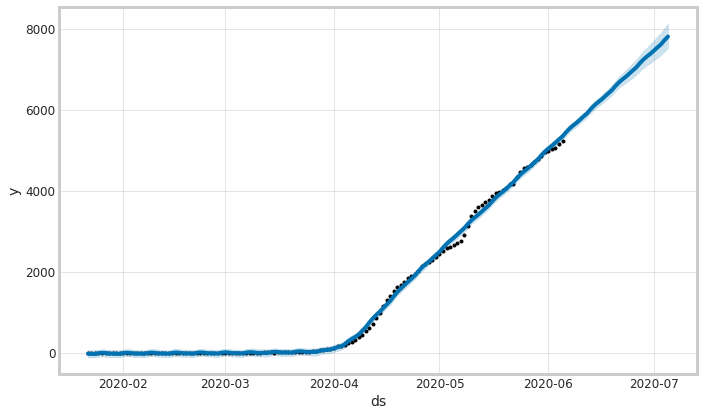

In [ ]:
prophet(dfs[41], dfs[41].name)

In [ ]:
m = Prophet()
m.fit(dfs[41])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'SD_Predict':forecast.tail(30)['yhat'], 'SD_lower':forecast.tail(30)['yhat_lower'], 'SD_upper':forecast.tail(30)['yhat_upper'] } )
SD = predictions.copy()

**Tennessee**

In [ ]:
print(dfs[42].name)

Tennessee


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Tennessee ====


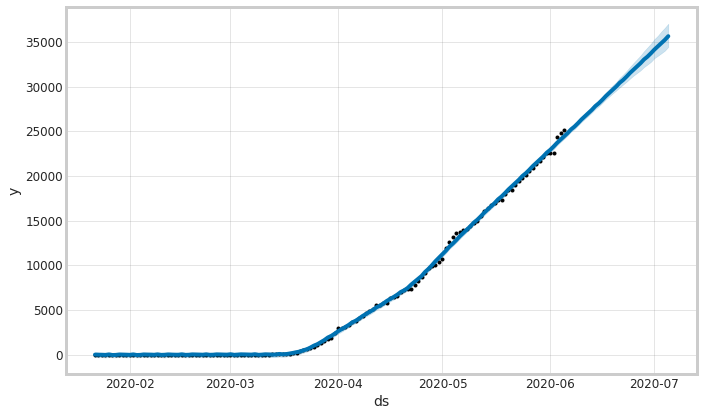

In [ ]:
prophet(dfs[42], dfs[42].name)

In [ ]:
m = Prophet()
m.fit(dfs[42])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'TN_Predict':forecast.tail(30)['yhat'], 'TN_lower':forecast.tail(30)['yhat_lower'], 'TN_upper':forecast.tail(30)['yhat_upper'] } )
TN = predictions.copy()

**Texas**

In [ ]:
print(dfs[43].name)

Texas


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Texas ====


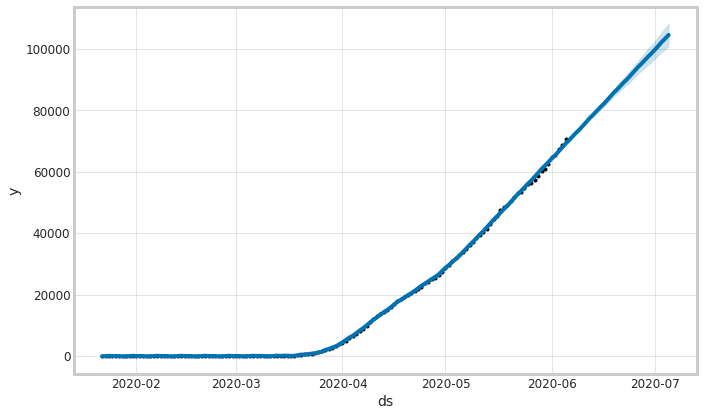

In [ ]:
prophet(dfs[43], dfs[43].name)

In [ ]:
m = Prophet()
m.fit(dfs[43])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'TX_Predict':forecast.tail(30)['yhat'], 'TX_lower':forecast.tail(30)['yhat_lower'], 'TX_upper':forecast.tail(30)['yhat_upper'] } )
TX = predictions.copy()

**Utah**

In [ ]:
print(dfs[44].name)

Utah


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Utah ====


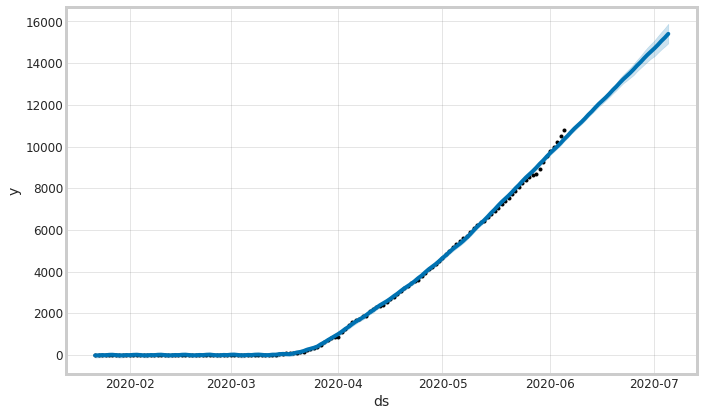

In [ ]:
prophet(dfs[44], dfs[44].name)

In [ ]:
m = Prophet()
m.fit(dfs[44])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'UT_Predict':forecast.tail(30)['yhat'], 'UT_lower':forecast.tail(30)['yhat_lower'], 'UT_upper':forecast.tail(30)['yhat_upper'] } )
UT = predictions.copy()

**Vermont**

In [ ]:
print(dfs[45].name)

Vermont


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Vermont ====


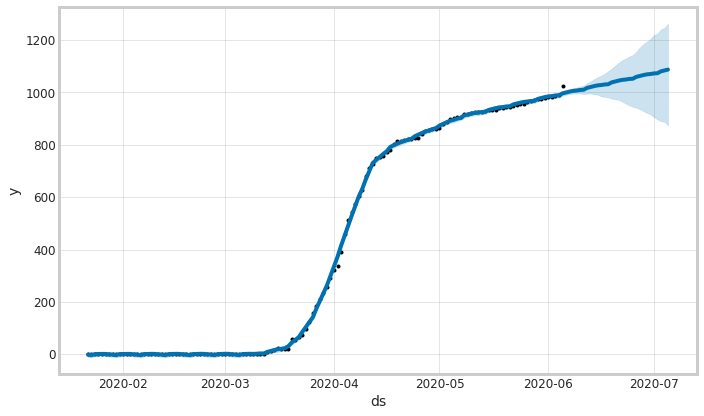

In [ ]:
prophet(dfs[45], dfs[45].name)

In [ ]:
m = Prophet()
m.fit(dfs[45])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'VT_Predict':forecast.tail(30)['yhat'], 'VT_lower':forecast.tail(30)['yhat_lower'], 'VT_upper':forecast.tail(30)['yhat_upper'] } )
VT = predictions.copy()

**Virginia**

In [ ]:
print(dfs[46].name)

Virginia


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Virginia ====


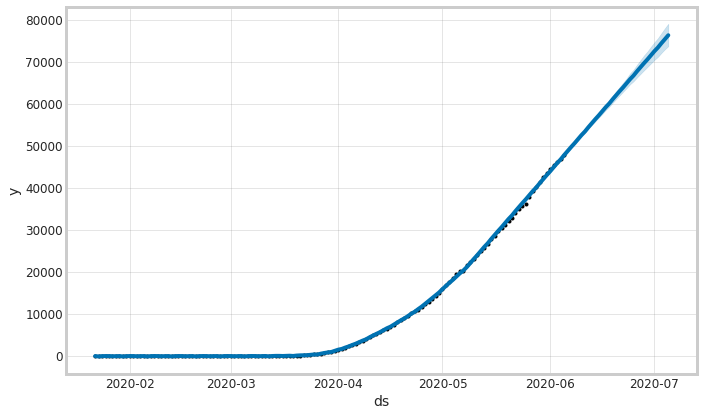

In [ ]:
prophet(dfs[46], dfs[46].name)

In [ ]:
m = Prophet()
m.fit(dfs[46])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'VA_Predict':forecast.tail(30)['yhat'], 'VA_lower':forecast.tail(30)['yhat_lower'], 'VA_upper':forecast.tail(30)['yhat_upper'] } )
VA = predictions.copy()

**Washington**

In [ ]:
print(dfs[47].name)

Washington


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Washington ====


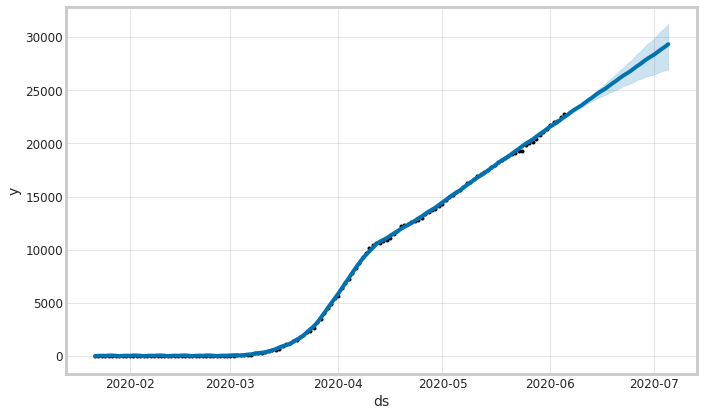

In [ ]:
prophet(dfs[47], dfs[47].name)

In [ ]:
m = Prophet()
m.fit(dfs[47])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'WA_Predict':forecast.tail(30)['yhat'], 'WA_lower':forecast.tail(30)['yhat_lower'], 'WA_upper':forecast.tail(30)['yhat_upper'] } )
WA = predictions.copy()

**West Virginia**

In [ ]:
print(dfs[48].name)

West Virginia


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== West Virginia ====


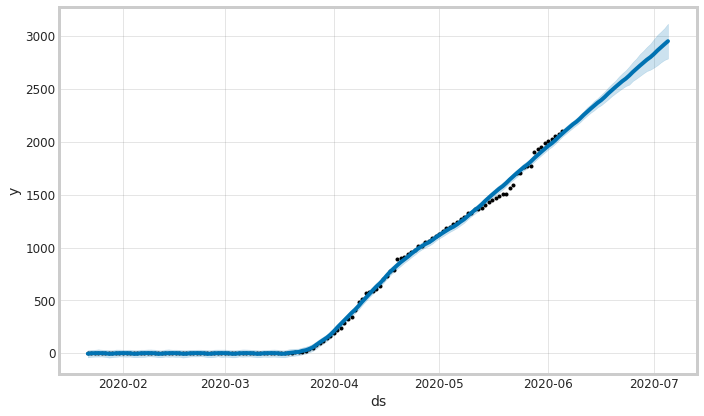

In [ ]:
prophet(dfs[48], dfs[48].name)

In [ ]:
m = Prophet()
m.fit(dfs[48])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'WV_Predict':forecast.tail(30)['yhat'], 'WV_lower':forecast.tail(30)['yhat_lower'], 'WV_upper':forecast.tail(30)['yhat_upper'] } )
WV = predictions.copy()

**Wisconsin**

In [ ]:
print(dfs[49].name)

Wisconsin


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Wisconsin ====


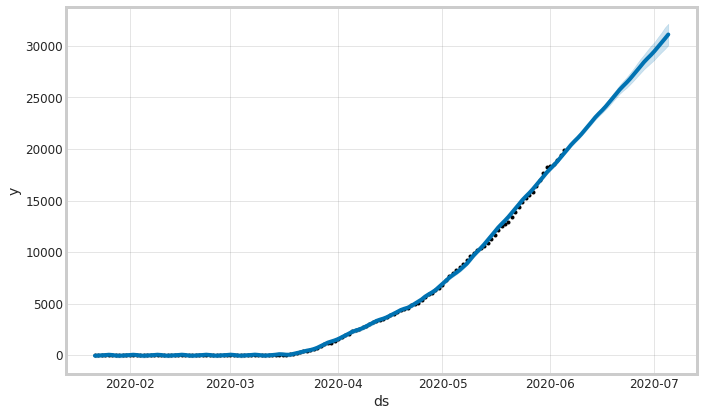

In [ ]:
prophet(dfs[49], dfs[49].name)

In [ ]:
m = Prophet()
m.fit(dfs[49])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'WI_Predict':forecast.tail(30)['yhat'], 'WI_lower':forecast.tail(30)['yhat_lower'], 'WI_upper':forecast.tail(30)['yhat_upper'] } )
WI = predictions.copy()

**Wyoming**

In [ ]:
print(dfs[50].name)

Wyoming


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


==== Wyoming ====


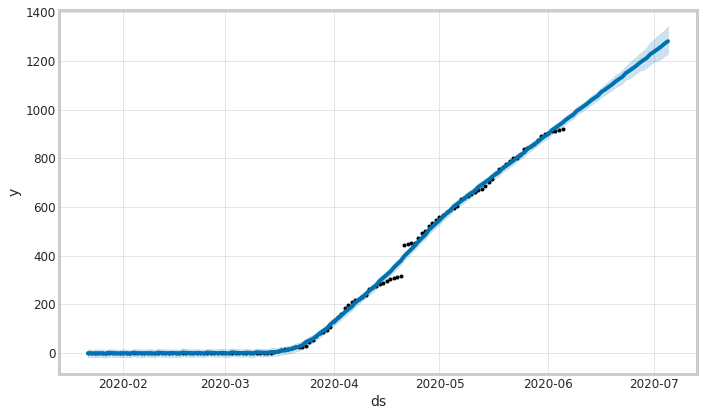

In [ ]:
prophet(dfs[50], dfs[50].name)

In [ ]:
m = Prophet()
m.fit(dfs[50])
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig1 = m.plot(forecast)

In [ ]:
predictions = pd.DataFrame({'Date': forecast.tail(30)['ds'], 'WY_Predict':forecast.tail(30)['yhat'], 'WY_lower':forecast.tail(30)['yhat_lower'], 'WY_upper':forecast.tail(30)['yhat_upper'] } )
WY = predictions.copy()

In [ ]:
## Combine next 10
m40 = pd.merge(left=m39,right=SC, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m41 = pd.merge(left=m40,right=SD, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m42 = pd.merge(left=m41,right=TN, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m43 = pd.merge(left=m42,right=TX, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m44 = pd.merge(left=m43,right=UT, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m45 = pd.merge(left=m44,right=VT, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m46 = pd.merge(left=m45,right=VA, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m47 = pd.merge(left=m46,right=WA, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m48 = pd.merge(left=m47,right=WV, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

m49 = pd.merge(left=m48,right=WI, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

ALL = pd.merge(left=m49,right=WY, 
                         left_on=['Date'], 
                         right_on=['Date'],
                         how='left')

In [ ]:
all_states_30dPred = ALL.copy()

In [ ]:
all_states_30dPred.to_csv('/content/drive/My Drive/data/prophet_all.csv')